In [ ]:
!pip install pytorch_lightning

In [ ]:
!pip install optuna

In [19]:
!pip install rich

In [20]:
!pip install pyyaml==5.4.1

In [21]:
import matplotlib.pyplot as plt # plotting library
import numpy as np # this module is useful to work with numerical arrays
import pandas as pd # this module is useful to work with tabular data
import random # this module will be used to select random samples from a collection
import os # this module will be used just to create directories in the local filesystem
from tqdm import tqdm # this module is useful to plot progress bars
from rich.jupyter import print
import plotly.io as pio
pio.renderers.default = 'colab'
import joblib
import torch
import torchvision
from torchvision import transforms
from torch.utils.data import DataLoader,random_split
from torch import nn
import torch.nn.functional as F
import torch.optim as optim
# Pytorch lightning 
import pytorch_lightning as pl
from pytorch_lightning import Callback
from pytorch_lightning.callbacks.early_stopping import EarlyStopping

# Optuna for gridsearch
import optuna
from optuna.integration import PyTorchLightningPruningCallback

from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import plotly.express as px


## 1. Import dataset

In [22]:
data_dir = 'dataset'
### With these commands the train and test datasets, respectively, are downloaded
### automatically and stored in the local "data_dir" directory.
train_dataset = torchvision.datasets.FashionMNIST(data_dir, train=True, download=True)
test_dataset  = torchvision.datasets.FashionMNIST(data_dir, train=False, download=True)

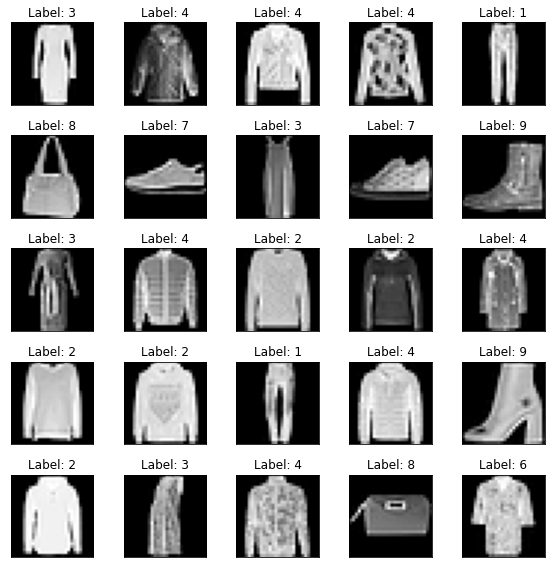

In [23]:
fig, axs = plt.subplots(5, 5, figsize=(8,8))
for ax in axs.flatten():
    # random.choice allows to randomly sample from a list-like object (basically anything that can be accessed with an index, like our dataset)
    img, label = random.choice(train_dataset)
    ax.imshow(np.array(img), cmap='gist_gray')
    ax.set_title('Label: %d' % label)
    ax.set_xticks([])
    ax.set_yticks([])
plt.tight_layout()

In [24]:
train_transform = transforms.Compose([
    transforms.ToTensor(),
])
test_transform = transforms.Compose([
    transforms.ToTensor(),
])

# Set the train transform
train_dataset.transform = train_transform
# Set the test transform
test_dataset.transform = test_transform

In [25]:
m=len(train_dataset)

#random_split randomly split a dataset into non-overlapping new datasets of given lengths
#train (55,000 images), val split (5,000 images)
train_data, val_data = random_split(train_dataset, [int(m-m*0.2), int(m*0.2)])

batch_size=256

# The dataloaders handle shuffling, batching, etc...
train_loader = torch.utils.data.DataLoader(train_data, batch_size=batch_size)
valid_loader = torch.utils.data.DataLoader(val_data, batch_size=batch_size)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size,shuffle=True)

Support functions

In [26]:
loss_func = nn.MSELoss()

In [27]:
DIR = os.getcwd()
MODEL_DIR = os.path.join(DIR, "results")
if not os.path.exists(MODEL_DIR):
    os.makedirs(MODEL_DIR)
print(MODEL_DIR)

/content/results

## 2. Define Convolutional Autoencoder

In [28]:
class AutoEncoder_optuna(pl.LightningModule):

    def __init__(self, trial):

        super().__init__()
        
        # optuna functionality for selecting initial value.                                                                  
        encoded_space_dim = trial.suggest_int('encoded_space_dim', 2, 100) # sampled from the integers in [2,100]
        n_channels = trial.suggest_int('n_channels', 4, 10)                # sampled from the integers in [4,10]
        
        self.trial = trial
        
        # Encoder
        self.encoder = nn.Sequential( # First convolutional layer
                                      # --> img size = (28-3+2*1)/2+1= 15x15 
                                      nn.Conv2d(1, n_channels, kernel_size=3, padding=1, stride=2),
                                      nn.ReLU(),
                                      # Second convolutional layer
                                      # --> img size = (15-3+2*1)/2+1= 8x8 
                                      nn.Conv2d(n_channels, 2*n_channels, kernel_size=3, padding=1, stride=2),
                                      nn.ReLU(),
                                      # Third convolutional layer
                                      # --> img size = (8-3+2*0)/2+1= 3x3
                                      nn.Conv2d(2*n_channels, 4*n_channels, kernel_size=3, padding=0, stride=2),
                                      nn.ReLU(),
                                      # Flatten layer
                                      nn.Flatten(start_dim=1),
                                      # First linear layer
                                      # number of input units = (img size)x(4*n_channels) = 36*n_channels
                                      nn.Linear(36*n_channels, 64), # arbitrary number of output units
                                      nn.ReLU(),
                                      # Second linear layer (output layer)
                                      nn.Linear(64, encoded_space_dim)
                                    )
        # Decoder
        self.decoder =  nn.Sequential( # First linear layer
                                       nn.Linear(encoded_space_dim, 64), 
                                       nn.ReLU(True),
                                       # Second linear layer
                                       # number of input units = (img size)x(4*n_channels) = 36*n_channels
                                       nn.Linear(64, 36*n_channels), 
                                       nn.ReLU(True),
                                       # Unflatten, fix images dimensions: 4*n_channels, 3x3 imgs 
                                       nn.Unflatten(dim=1, unflattened_size=(4*n_channels, 3, 3)),
                                       # First transposed convolution
                                       # --> img size = (3-1)*2-2*0+3-1+0+1 = 7x7
                                       nn.ConvTranspose2d(4*n_channels, 2*n_channels, kernel_size=3, 
                                                           output_padding=0, stride=2),
                                        nn.ReLU(True),
                                        # Second transposed convolution
                                       # --> img size = (7-1)*2-2*1+3-1+1+1 = 14x14
                                        nn.ConvTranspose2d(2*n_channels, n_channels, kernel_size=3, 
                                                           output_padding=1, padding=1, stride=2),
                                        nn.ReLU(True),
                                        # Third transposed convolution
                                       # --> img size = (14-1)*2-2*1+3-1+1+1 = 28x28
                                        nn.ConvTranspose2d(n_channels, 1, kernel_size=3, 
                                                           output_padding=1, padding=1, stride=2),
                                        # To obtain an output in [0,1]
                                        nn.Sigmoid()
                                    )
        self.configure_loss(loss_func)
        
    def forward(self, x):
        # With Pytorch Lightning, training is separated from inference. 
        # The forward defines inference actions.
        embedding = self.encoder(x)
        return embedding

    def training_step(self, batch, batch_idx):
        # With Pytorch Lightning, training is separated from inference. 
        # The training_step defines the full training loop. 
        x, y = batch
        z = self.encoder(x)
        x_hat = self.decoder(z)
        train_loss = self.loss_func(x_hat, x)
        self.log('train_loss', train_loss)
        return train_loss
    
    def validation_step(self, batch, batch_idx, loss_name='valid_loss'): 
        # Similarly to the training_step we define the validation_step 
        x, y = batch
        z = self.encoder(x)
        x_hat = self.decoder(z)
        val_loss = self.loss_func(x_hat, x)
        self.log(loss_name, val_loss, prog_bar=True)
        return val_loss
    
    def test_step(self, batch, batch_idx):
        self.validation_step(batch, batch_idx, loss_name='test_loss')

    def configure_optimizers(self):
        opt = self.trial.suggest_categorical('optimizer', ['sgd', 'Adam'])
        lr  = self.trial.suggest_loguniform('learning_rate', 1e-5, 5e-3)
        wd  = self.trial.suggest_loguniform('weight_decay', 1e-6, 1e-4)
        mom = self.trial.suggest_uniform('momentum', 0.6, 1.)
        if opt=='sgd':
            optimizer = torch.optim.SGD(self.parameters(), lr=lr, momentum=mom, weight_decay=wd)
        elif opt=='Adam':
            optimizer = torch.optim.Adam(self.parameters(), lr=lr, weight_decay=wd)
            
        return optimizer
    
    def configure_loss(self, loss_func):
        self.loss_func = loss_func

Define Pytorch Lightning callbacks

In [29]:
class MetricsCallback(Callback):
    '''
    To return losses and other metrics logged during training and validation.
    '''

    def __init__(self):
        super().__init__()
        self.metrics = []

    def on_validation_end(self, trainer, pl_module):
        self.metrics.append(trainer.callback_metrics)

Optuna hyperparameter optimization

In [30]:
PERCENT_TEST_EXAMPLES = 1

def objective(trial):
    # Function to optimize from optuna
    checkpoint_callback = pl.callbacks.ModelCheckpoint(
        os.path.join(MODEL_DIR, "trial_{}".format(trial.number)), monitor="valid_loss" )

    metrics_callback = MetricsCallback()
    
    trainer = pl.Trainer( logger=False,
                          checkpoint_callback=checkpoint_callback,
                          max_epochs=20,
                          gpus=-1 if torch.cuda.is_available() else None,
                          callbacks=[ metrics_callback, 
                                      PyTorchLightningPruningCallback(trial, monitor="valid_loss")],
                         )

    model = AutoEncoder_optuna(trial)
    trainer.fit(model, train_loader, valid_loader)
    
    return metrics_callback.metrics[-1]["valid_loss"].item()

In [31]:
pruner = optuna.pruners.MedianPruner()
study = optuna.create_study(direction="minimize", pruner=pruner)
joblib.dump(study, "optimize_hyperparams.pkl")

study.enqueue_trial({'encoded_space_dim': 14, 'n_channels': 8, 'optimizer': 'Adam', 
                     'learning_rate': 1e-3, 'weight_decay': 1e-5, 'momentum': 0.9})# select starting point

study.optimize(objective, n_trials=20, timeout=None)

[I 2022-02-06 13:54:48,694] A new study created in memory with name: no-name-a4a274e4-a660-4523-8a6a-e88b48e99072
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: ExperimentalWarning:

enqueue_trial is experimental (supported from v1.2.0). The interface can change in the future.

/usr/local/lib/python3.7/dist-packages/optuna/study/study.py:857: ExperimentalWarning:

create_trial is experimental (supported from v2.0.0). The interface can change in the future.

/usr/local/lib/python3.7/dist-packages/optuna/study/study.py:857: ExperimentalWarning:

add_trial is experimental (supported from v2.0.0). The interface can change in the future.

/usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/connectors/callback_connector.py:148: LightningDeprecationWarning:

Setting `Trainer(checkpoint_callback=<pytorch_lightning.callbacks.model_checkpoint.ModelCheckpoint object at 0x7fbbafb20450>)` is deprecated in v1.5 and will be removed in v1.7. Please consider using `Trainer

Validation sanity check: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

/usr/local/lib/python3.7/dist-packages/optuna/trial/_trial.py:592: UserWarning:

The reported value is ignored because this `step` 0 is already reported.



Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

[I 2022-02-06 13:58:57,078] Trial 0 finished with value: 0.016608916223049164 and parameters: {'encoded_space_dim': 14, 'n_channels': 8, 'optimizer': 'Adam', 'learning_rate': 0.001, 'weight_decay': 1e-05, 'momentum': 0.9}. Best is trial 0 with value: 0.016608916223049164.
/usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/connectors/callback_connector.py:148: LightningDeprecationWarning:

Setting `Trainer(checkpoint_callback=<pytorch_lightning.callbacks.model_checkpoint.ModelCheckpoint object at 0x7fbbafd08e10>)` is deprecated in v1.5 and will be removed in v1.7. Please consider using `Trainer(enable_checkpointing=<pytorch_lightning.callbacks.model_checkpoint.ModelCheckpoint object at 0x7fbbafd08e10>)`.

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 24.7 K
1 | de

Validation sanity check: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

/usr/local/lib/python3.7/dist-packages/optuna/trial/_trial.py:592: UserWarning:

The reported value is ignored because this `step` 0 is already reported.



Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

[I 2022-02-06 14:02:47,885] Trial 1 finished with value: 0.12721124291419983 and parameters: {'encoded_space_dim': 62, 'n_channels': 7, 'optimizer': 'sgd', 'learning_rate': 0.0011609968441487653, 'weight_decay': 3.209753638527646e-05, 'momentum': 0.6877087415467242}. Best is trial 0 with value: 0.016608916223049164.
/usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/connectors/callback_connector.py:148: LightningDeprecationWarning:

Setting `Trainer(checkpoint_callback=<pytorch_lightning.callbacks.model_checkpoint.ModelCheckpoint object at 0x7fbbafd9d810>)` is deprecated in v1.5 and will be removed in v1.7. Please consider using `Trainer(enable_checkpointing=<pytorch_lightning.callbacks.model_checkpoint.ModelCheckpoint object at 0x7fbbafd9d810>)`.

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name      | Type       | Params
---------------------------------------

Validation sanity check: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

/usr/local/lib/python3.7/dist-packages/optuna/trial/_trial.py:592: UserWarning:

The reported value is ignored because this `step` 0 is already reported.



Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

[I 2022-02-06 14:06:35,058] Trial 2 finished with value: 0.021157003939151764 and parameters: {'encoded_space_dim': 4, 'n_channels': 5, 'optimizer': 'Adam', 'learning_rate': 0.003470087670011143, 'weight_decay': 3.283946636029669e-05, 'momentum': 0.9157884453372462}. Best is trial 0 with value: 0.016608916223049164.
/usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/connectors/callback_connector.py:148: LightningDeprecationWarning:

Setting `Trainer(checkpoint_callback=<pytorch_lightning.callbacks.model_checkpoint.ModelCheckpoint object at 0x7fbbafebc8d0>)` is deprecated in v1.5 and will be removed in v1.7. Please consider using `Trainer(enable_checkpointing=<pytorch_lightning.callbacks.model_checkpoint.ModelCheckpoint object at 0x7fbbafebc8d0>)`.

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name      | Type       | Params
---------------------------------------

Validation sanity check: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

/usr/local/lib/python3.7/dist-packages/optuna/trial/_trial.py:592: UserWarning:

The reported value is ignored because this `step` 0 is already reported.



Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

[I 2022-02-06 14:10:24,144] Trial 3 finished with value: 0.022668063640594482 and parameters: {'encoded_space_dim': 72, 'n_channels': 7, 'optimizer': 'Adam', 'learning_rate': 0.000245758815950913, 'weight_decay': 1.4512611510912663e-05, 'momentum': 0.629690779466745}. Best is trial 0 with value: 0.016608916223049164.
/usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/connectors/callback_connector.py:148: LightningDeprecationWarning:

Setting `Trainer(checkpoint_callback=<pytorch_lightning.callbacks.model_checkpoint.ModelCheckpoint object at 0x7fbbc3fe7950>)` is deprecated in v1.5 and will be removed in v1.7. Please consider using `Trainer(enable_checkpointing=<pytorch_lightning.callbacks.model_checkpoint.ModelCheckpoint object at 0x7fbbc3fe7950>)`.

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name      | Type       | Params
--------------------------------------

Validation sanity check: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

/usr/local/lib/python3.7/dist-packages/optuna/trial/_trial.py:592: UserWarning:

The reported value is ignored because this `step` 0 is already reported.



Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

[I 2022-02-06 14:14:18,717] Trial 4 finished with value: 0.12670114636421204 and parameters: {'encoded_space_dim': 95, 'n_channels': 10, 'optimizer': 'sgd', 'learning_rate': 0.0002991115051843501, 'weight_decay': 1.2255812926343638e-06, 'momentum': 0.9015166775374223}. Best is trial 0 with value: 0.016608916223049164.
/usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/connectors/callback_connector.py:148: LightningDeprecationWarning:

Setting `Trainer(checkpoint_callback=<pytorch_lightning.callbacks.model_checkpoint.ModelCheckpoint object at 0x7fbbc0d0fa50>)` is deprecated in v1.5 and will be removed in v1.7. Please consider using `Trainer(enable_checkpointing=<pytorch_lightning.callbacks.model_checkpoint.ModelCheckpoint object at 0x7fbbc0d0fa50>)`.

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name      | Type       | Params
-------------------------------------

Validation sanity check: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

/usr/local/lib/python3.7/dist-packages/optuna/trial/_trial.py:592: UserWarning:

The reported value is ignored because this `step` 0 is already reported.



Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

[I 2022-02-06 14:18:06,893] Trial 5 finished with value: 0.017572443932294846 and parameters: {'encoded_space_dim': 76, 'n_channels': 6, 'optimizer': 'Adam', 'learning_rate': 0.0009238492381167966, 'weight_decay': 2.0365837537500144e-05, 'momentum': 0.6336304235336282}. Best is trial 0 with value: 0.016608916223049164.
/usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/connectors/callback_connector.py:148: LightningDeprecationWarning:

Setting `Trainer(checkpoint_callback=<pytorch_lightning.callbacks.model_checkpoint.ModelCheckpoint object at 0x7fbbc07f95d0>)` is deprecated in v1.5 and will be removed in v1.7. Please consider using `Trainer(enable_checkpointing=<pytorch_lightning.callbacks.model_checkpoint.ModelCheckpoint object at 0x7fbbc07f95d0>)`.

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name      | Type       | Params
------------------------------------

Validation sanity check: 0it [00:00, ?it/s]

[I 2022-02-06 14:18:07,208] Trial 6 pruned. Trial was pruned at epoch 0.
/usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/connectors/callback_connector.py:148: LightningDeprecationWarning:

Setting `Trainer(checkpoint_callback=<pytorch_lightning.callbacks.model_checkpoint.ModelCheckpoint object at 0x7fbbce75a810>)` is deprecated in v1.5 and will be removed in v1.7. Please consider using `Trainer(enable_checkpointing=<pytorch_lightning.callbacks.model_checkpoint.ModelCheckpoint object at 0x7fbbce75a810>)`.

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 27.7 K
1 | decoder   | Sequential | 27.9 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
55.6 K    Trainable params
0         Non-trainable params
55.6 K    Total params
0.222     T

Validation sanity check: 0it [00:00, ?it/s]

[I 2022-02-06 14:18:07,508] Trial 7 pruned. Trial was pruned at epoch 0.
/usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/connectors/callback_connector.py:148: LightningDeprecationWarning:

Setting `Trainer(checkpoint_callback=<pytorch_lightning.callbacks.model_checkpoint.ModelCheckpoint object at 0x7fbbce788650>)` is deprecated in v1.5 and will be removed in v1.7. Please consider using `Trainer(enable_checkpointing=<pytorch_lightning.callbacks.model_checkpoint.ModelCheckpoint object at 0x7fbbce788650>)`.

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 19.8 K
1 | decoder   | Sequential | 19.9 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
39.7 K    Trainable params
0         Non-trainable params
39.7 K    Total params
0.159     T

Validation sanity check: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

/usr/local/lib/python3.7/dist-packages/optuna/trial/_trial.py:592: UserWarning:

The reported value is ignored because this `step` 0 is already reported.



Validating: 0it [00:00, ?it/s]

[I 2022-02-06 14:18:29,892] Trial 8 pruned. Trial was pruned at epoch 1.
/usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/connectors/callback_connector.py:148: LightningDeprecationWarning:

Setting `Trainer(checkpoint_callback=<pytorch_lightning.callbacks.model_checkpoint.ModelCheckpoint object at 0x7fbbc0948b90>)` is deprecated in v1.5 and will be removed in v1.7. Please consider using `Trainer(enable_checkpointing=<pytorch_lightning.callbacks.model_checkpoint.ModelCheckpoint object at 0x7fbbc0948b90>)`.

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 29.2 K
1 | decoder   | Sequential | 29.5 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
58.7 K    Trainable params
0         Non-trainable params
58.7 K    Total params
0.235     T

Validation sanity check: 0it [00:00, ?it/s]

[I 2022-02-06 14:18:30,218] Trial 9 pruned. Trial was pruned at epoch 0.
/usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/connectors/callback_connector.py:148: LightningDeprecationWarning:

Setting `Trainer(checkpoint_callback=<pytorch_lightning.callbacks.model_checkpoint.ModelCheckpoint object at 0x7fbbc07ee550>)` is deprecated in v1.5 and will be removed in v1.7. Please consider using `Trainer(enable_checkpointing=<pytorch_lightning.callbacks.model_checkpoint.ModelCheckpoint object at 0x7fbbc07ee550>)`.

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 34.0 K
1 | decoder   | Sequential | 34.3 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
68.3 K    Trainable params
0         Non-trainable params
68.3 K    Total params
0.273     T

Validation sanity check: 0it [00:00, ?it/s]

[I 2022-02-06 14:18:30,547] Trial 10 pruned. Trial was pruned at epoch 0.
/usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/connectors/callback_connector.py:148: LightningDeprecationWarning:

Setting `Trainer(checkpoint_callback=<pytorch_lightning.callbacks.model_checkpoint.ModelCheckpoint object at 0x7fbbc0c93e90>)` is deprecated in v1.5 and will be removed in v1.7. Please consider using `Trainer(enable_checkpointing=<pytorch_lightning.callbacks.model_checkpoint.ModelCheckpoint object at 0x7fbbc0c93e90>)`.

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 15.9 K
1 | decoder   | Sequential | 15.9 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
31.8 K    Trainable params
0         Non-trainable params
31.8 K    Total params
0.127     

Validation sanity check: 0it [00:00, ?it/s]

[I 2022-02-06 14:18:30,900] Trial 11 pruned. Trial was pruned at epoch 0.
/usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/connectors/callback_connector.py:148: LightningDeprecationWarning:

Setting `Trainer(checkpoint_callback=<pytorch_lightning.callbacks.model_checkpoint.ModelCheckpoint object at 0x7fbbce79c810>)` is deprecated in v1.5 and will be removed in v1.7. Please consider using `Trainer(enable_checkpointing=<pytorch_lightning.callbacks.model_checkpoint.ModelCheckpoint object at 0x7fbbce79c810>)`.

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 27.3 K
1 | decoder   | Sequential | 27.5 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
54.8 K    Trainable params
0         Non-trainable params
54.8 K    Total params
0.219     

Validation sanity check: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

/usr/local/lib/python3.7/dist-packages/optuna/trial/_trial.py:592: UserWarning:

The reported value is ignored because this `step` 0 is already reported.



Validating: 0it [00:00, ?it/s]

[I 2022-02-06 14:18:54,301] Trial 12 pruned. Trial was pruned at epoch 1.
/usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/connectors/callback_connector.py:148: LightningDeprecationWarning:

Setting `Trainer(checkpoint_callback=<pytorch_lightning.callbacks.model_checkpoint.ModelCheckpoint object at 0x7fbbc5e67290>)` is deprecated in v1.5 and will be removed in v1.7. Please consider using `Trainer(enable_checkpointing=<pytorch_lightning.callbacks.model_checkpoint.ModelCheckpoint object at 0x7fbbc5e67290>)`.

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 22.4 K
1 | decoder   | Sequential | 22.5 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
44.8 K    Trainable params
0         Non-trainable params
44.8 K    Total params
0.179     

Validation sanity check: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

/usr/local/lib/python3.7/dist-packages/optuna/trial/_trial.py:592: UserWarning:

The reported value is ignored because this `step` 0 is already reported.



Validating: 0it [00:00, ?it/s]

[I 2022-02-06 14:19:17,219] Trial 13 pruned. Trial was pruned at epoch 1.
/usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/connectors/callback_connector.py:148: LightningDeprecationWarning:

Setting `Trainer(checkpoint_callback=<pytorch_lightning.callbacks.model_checkpoint.ModelCheckpoint object at 0x7fbbc0c93390>)` is deprecated in v1.5 and will be removed in v1.7. Please consider using `Trainer(enable_checkpointing=<pytorch_lightning.callbacks.model_checkpoint.ModelCheckpoint object at 0x7fbbc0c93390>)`.

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 26.4 K
1 | decoder   | Sequential | 26.6 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
53.0 K    Trainable params
0         Non-trainable params
53.0 K    Total params
0.212     

Validation sanity check: 0it [00:00, ?it/s]

[I 2022-02-06 14:19:17,584] Trial 14 pruned. Trial was pruned at epoch 0.
/usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/connectors/callback_connector.py:148: LightningDeprecationWarning:

Setting `Trainer(checkpoint_callback=<pytorch_lightning.callbacks.model_checkpoint.ModelCheckpoint object at 0x7fbbce788b50>)` is deprecated in v1.5 and will be removed in v1.7. Please consider using `Trainer(enable_checkpointing=<pytorch_lightning.callbacks.model_checkpoint.ModelCheckpoint object at 0x7fbbce788b50>)`.

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 21.3 K
1 | decoder   | Sequential | 21.4 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
42.6 K    Trainable params
0         Non-trainable params
42.6 K    Total params
0.171     

Validation sanity check: 0it [00:00, ?it/s]

[I 2022-02-06 14:19:17,909] Trial 15 pruned. Trial was pruned at epoch 0.
/usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/connectors/callback_connector.py:148: LightningDeprecationWarning:

Setting `Trainer(checkpoint_callback=<pytorch_lightning.callbacks.model_checkpoint.ModelCheckpoint object at 0x7fbbce7f2790>)` is deprecated in v1.5 and will be removed in v1.7. Please consider using `Trainer(enable_checkpointing=<pytorch_lightning.callbacks.model_checkpoint.ModelCheckpoint object at 0x7fbbce7f2790>)`.

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 29.4 K
1 | decoder   | Sequential | 29.7 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
59.1 K    Trainable params
0         Non-trainable params
59.1 K    Total params
0.236     

Validation sanity check: 0it [00:00, ?it/s]

[I 2022-02-06 14:19:18,223] Trial 16 pruned. Trial was pruned at epoch 0.
/usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/connectors/callback_connector.py:148: LightningDeprecationWarning:

Setting `Trainer(checkpoint_callback=<pytorch_lightning.callbacks.model_checkpoint.ModelCheckpoint object at 0x7fbbce8aaf10>)` is deprecated in v1.5 and will be removed in v1.7. Please consider using `Trainer(enable_checkpointing=<pytorch_lightning.callbacks.model_checkpoint.ModelCheckpoint object at 0x7fbbce8aaf10>)`.

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 11.0 K
1 | decoder   | Sequential | 11.1 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
22.1 K    Trainable params
0         Non-trainable params
22.1 K    Total params
0.088     

Validation sanity check: 0it [00:00, ?it/s]

[I 2022-02-06 14:19:18,571] Trial 17 pruned. Trial was pruned at epoch 0.
/usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/connectors/callback_connector.py:148: LightningDeprecationWarning:

Setting `Trainer(checkpoint_callback=<pytorch_lightning.callbacks.model_checkpoint.ModelCheckpoint object at 0x7fbbc0a48b10>)` is deprecated in v1.5 and will be removed in v1.7. Please consider using `Trainer(enable_checkpointing=<pytorch_lightning.callbacks.model_checkpoint.ModelCheckpoint object at 0x7fbbc0a48b10>)`.

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 26.4 K
1 | decoder   | Sequential | 26.5 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
52.9 K    Trainable params
0         Non-trainable params
52.9 K    Total params
0.212     

Validation sanity check: 0it [00:00, ?it/s]

[I 2022-02-06 14:19:18,894] Trial 18 pruned. Trial was pruned at epoch 0.
/usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/connectors/callback_connector.py:148: LightningDeprecationWarning:

Setting `Trainer(checkpoint_callback=<pytorch_lightning.callbacks.model_checkpoint.ModelCheckpoint object at 0x7fbbce752110>)` is deprecated in v1.5 and will be removed in v1.7. Please consider using `Trainer(enable_checkpointing=<pytorch_lightning.callbacks.model_checkpoint.ModelCheckpoint object at 0x7fbbce752110>)`.

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 32.0 K
1 | decoder   | Sequential | 32.2 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
64.2 K    Trainable params
0         Non-trainable params
64.2 K    Total params
0.257     

Validation sanity check: 0it [00:00, ?it/s]

[I 2022-02-06 14:19:19,216] Trial 19 pruned. Trial was pruned at epoch 0.


In [48]:
trials_df = study.trials_dataframe()
trials_df.to_csv('results/optuna_trials_results.csv')

print("Number of finished trials: {}".format(len(study.trials)))

print("Trials saved to file.")

Number of finished trials: 20

Trials saved to file.

In [35]:
df = study.trials_dataframe().drop(['state','datetime_start','datetime_complete','duration','number'], axis=1)
df.tail(5)

,value,params_encoded_space_dim,params_learning_rate,params_momentum,params_n_channels,params_optimizer,params_weight_decay,system_attrs_fixed_params
15,0.203714,62,0.001638,0.726535,6,Adam,0.000002,NaN
16,0.174609,18,0.000585,0.836247,9,Adam,0.000007,NaN
17,0.191663,3,0.001890,0.945525,4,Adam,0.000019,NaN
18,0.205362,87,0.000129,0.606745,7,Adam,0.000009,NaN
19,0.207104,58,0.000013,0.848173,9,Adam,0.000052,NaN


In [32]:
optuna.visualization.plot_optimization_history(study, target_name='Validation loss')

In [33]:
optuna.visualization.plot_intermediate_values(study)

In [34]:
optuna.visualization.plot_parallel_coordinate(study, target_name='Validation loss')

Get the best network

In [36]:
best_trial = study.best_trial
best_params = best_trial.params

print('Best trial:')
print('Value: ', best_trial.value)

print('Best network parameters: ')
for key, value in best_params.items():
    print(f'    {key}: {value}')

Best trial:

Value:  0.016608916223049164

Best network parameters:

encoded_space_dim: 14

n_channels: 8

optimizer: Adam

learning_rate: 0.001

weight_decay: 1e-05

momentum: 0.9

In [37]:
class AutoEncoder(pl.LightningModule):

    def __init__(self, params):

        super().__init__()
                                                                          
        encoded_space_dim = params['encoded_space_dim']
        n_channels = params['n_channels']
        
        # Encoder
        self.encoder = nn.Sequential( # First convolutional layer
                                      # --> img size = (28-3+2*1)/2+1= 15x15 
                                      nn.Conv2d(1, n_channels, kernel_size=3, padding=1, stride=2),
                                      nn.ReLU(),
                                      # Second convolutional layer
                                      # --> img size = (15-3+2*1)/2+1= 8x8 
                                      nn.Conv2d(n_channels, 2*n_channels, kernel_size=3, padding=1, stride=2),
                                      nn.ReLU(),
                                      # Third convolutional layer
                                      # --> img size = (8-3+2*0)/2+1= 3x3
                                      nn.Conv2d(2*n_channels, 4*n_channels, kernel_size=3, padding=0, stride=2),
                                      nn.ReLU(),
                                      # Flatten layer
                                      nn.Flatten(start_dim=1),
                                      # First linear layer
                                      # number of input units = (img size)x(4*n_channels) = 36*n_channels
                                      nn.Linear(36*n_channels, 64), # arbitrary number of output units
                                      nn.ReLU(),
                                      # Second linear layer (output layer)
                                      nn.Linear(64, encoded_space_dim)
                                    )
        # Decoder
        self.decoder =  nn.Sequential( # First linear layer
                                       nn.Linear(encoded_space_dim, 64), 
                                       nn.ReLU(True),
                                       # Second linear layer
                                       # number of input units = (img size)x(4*n_channels) = 36*n_channels
                                       nn.Linear(64, 36*n_channels), 
                                       nn.ReLU(True),
                                       # Unflatten, fix images dimensions: 4*n_channels, 3x3 imgs 
                                       nn.Unflatten(dim=1, unflattened_size=(4*n_channels, 3, 3)),
                                       # First transposed convolution
                                       # --> img size = (3-1)*2-2*0+3-1+0+1 = 7x7
                                       nn.ConvTranspose2d(4*n_channels, 2*n_channels, kernel_size=3, 
                                                           output_padding=0, stride=2),
                                        nn.ReLU(True),
                                        # Second transposed convolution
                                       # --> img size = (7-1)*2-2*1+3-1+1+1 = 14x14
                                        nn.ConvTranspose2d(2*n_channels, n_channels, kernel_size=3, 
                                                           output_padding=1, padding=1, stride=2),
                                        nn.ReLU(True),
                                        # Third transposed convolution
                                       # --> img size = (14-1)*2-2*1+3-1+1+1 = 28x28
                                        nn.ConvTranspose2d(n_channels, 1, kernel_size=3, 
                                                           output_padding=1, padding=1, stride=2),
                                        # To obtain an output in [0,1]
                                        nn.Sigmoid()
                                    )
        self.configure_loss(loss_func)
        
    def forward(self, x):
        # With Pytorch Lightning, training is separated from inference. 
        # The forward defines inference actions.
        embedding = self.encoder(x)
        return embedding

    def training_step(self, batch, batch_idx):
        # With Pytorch Lightning, training is separated from inference. 
        # The training_step defines the full training loop. 
        x, y = batch
        # x /= 255. # for having values in (0,1]
        z = self.encoder(x)
        x_hat = self.decoder(z)
        train_loss = F.mse_loss(x_hat, x)
        self.log('train_loss', train_loss)
        return train_loss
    
    def validation_step(self, batch, batch_idx, loss_name='valid_loss'): 
        # Similarly to the training_step we define the validation_step 
        x, y = batch
        # x /= 255. # for having values in (0,1]
        z = self.encoder(x)
        x_hat = self.decoder(z)
        val_loss = self.loss_func(x_hat, x)
        self.log(loss_name, val_loss, prog_bar=True)
        return val_loss
    
    def test_step(self, batch, batch_idx):
        self.validation_step(batch, batch_idx, loss_name='test_loss')

    def configure_optimizers(self):
        lr  = 0.001762965593327283
        wd  = 3.51339280579307e-06
        mom = 0.8897156643172137
        optimizer = torch.optim.Adam(self.parameters(), lr=lr, weight_decay=wd)
        return optimizer
    
    def configure_loss(self, loss_func):
        self.loss_func = loss_func

Initialize

In [38]:
# Initialise the final best network
# best_params = {'encoded_space_dim': 67, 'n_channels': 9} #### PUT ENCODED_SPACE_DIM, N_CHANNELS
AE_net = AutoEncoder(best_params)

### Check image sizes
# Take an input image (remember to add the batch dimension)
img, _ = test_dataset[0]
img = img.unsqueeze(0) # Add the batch dimension in the first axis
print('Original image shape:', img.shape)
# Encode the image
img_enc = AE_net.encoder(img)
print('Encoded image shape:', img_enc.shape)
img_enc = AE_net.forward(img)
print('Encoded image shape (forward pass):', img_enc.shape)
# Decode the image
dec_img = AE_net.decoder(img_enc)
print('Decoded image shape:', dec_img.shape)

Original image shape:
torch.Size([1, 1, 28, 28])

Encoded image shape:
torch.Size([1, 14])

Encoded image shape (forward pass):
torch.Size([1, 14])

Decoded image shape:
torch.Size([1, 1, 28, 28])

Training

In [54]:
# Check if the GPU is available
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
print(f'Selected device: {device}')

# Move both the encoder and the decoder to the selected device
AE_net.to(device)
AE_net.configure_loss(loss_func)

trainer = pl.Trainer(gpus=0, max_epochs=30, progress_bar_refresh_rate=20, 
                     callbacks=[EarlyStopping(monitor='valid_loss')])

Selected device: cuda

/usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/connectors/callback_connector.py:91: LightningDeprecationWarning:

Setting `Trainer(progress_bar_refresh_rate=20)` is deprecated in v1.5 and will be removed in v1.7. Please pass `pytorch_lightning.callbacks.progress.TQDMProgressBar` with `refresh_rate` directly to the Trainer's `callbacks` argument instead. Or, to disable the progress bar pass `enable_progress_bar = False` to the Trainer.

GPU available: True, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
/usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/trainer.py:1585: UserWarning:

GPU available but not used. Set the gpus flag in your trainer `Trainer(gpus=1)` or script `--gpus=1`.



In [55]:
trainer.fit(AE_net, train_loader, valid_loader)


  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 32.6 K
1 | decoder   | Sequential | 32.8 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
65.4 K    Trainable params
0         Non-trainable params
65.4 K    Total params
0.262     Total estimated model params size (MB)


Validation sanity check: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Test

In [56]:
trainer.test(AE_net, test_loader)

/usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/data_loading.py:662: UserWarning:

Your `test_dataloader` has `shuffle=True`, it is strongly recommended that you turn this off for val/test/predict dataloaders.



Testing: 0it [00:00, ?it/s]

--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'test_loss': 0.012948117218911648}
--------------------------------------------------------------------------------


[{'test_loss': 0.012948117218911648}]

In [59]:
trainer.save_checkpoint("best_net_checkpoints.ckpt")
# trainer.save_checkpoint("ae_checkpoints.ckpt")

Load the model

In [60]:
all_params = pd.read_csv('results/optuna_trials_results.csv')
best_param = all_params[all_params.value == all_params.value.min()]
best_param = best_param.to_dict()
print(best_param)

{
    'Unnamed: 0': {0: 0},
    'number': {0: 0},
    'value': {0: 0.0166089162230491},
    'datetime_start': {0: '2022-02-06 13:54:48.706531'},
    'datetime_complete': {0: '2022-02-06 13:58:57.077930'},
    'duration': {0: '0 days 00:04:08.371399'},
    'params_encoded_space_dim': {0: 14},
    'params_learning_rate': {0: 0.001},
    'params_momentum': {0: 0.9},
    'params_n_channels': {0: 8},
    'params_optimizer': {0: 'Adam'},
    'params_weight_decay': {0: 1e-05},
    'system_attrs_fixed_params': {
        0: "{'encoded_space_dim': 14, 'n_channels': 8, 'optimizer': 'Adam', 'learning_rate': 
0.001, 'weight_decay': 1e-05, 'momentum': 0.9}"
    },
    'state': {0: 'COMPLETE'}
}

In [62]:
# Initialise the final best network
best_params = {'encoded_space_dim': 67, 'n_channels': 9} #### PUT ENCODED_SPACE_DIM, N_CHANNELS
AE_net = AutoEncoder(best_params)

device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
print(f'Selected device: {device}')

loss_func = nn.MSELoss()

AE_net = AutoEncoder.load_from_checkpoint("best_net_checkpoints.ckpt", params=best_params).to(device)

Selected device: cuda

Plot example results

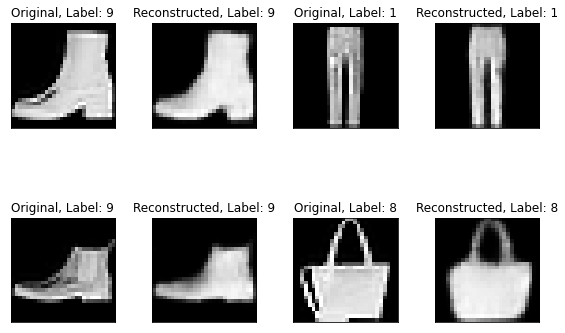

In [63]:
### Plot some samples from test set
fig, axs = plt.subplots(2, 4, figsize=(8,6))

for ax in axs:
    img, label = random.choice(test_dataset)
    img1 = img[0]
    with torch.no_grad():
        encoded_img  = AE_net.encoder(img.unsqueeze(0).to(device))
        decoded_img  = AE_net.decoder(encoded_img)
    
    ax[0].imshow(np.array(img1), cmap='gist_gray')
    ax[0].set_title('Original, Label: %d' % label)
    ax[0].set_xticks([])
    ax[0].set_yticks([])

    ax[1].imshow(decoded_img.squeeze().cpu().numpy(), cmap='gist_gray')
    ax[1].set_title('Reconstructed, Label: %d' % label)
    ax[1].set_xticks([])
    ax[1].set_yticks([])
    
    img, label = random.choice(test_dataset)
    img1 = img[0]
    with torch.no_grad():
        encoded_img  = AE_net.encoder(img.unsqueeze(0).to(device))
        decoded_img  = AE_net.decoder(encoded_img)
    
    ax[2].imshow(np.array(img1), cmap='gist_gray')
    ax[2].set_title('Original, Label: %d' % label)
    ax[2].set_xticks([])
    ax[2].set_yticks([])

    ax[3].imshow(decoded_img.squeeze().cpu().numpy(), cmap='gist_gray')
    ax[3].set_title('Reconstructed, Label: %d' % label)
    ax[3].set_xticks([])
    ax[3].set_yticks([])
    
    
plt.tight_layout()

The latent space structure (e.g., PCA, t-SNE) and generate new samples from latent codes

In [64]:
### Get the encoded representation of the test samples
encoded_samples = []

for img, label in tqdm(test_dataset):
    
    img = img.unsqueeze(0).to(device)
    
    # Encode image
    AE_net.eval()    
    with torch.no_grad():
        encoded_img  = AE_net.encoder(img)
    
    # store encoded images and convert to numpy
    encoded_img = encoded_img.flatten().cpu().numpy()
    encoded_sample = {f"Enc. Variable {i}": enc for i, enc in enumerate(encoded_img)}
    encoded_sample['label'] = label
    encoded_samples.append(encoded_sample)
    

100%|██████████| 10000/10000 [00:23<00:00, 431.96it/s]


In [65]:
# Convert to a dataframe
encoded_samples = pd.DataFrame(encoded_samples)

# PCA
n_components = 2
pca = PCA(n_components=n_components)
pca.fit(encoded_samples.iloc[:,0:best_params['encoded_space_dim']])
columns = [ f'Enc. Variable {i}' for i in range(n_components)]
compressed_samples = pd.DataFrame( pca.transform(encoded_samples.iloc[:,0:best_params['encoded_space_dim']]), 
                                  columns=columns )

fig = px.scatter(compressed_samples, x='Enc. Variable 0', y='Enc. Variable 1', 
                 color=encoded_samples.label.astype(str), opacity=0.7)

fig.show()

In [66]:
# Convert to a dataframe
encoded_samples = pd.DataFrame(encoded_samples)

# t-SNE
n_components = 2
tsne = TSNE(n_components=n_components)
tsne.fit(encoded_samples.iloc[:, 0:best_params['encoded_space_dim']])
columns = [ f'Enc. Variable {i}' for i in range(n_components)]
compressed_samples = pd.DataFrame( tsne.fit_transform(encoded_samples.iloc[:,0:best_params['encoded_space_dim']]), 
                                   columns=columns )

fig = px.scatter(compressed_samples, x='Enc. Variable 0', y='Enc. Variable 1', 
                 color=encoded_samples.label.astype(str), opacity=0.7)

fig.show()

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.



Generate new samples

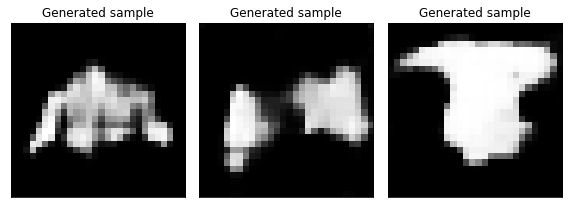

In [67]:
### Plot some samples
fig, ax = plt.subplots(1, 3, figsize=(8,6))

img, label = random.choice(test_dataset)
img1 = img[0]
with torch.no_grad():
    encoded_img  = AE_net.encoder(img.unsqueeze(0).to(device))
    decoded_img  = AE_net.decoder(20*torch.randn_like(encoded_img).to(device) )

ax[0].imshow( decoded_img.squeeze().cpu().numpy(), cmap='gist_gray')
ax[0].set_title('Generated sample' )
ax[0].set_xticks([])
ax[0].set_yticks([])

with torch.no_grad():
    decoded_img  = AE_net.decoder(20*torch.randn_like(encoded_img).to(device) )

ax[1].imshow(decoded_img.squeeze().cpu().numpy(), cmap='gist_gray')
ax[1].set_title('Generated sample' )
ax[1].set_xticks([])
ax[1].set_yticks([])

with torch.no_grad():
    decoded_img  = AE_net.decoder(20*torch.randn_like(encoded_img).to(device) )

ax[2].imshow(decoded_img.squeeze().cpu().numpy(), cmap='gist_gray')
ax[2].set_title('Generated sample' )
ax[2].set_xticks([])
ax[2].set_yticks([])    
    
plt.tight_layout()

**Variational autoencoder**

In [68]:
class VariationalEncoder(nn.Module):
    def __init__(self, latent_dims):  
        super(VariationalEncoder, self).__init__()
        self.conv1 = nn.Conv2d(1, 8, 3, stride=2, padding=1)
        self.conv2 = nn.Conv2d(8, 16, 3, stride=2, padding=1)
        self.batch2 = nn.BatchNorm2d(16)
        self.conv3 = nn.Conv2d(16, 32, 3, stride=2, padding=0)  
        self.linear1 = nn.Linear(3*3*32, 128)
        self.linear2 = nn.Linear(128, latent_dims)
        self.linear3 = nn.Linear(128, latent_dims)

        self.N = torch.distributions.Normal(0, 1)
        self.N.loc = self.N.loc.cuda() # hack to get sampling on the GPU
        self.N.scale = self.N.scale.cuda()
        self.kl = 0

    def forward(self, x):
        x = x.to(device)
        x = F.relu(self.conv1(x))
        x = F.relu(self.batch2(self.conv2(x)))
        x = F.relu(self.conv3(x))
        x = torch.flatten(x, start_dim=1)
        x = F.relu(self.linear1(x))
        mu =  self.linear2(x)
        sigma = torch.exp(self.linear3(x))
        z = mu + sigma*self.N.sample(mu.shape)
        self.kl = (sigma**2 + mu**2 - torch.log(sigma) - 1/2).sum()
        return z    

In [69]:
class Decoder(nn.Module):
    
    def __init__(self, latent_dims):
        super().__init__()

        self.decoder_lin = nn.Sequential(
            nn.Linear(latent_dims, 128),
            nn.ReLU(True),
            nn.Linear(128, 3 * 3 * 32),
            nn.ReLU(True)
        )

        self.unflatten = nn.Unflatten(dim=1, unflattened_size=(32, 3, 3))

        self.decoder_conv = nn.Sequential(
            nn.ConvTranspose2d(32, 16, 3, stride=2, output_padding=0),
            nn.BatchNorm2d(16),
            nn.ReLU(True),
            nn.ConvTranspose2d(16, 8, 3, stride=2, padding=1, output_padding=1),
            nn.BatchNorm2d(8),
            nn.ReLU(True),
            nn.ConvTranspose2d(8, 1, 3, stride=2, padding=1, output_padding=1)
        )
        
    def forward(self, x):
        x = self.decoder_lin(x)
        x = self.unflatten(x)
        x = self.decoder_conv(x)
        x = torch.sigmoid(x)
        return x

In [70]:
class VariationalAutoencoder(nn.Module):
    def __init__(self, latent_dims):
        super(VariationalAutoencoder, self).__init__()
        self.encoder = VariationalEncoder(latent_dims)
        self.decoder = Decoder(latent_dims)

    def forward(self, x):
        x = x.to(device)
        z = self.encoder(x)
        return self.decoder(z)

Initialize model, optimizer, loss

In [71]:
### Set the random seed for reproducible results
torch.manual_seed(0)

d = 4

vae = VariationalAutoencoder(latent_dims=d)

lr = 1e-3 

optim = torch.optim.Adam(vae.parameters(), lr=lr, weight_decay=1e-5)

device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
print(f'Selected device: {device}')

vae.to(device)

Selected device: cuda

VariationalAutoencoder(
  (encoder): VariationalEncoder(
    (conv1): Conv2d(1, 8, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (conv2): Conv2d(8, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (batch2): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2))
    (linear1): Linear(in_features=288, out_features=128, bias=True)
    (linear2): Linear(in_features=128, out_features=4, bias=True)
    (linear3): Linear(in_features=128, out_features=4, bias=True)
  )
  (decoder): Decoder(
    (decoder_lin): Sequential(
      (0): Linear(in_features=4, out_features=128, bias=True)
      (1): ReLU(inplace=True)
      (2): Linear(in_features=128, out_features=288, bias=True)
      (3): ReLU(inplace=True)
    )
    (unflatten): Unflatten(dim=1, unflattened_size=(32, 3, 3))
    (decoder_conv): Sequential(
      (0): ConvTranspose2d(32, 16, kernel_size=(3, 3), stride=(2, 2))
      (1): BatchN

Training

In [72]:
### Training function
def train_epoch(vae, device, dataloader, optimizer):
    # Set train mode for both the encoder and the decoder
    vae.train()
    train_loss = 0.0
    # Iterate the dataloader (we do not need the label values, this is unsupervised learning)
    for x, _ in dataloader: 
        # Move tensor to the proper device
        x = x.to(device)
        x_hat = vae(x)
        # Evaluate loss
        loss = ((x - x_hat)**2).sum() + vae.encoder.kl

        # Backward pass
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        # Print batch loss
        print('\t partial train loss (single batch): %f' % (loss.item()))
        train_loss+=loss.item()

    return train_loss / len(dataloader.dataset)

In [73]:
### Testing function
def test_epoch(vae, device, dataloader):
    # Set evaluation mode for encoder and decoder
    vae.eval()
    val_loss = 0.0
    with torch.no_grad(): # No need to track the gradients
        for x, _ in dataloader:
            # Move tensor to the proper device
            x = x.to(device)
            # Encode data
            encoded_data = vae.encoder(x)
            # Decode data
            x_hat = vae(x)
            loss = ((x - x_hat)**2).sum() + vae.encoder.kl
            val_loss += loss.item()

    return val_loss / len(dataloader.dataset)

In [74]:
def plot_ae_outputs(encoder,decoder,n=5):
    plt.figure(figsize=(10,4.5))
    for i in range(n):
      ax = plt.subplot(2,n,i+1)
      img = test_dataset[i][0].unsqueeze(0).to(device)
      encoder.eval()
      decoder.eval()
      with torch.no_grad():
         rec_img  = decoder(encoder(img))
      plt.imshow(img.cpu().squeeze().numpy(), cmap='gist_gray')
      ax.get_xaxis().set_visible(False)
      ax.get_yaxis().set_visible(False)  
      if i == n//2:
        ax.set_title('Original images')
      ax = plt.subplot(2, n, i + 1 + n)
      plt.imshow(rec_img.cpu().squeeze().numpy(), cmap='gist_gray')  
      ax.get_xaxis().set_visible(False)
      ax.get_yaxis().set_visible(False)  
      if i == n//2:
         ax.set_title('Reconstructed images')
    plt.show()

partial train loss (single batch): 49876.550781

partial train loss (single batch): 47830.355469

partial train loss (single batch): 48209.839844

partial train loss (single batch): 46447.996094

partial train loss (single batch): 45251.976562

partial train loss (single batch): 44424.652344

partial train loss (single batch): 44301.820312

partial train loss (single batch): 42798.828125

partial train loss (single batch): 42549.085938

partial train loss (single batch): 43167.789062

partial train loss (single batch): 41262.476562

partial train loss (single batch): 42254.031250

partial train loss (single batch): 41116.855469

partial train loss (single batch): 40602.398438

partial train loss (single batch): 39976.542969

partial train loss (single batch): 38983.527344

partial train loss (single batch): 40006.730469

partial train loss (single batch): 39112.273438

partial train loss (single batch): 38283.656250

partial train loss (single batch): 38393.582031

partial train loss (single batch): 38917.285156

partial train loss (single batch): 38237.191406

partial train loss (single batch): 37090.886719

partial train loss (single batch): 37829.046875

partial train loss (single batch): 36459.375000

partial train loss (single batch): 36783.105469

partial train loss (single batch): 37439.597656

partial train loss (single batch): 36505.066406

partial train loss (single batch): 35712.984375

partial train loss (single batch): 34750.984375

partial train loss (single batch): 34969.925781

partial train loss (single batch): 36516.339844

partial train loss (single batch): 34760.546875

partial train loss (single batch): 34689.187500

partial train loss (single batch): 34925.277344

partial train loss (single batch): 34840.390625

partial train loss (single batch): 34362.449219

partial train loss (single batch): 34035.312500

partial train loss (single batch): 33753.800781

partial train loss (single batch): 34398.671875

partial train loss (single batch): 32954.324219

partial train loss (single batch): 33533.417969

partial train loss (single batch): 32951.992188

partial train loss (single batch): 32724.490234

partial train loss (single batch): 32502.755859

partial train loss (single batch): 32717.687500

partial train loss (single batch): 32105.273438

partial train loss (single batch): 32297.521484

partial train loss (single batch): 31460.882812

partial train loss (single batch): 31248.939453

partial train loss (single batch): 32150.978516

partial train loss (single batch): 31124.814453

partial train loss (single batch): 30801.091797

partial train loss (single batch): 30536.130859

partial train loss (single batch): 30529.447266

partial train loss (single batch): 29038.792969

partial train loss (single batch): 30410.023438

partial train loss (single batch): 29757.794922

partial train loss (single batch): 29036.744141

partial train loss (single batch): 29304.960938

partial train loss (single batch): 29786.029297

partial train loss (single batch): 28889.894531

partial train loss (single batch): 28449.542969

partial train loss (single batch): 28799.035156

partial train loss (single batch): 27409.371094

partial train loss (single batch): 27991.583984

partial train loss (single batch): 27644.517578

partial train loss (single batch): 27613.015625

partial train loss (single batch): 26345.841797

partial train loss (single batch): 27362.660156

partial train loss (single batch): 27354.458984

partial train loss (single batch): 26962.980469

partial train loss (single batch): 26258.984375

partial train loss (single batch): 26243.171875

partial train loss (single batch): 25963.033203

partial train loss (single batch): 25481.900391

partial train loss (single batch): 25889.611328

partial train loss (single batch): 25518.992188

partial train loss (single batch): 25287.097656

partial train loss (single batch): 24723.523438

partial train loss (single batch): 25087.771484

partial train loss (single batch): 25166.570312

partial train loss (single batch): 24095.046875

partial train loss (single batch): 23750.916016

partial train loss (single batch): 23320.238281

partial train loss (single batch): 24019.484375

partial train loss (single batch): 24378.578125

partial train loss (single batch): 23630.640625

partial train loss (single batch): 23508.570312

partial train loss (single batch): 22890.400391

partial train loss (single batch): 23196.244141

partial train loss (single batch): 22858.603516

partial train loss (single batch): 23400.417969

partial train loss (single batch): 22406.074219

partial train loss (single batch): 22233.011719

partial train loss (single batch): 22178.091797

partial train loss (single batch): 22161.949219

partial train loss (single batch): 22089.968750

partial train loss (single batch): 21810.640625

partial train loss (single batch): 21746.875000

partial train loss (single batch): 21812.492188

partial train loss (single batch): 22243.457031

partial train loss (single batch): 21294.714844

partial train loss (single batch): 21328.626953

partial train loss (single batch): 21279.494141

partial train loss (single batch): 20985.621094

partial train loss (single batch): 20483.667969

partial train loss (single batch): 20771.953125

partial train loss (single batch): 20014.759766

partial train loss (single batch): 20372.736328

partial train loss (single batch): 20476.857422

partial train loss (single batch): 19911.958984

partial train loss (single batch): 19777.007812

partial train loss (single batch): 20129.427734

partial train loss (single batch): 19583.703125

partial train loss (single batch): 20281.156250

partial train loss (single batch): 19390.310547

partial train loss (single batch): 19493.187500

partial train loss (single batch): 19323.472656

partial train loss (single batch): 19142.210938

partial train loss (single batch): 18979.056641

partial train loss (single batch): 18825.423828

partial train loss (single batch): 18216.789062

partial train loss (single batch): 18067.345703

partial train loss (single batch): 18027.523438

partial train loss (single batch): 18299.869141

partial train loss (single batch): 18180.863281

partial train loss (single batch): 18241.447266

partial train loss (single batch): 18131.531250

partial train loss (single batch): 18190.685547

partial train loss (single batch): 18082.263672

partial train loss (single batch): 17903.593750

partial train loss (single batch): 17470.556641

partial train loss (single batch): 17734.916016

partial train loss (single batch): 17664.832031

partial train loss (single batch): 16995.777344

partial train loss (single batch): 17183.609375

partial train loss (single batch): 16703.201172

partial train loss (single batch): 17195.238281

partial train loss (single batch): 17008.585938

partial train loss (single batch): 17376.109375

partial train loss (single batch): 16716.158203

partial train loss (single batch): 16797.398438

partial train loss (single batch): 16274.474609

partial train loss (single batch): 16442.777344

partial train loss (single batch): 16584.101562

partial train loss (single batch): 16253.250977

partial train loss (single batch): 16086.505859

partial train loss (single batch): 16011.532227

partial train loss (single batch): 16395.460938

partial train loss (single batch): 15701.789062

partial train loss (single batch): 15775.151367

partial train loss (single batch): 16119.914062

partial train loss (single batch): 15615.836914

partial train loss (single batch): 15410.522461

partial train loss (single batch): 15415.882812

partial train loss (single batch): 15454.916992

partial train loss (single batch): 15509.324219

partial train loss (single batch): 14987.501953

partial train loss (single batch): 15156.643555

partial train loss (single batch): 15007.618164

partial train loss (single batch): 14955.455078

partial train loss (single batch): 14718.258789

partial train loss (single batch): 15270.525391

partial train loss (single batch): 14646.561523

partial train loss (single batch): 14473.402344

partial train loss (single batch): 14362.518555

partial train loss (single batch): 14809.163086

partial train loss (single batch): 14884.197266

partial train loss (single batch): 14479.997070

partial train loss (single batch): 14657.828125

partial train loss (single batch): 14256.642578

partial train loss (single batch): 14125.006836

partial train loss (single batch): 14176.039062

partial train loss (single batch): 14112.921875

partial train loss (single batch): 14104.709961

partial train loss (single batch): 13978.425781

partial train loss (single batch): 14065.948242

partial train loss (single batch): 13896.695312

partial train loss (single batch): 13905.425781

partial train loss (single batch): 13815.132812

partial train loss (single batch): 13972.016602

partial train loss (single batch): 13884.108398

partial train loss (single batch): 13463.708984

partial train loss (single batch): 14167.026367

partial train loss (single batch): 13734.551758

partial train loss (single batch): 13398.210938

partial train loss (single batch): 6699.877441

EPOCH 1/30      train loss 97.505       val loss 52.169

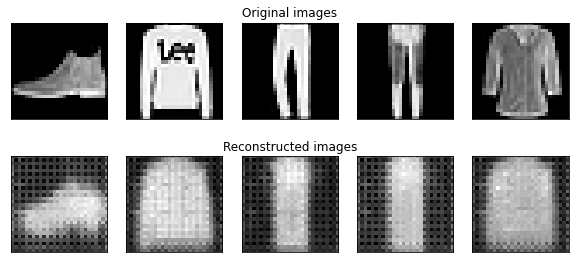

partial train loss (single batch): 13406.946289

partial train loss (single batch): 13340.648438

partial train loss (single batch): 13455.508789

partial train loss (single batch): 13440.381836

partial train loss (single batch): 13217.677734

partial train loss (single batch): 12934.020508

partial train loss (single batch): 12996.159180

partial train loss (single batch): 12507.115234

partial train loss (single batch): 12963.032227

partial train loss (single batch): 13092.251953

partial train loss (single batch): 12636.719727

partial train loss (single batch): 13191.907227

partial train loss (single batch): 12788.243164

partial train loss (single batch): 12691.918945

partial train loss (single batch): 12659.316406

partial train loss (single batch): 12253.817383

partial train loss (single batch): 12404.987305

partial train loss (single batch): 11945.800781

partial train loss (single batch): 12358.707031

partial train loss (single batch): 12372.674805

partial train loss (single batch): 12531.556641

partial train loss (single batch): 12100.293945

partial train loss (single batch): 11950.796875

partial train loss (single batch): 12040.413086

partial train loss (single batch): 11877.093750

partial train loss (single batch): 11462.226562

partial train loss (single batch): 12367.519531

partial train loss (single batch): 11655.371094

partial train loss (single batch): 12106.422852

partial train loss (single batch): 11510.910156

partial train loss (single batch): 11702.013672

partial train loss (single batch): 11823.119141

partial train loss (single batch): 11671.166992

partial train loss (single batch): 11874.397461

partial train loss (single batch): 11584.922852

partial train loss (single batch): 11610.679688

partial train loss (single batch): 11545.630859

partial train loss (single batch): 11356.408203

partial train loss (single batch): 11253.145508

partial train loss (single batch): 11761.215820

partial train loss (single batch): 11189.351562

partial train loss (single batch): 11248.689453

partial train loss (single batch): 11276.273438

partial train loss (single batch): 11199.712891

partial train loss (single batch): 11322.593750

partial train loss (single batch): 10988.772461

partial train loss (single batch): 11007.998047

partial train loss (single batch): 11211.392578

partial train loss (single batch): 10956.172852

partial train loss (single batch): 10956.491211

partial train loss (single batch): 11159.805664

partial train loss (single batch): 10874.133789

partial train loss (single batch): 10915.023438

partial train loss (single batch): 10653.851562

partial train loss (single batch): 10651.717773

partial train loss (single batch): 10553.911133

partial train loss (single batch): 11151.818359

partial train loss (single batch): 10595.004883

partial train loss (single batch): 10478.235352

partial train loss (single batch): 10774.738281

partial train loss (single batch): 10882.985352

partial train loss (single batch): 10593.121094

partial train loss (single batch): 10507.187500

partial train loss (single batch): 10912.554688

partial train loss (single batch): 10153.538086

partial train loss (single batch): 10294.784180

partial train loss (single batch): 10272.089844

partial train loss (single batch): 10280.900391

partial train loss (single batch): 10238.676758

partial train loss (single batch): 10054.113281

partial train loss (single batch): 10432.176758

partial train loss (single batch): 10125.732422

partial train loss (single batch): 10423.256836

partial train loss (single batch): 10094.697266

partial train loss (single batch): 10322.390625

partial train loss (single batch): 10077.555664

partial train loss (single batch): 10391.880859

partial train loss (single batch): 10103.496094

partial train loss (single batch): 10122.473633

partial train loss (single batch): 9753.966797

partial train loss (single batch): 9899.886719

partial train loss (single batch): 10479.579102

partial train loss (single batch): 10069.364258

partial train loss (single batch): 10008.051758

partial train loss (single batch): 9845.016602

partial train loss (single batch): 9896.506836

partial train loss (single batch): 10145.796875

partial train loss (single batch): 10079.719727

partial train loss (single batch): 9800.326172

partial train loss (single batch): 10046.384766

partial train loss (single batch): 9921.541992

partial train loss (single batch): 9471.603516

partial train loss (single batch): 9909.166992

partial train loss (single batch): 9592.597656

partial train loss (single batch): 9672.039062

partial train loss (single batch): 9648.623047

partial train loss (single batch): 9742.995117

partial train loss (single batch): 9853.513672

partial train loss (single batch): 9564.645508

partial train loss (single batch): 9720.373047

partial train loss (single batch): 9885.440430

partial train loss (single batch): 10179.089844

partial train loss (single batch): 9635.004883

partial train loss (single batch): 9604.865234

partial train loss (single batch): 9661.815430

partial train loss (single batch): 9513.517578

partial train loss (single batch): 9388.964844

partial train loss (single batch): 9408.928711

partial train loss (single batch): 9306.316406

partial train loss (single batch): 9379.755859

partial train loss (single batch): 9319.360352

partial train loss (single batch): 9564.578125

partial train loss (single batch): 9535.389648

partial train loss (single batch): 9275.555664

partial train loss (single batch): 9414.130859

partial train loss (single batch): 9372.575195

partial train loss (single batch): 9664.244141

partial train loss (single batch): 9371.566406

partial train loss (single batch): 9519.185547

partial train loss (single batch): 9213.810547

partial train loss (single batch): 9245.578125

partial train loss (single batch): 9214.193359

partial train loss (single batch): 9163.548828

partial train loss (single batch): 8901.476562

partial train loss (single batch): 9118.180664

partial train loss (single batch): 9205.249023

partial train loss (single batch): 9330.865234

partial train loss (single batch): 9240.193359

partial train loss (single batch): 9161.553711

partial train loss (single batch): 9248.560547

partial train loss (single batch): 9224.100586

partial train loss (single batch): 9057.155273

partial train loss (single batch): 8989.834961

partial train loss (single batch): 9044.770508

partial train loss (single batch): 9647.287109

partial train loss (single batch): 8890.580078

partial train loss (single batch): 9066.775391

partial train loss (single batch): 8964.654297

partial train loss (single batch): 9159.169922

partial train loss (single batch): 8965.822266

partial train loss (single batch): 9295.302734

partial train loss (single batch): 9165.134766

partial train loss (single batch): 8954.138672

partial train loss (single batch): 8905.916992

partial train loss (single batch): 8990.451172

partial train loss (single batch): 9021.619141

partial train loss (single batch): 8855.507812

partial train loss (single batch): 8908.832031

partial train loss (single batch): 8871.414062

partial train loss (single batch): 9086.123047

partial train loss (single batch): 8848.691406

partial train loss (single batch): 9050.847656

partial train loss (single batch): 8788.012695

partial train loss (single batch): 8917.868164

partial train loss (single batch): 8712.637695

partial train loss (single batch): 8879.406250

partial train loss (single batch): 8781.304688

partial train loss (single batch): 9007.855469

partial train loss (single batch): 8625.390625

partial train loss (single batch): 8876.618164

partial train loss (single batch): 8944.220703

partial train loss (single batch): 8891.066406

partial train loss (single batch): 8859.962891

partial train loss (single batch): 9085.081055

partial train loss (single batch): 8822.115234

partial train loss (single batch): 8816.189453

partial train loss (single batch): 9041.940430

partial train loss (single batch): 8782.220703

partial train loss (single batch): 8987.632812

partial train loss (single batch): 8796.810547

partial train loss (single batch): 8796.927734

partial train loss (single batch): 8792.764648

partial train loss (single batch): 8705.742188

partial train loss (single batch): 8674.712891

partial train loss (single batch): 8567.251953

partial train loss (single batch): 8788.615234

partial train loss (single batch): 8596.834961

partial train loss (single batch): 8527.423828

partial train loss (single batch): 8624.871094

partial train loss (single batch): 8715.196289

partial train loss (single batch): 8700.824219

partial train loss (single batch): 8861.343750

partial train loss (single batch): 8550.007812

partial train loss (single batch): 8507.425781

partial train loss (single batch): 8915.946289

partial train loss (single batch): 8792.065430

partial train loss (single batch): 8660.648438

partial train loss (single batch): 4333.036621

EPOCH 2/30      train loss 39.745       val loss 33.541

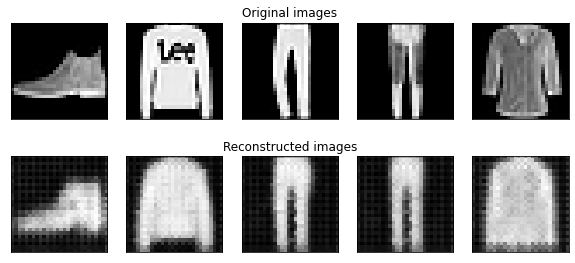

partial train loss (single batch): 8860.370117

partial train loss (single batch): 8830.699219

partial train loss (single batch): 8805.726562

partial train loss (single batch): 8843.548828

partial train loss (single batch): 8710.187500

partial train loss (single batch): 8411.611328

partial train loss (single batch): 8439.251953

partial train loss (single batch): 8237.024414

partial train loss (single batch): 8492.491211

partial train loss (single batch): 8471.853516

partial train loss (single batch): 8477.041992

partial train loss (single batch): 8761.758789

partial train loss (single batch): 8439.172852

partial train loss (single batch): 8502.728516

partial train loss (single batch): 8790.666016

partial train loss (single batch): 8537.502930

partial train loss (single batch): 8427.520508

partial train loss (single batch): 7935.519531

partial train loss (single batch): 8610.496094

partial train loss (single batch): 8496.476562

partial train loss (single batch): 8727.289062

partial train loss (single batch): 8375.403320

partial train loss (single batch): 8436.334961

partial train loss (single batch): 8386.099609

partial train loss (single batch): 8374.014648

partial train loss (single batch): 7999.481934

partial train loss (single batch): 8690.366211

partial train loss (single batch): 8197.960938

partial train loss (single batch): 8821.212891

partial train loss (single batch): 8328.610352

partial train loss (single batch): 8616.521484

partial train loss (single batch): 8277.220703

partial train loss (single batch): 8494.272461

partial train loss (single batch): 8686.242188

partial train loss (single batch): 8418.026367

partial train loss (single batch): 8351.266602

partial train loss (single batch): 8489.646484

partial train loss (single batch): 8275.123047

partial train loss (single batch): 8182.783203

partial train loss (single batch): 8514.451172

partial train loss (single batch): 8210.197266

partial train loss (single batch): 8357.633789

partial train loss (single batch): 8344.875000

partial train loss (single batch): 8414.853516

partial train loss (single batch): 8497.083008

partial train loss (single batch): 8014.387695

partial train loss (single batch): 8140.110352

partial train loss (single batch): 8269.003906

partial train loss (single batch): 8354.818359

partial train loss (single batch): 8253.099609

partial train loss (single batch): 8315.968750

partial train loss (single batch): 8235.901367

partial train loss (single batch): 8192.097656

partial train loss (single batch): 8082.221191

partial train loss (single batch): 7912.067383

partial train loss (single batch): 8390.953125

partial train loss (single batch): 8641.425781

partial train loss (single batch): 8253.975586

partial train loss (single batch): 8085.142578

partial train loss (single batch): 8248.203125

partial train loss (single batch): 8317.850586

partial train loss (single batch): 8228.020508

partial train loss (single batch): 8129.272461

partial train loss (single batch): 8470.468750

partial train loss (single batch): 7960.692871

partial train loss (single batch): 8001.765625

partial train loss (single batch): 7979.454590

partial train loss (single batch): 8113.387695

partial train loss (single batch): 8276.839844

partial train loss (single batch): 7881.985840

partial train loss (single batch): 8118.766602

partial train loss (single batch): 7841.208984

partial train loss (single batch): 8425.596680

partial train loss (single batch): 7958.045898

partial train loss (single batch): 8318.286133

partial train loss (single batch): 8204.732422

partial train loss (single batch): 8319.730469

partial train loss (single batch): 8040.527832

partial train loss (single batch): 8197.508789

partial train loss (single batch): 8023.373047

partial train loss (single batch): 7924.912109

partial train loss (single batch): 8576.958008

partial train loss (single batch): 8334.558594

partial train loss (single batch): 8135.215820

partial train loss (single batch): 8154.813965

partial train loss (single batch): 8033.088379

partial train loss (single batch): 8167.469238

partial train loss (single batch): 8328.513672

partial train loss (single batch): 8067.074219

partial train loss (single batch): 8411.926758

partial train loss (single batch): 8161.707031

partial train loss (single batch): 7841.880859

partial train loss (single batch): 8094.238770

partial train loss (single batch): 8002.960938

partial train loss (single batch): 8172.028320

partial train loss (single batch): 8111.220703

partial train loss (single batch): 8201.250000

partial train loss (single batch): 8267.484375

partial train loss (single batch): 7967.983398

partial train loss (single batch): 8101.506836

partial train loss (single batch): 8204.933594

partial train loss (single batch): 8406.549805

partial train loss (single batch): 8116.336914

partial train loss (single batch): 8076.265625

partial train loss (single batch): 8127.762695

partial train loss (single batch): 7997.195312

partial train loss (single batch): 7825.697266

partial train loss (single batch): 8012.332031

partial train loss (single batch): 7879.386719

partial train loss (single batch): 7893.598145

partial train loss (single batch): 7792.395508

partial train loss (single batch): 8254.724609

partial train loss (single batch): 8146.025879

partial train loss (single batch): 7848.166992

partial train loss (single batch): 8089.379395

partial train loss (single batch): 7919.662109

partial train loss (single batch): 8407.320312

partial train loss (single batch): 8140.199219

partial train loss (single batch): 8268.919922

partial train loss (single batch): 7955.100586

partial train loss (single batch): 7941.609863

partial train loss (single batch): 8023.252441

partial train loss (single batch): 7955.052246

partial train loss (single batch): 7673.459473

partial train loss (single batch): 7963.488281

partial train loss (single batch): 7988.297363

partial train loss (single batch): 8122.036133

partial train loss (single batch): 7924.519531

partial train loss (single batch): 7949.208984

partial train loss (single batch): 8111.260742

partial train loss (single batch): 7937.689453

partial train loss (single batch): 7840.044922

partial train loss (single batch): 7812.726074

partial train loss (single batch): 7779.827637

partial train loss (single batch): 8402.778320

partial train loss (single batch): 7779.712891

partial train loss (single batch): 7855.405273

partial train loss (single batch): 7878.085449

partial train loss (single batch): 7952.808105

partial train loss (single batch): 7817.211914

partial train loss (single batch): 8065.809082

partial train loss (single batch): 8116.082031

partial train loss (single batch): 7855.442871

partial train loss (single batch): 7884.493164

partial train loss (single batch): 7883.663086

partial train loss (single batch): 7955.340820

partial train loss (single batch): 7826.376465

partial train loss (single batch): 7906.684570

partial train loss (single batch): 7767.731445

partial train loss (single batch): 8062.155273

partial train loss (single batch): 7795.419922

partial train loss (single batch): 7948.962891

partial train loss (single batch): 7613.147461

partial train loss (single batch): 7911.937012

partial train loss (single batch): 7664.055176

partial train loss (single batch): 7897.272949

partial train loss (single batch): 7702.015137

partial train loss (single batch): 7955.173828

partial train loss (single batch): 7619.961914

partial train loss (single batch): 7835.905273

partial train loss (single batch): 7893.018066

partial train loss (single batch): 7874.876953

partial train loss (single batch): 7927.910156

partial train loss (single batch): 8081.959961

partial train loss (single batch): 7954.001953

partial train loss (single batch): 7920.876953

partial train loss (single batch): 8094.790039

partial train loss (single batch): 7839.914551

partial train loss (single batch): 8112.959961

partial train loss (single batch): 7825.799805

partial train loss (single batch): 7931.183105

partial train loss (single batch): 8012.233398

partial train loss (single batch): 7887.599121

partial train loss (single batch): 7754.463867

partial train loss (single batch): 7808.534180

partial train loss (single batch): 7833.419434

partial train loss (single batch): 7696.741699

partial train loss (single batch): 7645.061523

partial train loss (single batch): 7779.436523

partial train loss (single batch): 7903.331055

partial train loss (single batch): 7810.525391

partial train loss (single batch): 8012.929688

partial train loss (single batch): 7742.107422

partial train loss (single batch): 7601.744629

partial train loss (single batch): 8094.146484

partial train loss (single batch): 7920.504883

partial train loss (single batch): 7882.834473

partial train loss (single batch): 3943.884521

EPOCH 3/30      train loss 31.769       val loss 30.462

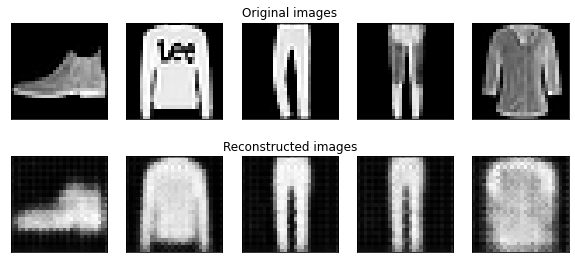

partial train loss (single batch): 8124.607422

partial train loss (single batch): 8066.007812

partial train loss (single batch): 7943.953125

partial train loss (single batch): 8087.630859

partial train loss (single batch): 7906.764160

partial train loss (single batch): 7671.280273

partial train loss (single batch): 7691.078613

partial train loss (single batch): 7433.482422

partial train loss (single batch): 7656.507812

partial train loss (single batch): 7588.472656

partial train loss (single batch): 7809.877930

partial train loss (single batch): 8002.956055

partial train loss (single batch): 7659.946289

partial train loss (single batch): 7794.674805

partial train loss (single batch): 8099.313477

partial train loss (single batch): 7867.358887

partial train loss (single batch): 7624.271484

partial train loss (single batch): 7168.351074

partial train loss (single batch): 7849.380859

partial train loss (single batch): 7711.289062

partial train loss (single batch): 7941.808105

partial train loss (single batch): 7669.445312

partial train loss (single batch): 7908.056641

partial train loss (single batch): 7658.744141

partial train loss (single batch): 7761.280273

partial train loss (single batch): 7302.305176

partial train loss (single batch): 8044.703125

partial train loss (single batch): 7573.745117

partial train loss (single batch): 8079.269531

partial train loss (single batch): 7677.238770

partial train loss (single batch): 8080.210449

partial train loss (single batch): 7502.673340

partial train loss (single batch): 7836.154297

partial train loss (single batch): 8097.303223

partial train loss (single batch): 7756.578125

partial train loss (single batch): 7738.729004

partial train loss (single batch): 7878.914062

partial train loss (single batch): 7530.235352

partial train loss (single batch): 7652.626953

partial train loss (single batch): 7842.500000

partial train loss (single batch): 7573.003418

partial train loss (single batch): 7685.082031

partial train loss (single batch): 7791.611328

partial train loss (single batch): 7852.006348

partial train loss (single batch): 7865.409180

partial train loss (single batch): 7425.315430

partial train loss (single batch): 7525.315918

partial train loss (single batch): 7627.994141

partial train loss (single batch): 7848.630859

partial train loss (single batch): 7574.547852

partial train loss (single batch): 7774.334473

partial train loss (single batch): 7587.592285

partial train loss (single batch): 7627.715820

partial train loss (single batch): 7612.070801

partial train loss (single batch): 7359.547852

partial train loss (single batch): 7907.455566

partial train loss (single batch): 8122.070312

partial train loss (single batch): 7697.264160

partial train loss (single batch): 7457.506348

partial train loss (single batch): 7649.264160

partial train loss (single batch): 7660.100098

partial train loss (single batch): 7566.473633

partial train loss (single batch): 7593.713867

partial train loss (single batch): 7920.314453

partial train loss (single batch): 7419.014648

partial train loss (single batch): 7483.696289

partial train loss (single batch): 7522.804688

partial train loss (single batch): 7575.472656

partial train loss (single batch): 7725.380859

partial train loss (single batch): 7303.031250

partial train loss (single batch): 7516.920898

partial train loss (single batch): 7302.604492

partial train loss (single batch): 7835.180176

partial train loss (single batch): 7458.737793

partial train loss (single batch): 7760.713867

partial train loss (single batch): 7740.708008

partial train loss (single batch): 7791.835449

partial train loss (single batch): 7520.475586

partial train loss (single batch): 7630.498535

partial train loss (single batch): 7418.712891

partial train loss (single batch): 7406.574219

partial train loss (single batch): 8066.856445

partial train loss (single batch): 7782.929688

partial train loss (single batch): 7678.315918

partial train loss (single batch): 7697.998047

partial train loss (single batch): 7509.334961

partial train loss (single batch): 7665.048828

partial train loss (single batch): 7776.208008

partial train loss (single batch): 7483.617188

partial train loss (single batch): 7863.994141

partial train loss (single batch): 7610.455078

partial train loss (single batch): 7315.897949

partial train loss (single batch): 7562.233398

partial train loss (single batch): 7470.336426

partial train loss (single batch): 7597.013184

partial train loss (single batch): 7568.672852

partial train loss (single batch): 7619.100586

partial train loss (single batch): 7829.883301

partial train loss (single batch): 7513.291992

partial train loss (single batch): 7744.357910

partial train loss (single batch): 7883.070312

partial train loss (single batch): 7869.320312

partial train loss (single batch): 7694.916016

partial train loss (single batch): 7606.233398

partial train loss (single batch): 7593.688965

partial train loss (single batch): 7564.229004

partial train loss (single batch): 7397.049316

partial train loss (single batch): 7504.479492

partial train loss (single batch): 7461.241699

partial train loss (single batch): 7364.550781

partial train loss (single batch): 7279.231445

partial train loss (single batch): 7739.010742

partial train loss (single batch): 7720.049805

partial train loss (single batch): 7309.514648

partial train loss (single batch): 7735.416016

partial train loss (single batch): 7518.722656

partial train loss (single batch): 7981.734375

partial train loss (single batch): 7609.510254

partial train loss (single batch): 7831.453125

partial train loss (single batch): 7510.471680

partial train loss (single batch): 7450.955078

partial train loss (single batch): 7672.729492

partial train loss (single batch): 7473.156250

partial train loss (single batch): 7244.774414

partial train loss (single batch): 7502.723633

partial train loss (single batch): 7492.495117

partial train loss (single batch): 7654.702148

partial train loss (single batch): 7523.285156

partial train loss (single batch): 7441.202148

partial train loss (single batch): 7684.502441

partial train loss (single batch): 7419.544434

partial train loss (single batch): 7433.269531

partial train loss (single batch): 7487.758301

partial train loss (single batch): 7405.624023

partial train loss (single batch): 7988.581543

partial train loss (single batch): 7413.886719

partial train loss (single batch): 7479.333008

partial train loss (single batch): 7425.274414

partial train loss (single batch): 7689.345703

partial train loss (single batch): 7439.690430

partial train loss (single batch): 7673.906738

partial train loss (single batch): 7781.983398

partial train loss (single batch): 7382.744141

partial train loss (single batch): 7456.518555

partial train loss (single batch): 7495.048828

partial train loss (single batch): 7601.849609

partial train loss (single batch): 7410.700195

partial train loss (single batch): 7465.493164

partial train loss (single batch): 7331.573242

partial train loss (single batch): 7646.844238

partial train loss (single batch): 7431.332031

partial train loss (single batch): 7558.654785

partial train loss (single batch): 7254.115234

partial train loss (single batch): 7489.336914

partial train loss (single batch): 7265.281250

partial train loss (single batch): 7527.164062

partial train loss (single batch): 7352.507812

partial train loss (single batch): 7561.193359

partial train loss (single batch): 7197.143066

partial train loss (single batch): 7475.731934

partial train loss (single batch): 7420.849609

partial train loss (single batch): 7494.916992

partial train loss (single batch): 7559.030273

partial train loss (single batch): 7686.039062

partial train loss (single batch): 7496.666016

partial train loss (single batch): 7563.994141

partial train loss (single batch): 7738.629883

partial train loss (single batch): 7357.722656

partial train loss (single batch): 7729.332520

partial train loss (single batch): 7470.353027

partial train loss (single batch): 7515.237793

partial train loss (single batch): 7499.098145

partial train loss (single batch): 7426.442383

partial train loss (single batch): 7341.333984

partial train loss (single batch): 7304.251465

partial train loss (single batch): 7384.858887

partial train loss (single batch): 7385.111816

partial train loss (single batch): 7201.627930

partial train loss (single batch): 7375.880371

partial train loss (single batch): 7429.784180

partial train loss (single batch): 7373.583984

partial train loss (single batch): 7523.409180

partial train loss (single batch): 7253.965332

partial train loss (single batch): 7246.741211

partial train loss (single batch): 7750.891602

partial train loss (single batch): 7539.405762

partial train loss (single batch): 7546.666016

partial train loss (single batch): 3765.347412

EPOCH 4/30      train loss 29.721       val loss 29.201

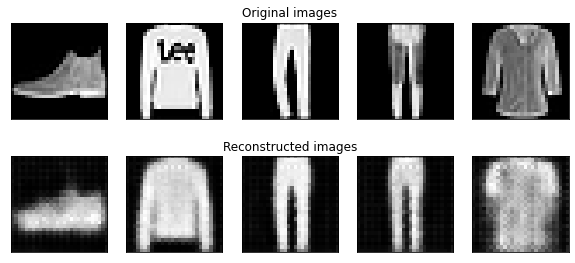

partial train loss (single batch): 7763.275391

partial train loss (single batch): 7674.192383

partial train loss (single batch): 7492.360352

partial train loss (single batch): 7617.758789

partial train loss (single batch): 7530.912109

partial train loss (single batch): 7235.962891

partial train loss (single batch): 7275.775391

partial train loss (single batch): 7092.772461

partial train loss (single batch): 7302.202148

partial train loss (single batch): 7188.583984

partial train loss (single batch): 7401.625977

partial train loss (single batch): 7774.749023

partial train loss (single batch): 7322.687012

partial train loss (single batch): 7477.602539

partial train loss (single batch): 7673.892578

partial train loss (single batch): 7529.752930

partial train loss (single batch): 7377.049805

partial train loss (single batch): 6809.273438

partial train loss (single batch): 7504.646484

partial train loss (single batch): 7411.155273

partial train loss (single batch): 7589.937988

partial train loss (single batch): 7269.520020

partial train loss (single batch): 7471.985352

partial train loss (single batch): 7226.245117

partial train loss (single batch): 7384.946289

partial train loss (single batch): 7051.994141

partial train loss (single batch): 7702.405273

partial train loss (single batch): 7242.332031

partial train loss (single batch): 7774.839844

partial train loss (single batch): 7294.678223

partial train loss (single batch): 7772.313477

partial train loss (single batch): 7197.981445

partial train loss (single batch): 7379.691895

partial train loss (single batch): 7786.869141

partial train loss (single batch): 7389.272461

partial train loss (single batch): 7424.274414

partial train loss (single batch): 7490.321289

partial train loss (single batch): 7245.732422

partial train loss (single batch): 7267.849121

partial train loss (single batch): 7446.215820

partial train loss (single batch): 7299.996094

partial train loss (single batch): 7287.858887

partial train loss (single batch): 7408.358398

partial train loss (single batch): 7484.105957

partial train loss (single batch): 7513.071289

partial train loss (single batch): 7086.304199

partial train loss (single batch): 7210.269531

partial train loss (single batch): 7333.880371

partial train loss (single batch): 7476.174805

partial train loss (single batch): 7329.309570

partial train loss (single batch): 7469.388672

partial train loss (single batch): 7280.178223

partial train loss (single batch): 7333.757324

partial train loss (single batch): 7235.765625

partial train loss (single batch): 6969.897461

partial train loss (single batch): 7665.983398

partial train loss (single batch): 7771.266602

partial train loss (single batch): 7531.386719

partial train loss (single batch): 7176.160156

partial train loss (single batch): 7322.589844

partial train loss (single batch): 7396.423828

partial train loss (single batch): 7333.403320

partial train loss (single batch): 7286.397461

partial train loss (single batch): 7692.058594

partial train loss (single batch): 7130.951172

partial train loss (single batch): 7214.197266

partial train loss (single batch): 7205.144531

partial train loss (single batch): 7280.251953

partial train loss (single batch): 7451.038086

partial train loss (single batch): 6988.093750

partial train loss (single batch): 7282.244141

partial train loss (single batch): 7047.756836

partial train loss (single batch): 7555.282715

partial train loss (single batch): 7179.964844

partial train loss (single batch): 7476.210449

partial train loss (single batch): 7454.801758

partial train loss (single batch): 7469.962891

partial train loss (single batch): 7271.729004

partial train loss (single batch): 7348.372559

partial train loss (single batch): 7119.557129

partial train loss (single batch): 7138.389648

partial train loss (single batch): 7674.000488

partial train loss (single batch): 7516.784668

partial train loss (single batch): 7300.315918

partial train loss (single batch): 7356.237793

partial train loss (single batch): 7091.737793

partial train loss (single batch): 7273.270020

partial train loss (single batch): 7552.857422

partial train loss (single batch): 7202.561523

partial train loss (single batch): 7537.976562

partial train loss (single batch): 7338.815918

partial train loss (single batch): 7006.204102

partial train loss (single batch): 7239.127441

partial train loss (single batch): 7184.634277

partial train loss (single batch): 7281.016602

partial train loss (single batch): 7228.502930

partial train loss (single batch): 7334.085938

partial train loss (single batch): 7438.513184

partial train loss (single batch): 7210.587891

partial train loss (single batch): 7442.564453

partial train loss (single batch): 7602.748047

partial train loss (single batch): 7567.348145

partial train loss (single batch): 7345.561523

partial train loss (single batch): 7377.630371

partial train loss (single batch): 7335.572266

partial train loss (single batch): 7151.798828

partial train loss (single batch): 7089.852051

partial train loss (single batch): 7174.016113

partial train loss (single batch): 7150.953613

partial train loss (single batch): 7072.367676

partial train loss (single batch): 6960.013672

partial train loss (single batch): 7509.614258

partial train loss (single batch): 7415.522461

partial train loss (single batch): 7087.168945

partial train loss (single batch): 7426.713867

partial train loss (single batch): 7138.315430

partial train loss (single batch): 7620.429199

partial train loss (single batch): 7396.075684

partial train loss (single batch): 7507.161133

partial train loss (single batch): 7228.455566

partial train loss (single batch): 7128.750977

partial train loss (single batch): 7331.937500

partial train loss (single batch): 7221.536621

partial train loss (single batch): 6922.867188

partial train loss (single batch): 7166.892578

partial train loss (single batch): 7222.169922

partial train loss (single batch): 7419.533203

partial train loss (single batch): 7274.060547

partial train loss (single batch): 7261.990234

partial train loss (single batch): 7452.387695

partial train loss (single batch): 7150.309570

partial train loss (single batch): 7085.798828

partial train loss (single batch): 7132.734375

partial train loss (single batch): 7060.907227

partial train loss (single batch): 7654.897461

partial train loss (single batch): 7133.157715

partial train loss (single batch): 7241.709473

partial train loss (single batch): 7212.477051

partial train loss (single batch): 7397.016113

partial train loss (single batch): 7170.908691

partial train loss (single batch): 7363.559082

partial train loss (single batch): 7482.340820

partial train loss (single batch): 7174.886719

partial train loss (single batch): 7234.072266

partial train loss (single batch): 7253.336426

partial train loss (single batch): 7312.637207

partial train loss (single batch): 7149.512207

partial train loss (single batch): 7331.549805

partial train loss (single batch): 7108.148438

partial train loss (single batch): 7314.872070

partial train loss (single batch): 7214.761719

partial train loss (single batch): 7365.500488

partial train loss (single batch): 7030.612305

partial train loss (single batch): 7372.698730

partial train loss (single batch): 7018.750488

partial train loss (single batch): 7283.736816

partial train loss (single batch): 7110.985352

partial train loss (single batch): 7363.934570

partial train loss (single batch): 6997.264160

partial train loss (single batch): 7212.582520

partial train loss (single batch): 7226.829102

partial train loss (single batch): 7275.383789

partial train loss (single batch): 7283.569824

partial train loss (single batch): 7430.324219

partial train loss (single batch): 7297.330566

partial train loss (single batch): 7421.509277

partial train loss (single batch): 7472.457031

partial train loss (single batch): 7232.624023

partial train loss (single batch): 7596.908203

partial train loss (single batch): 7237.362305

partial train loss (single batch): 7281.152832

partial train loss (single batch): 7410.257812

partial train loss (single batch): 7234.435547

partial train loss (single batch): 7169.132812

partial train loss (single batch): 7203.935547

partial train loss (single batch): 7225.678711

partial train loss (single batch): 7160.989258

partial train loss (single batch): 6925.975586

partial train loss (single batch): 7232.430664

partial train loss (single batch): 7196.316406

partial train loss (single batch): 7181.897461

partial train loss (single batch): 7419.090332

partial train loss (single batch): 7152.447754

partial train loss (single batch): 6969.170898

partial train loss (single batch): 7496.157227

partial train loss (single batch): 7378.627930

partial train loss (single batch): 7316.768066

partial train loss (single batch): 3685.047607

EPOCH 5/30      train loss 28.587       val loss 28.558

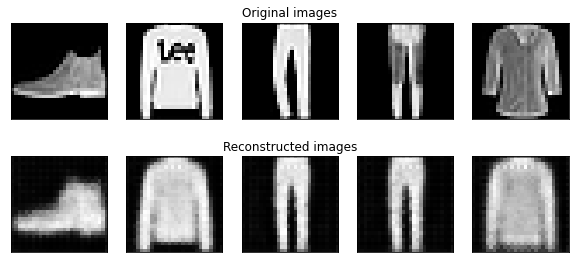

partial train loss (single batch): 7507.938477

partial train loss (single batch): 7431.629883

partial train loss (single batch): 7315.012695

partial train loss (single batch): 7551.845703

partial train loss (single batch): 7347.094727

partial train loss (single batch): 7062.281250

partial train loss (single batch): 7093.920898

partial train loss (single batch): 6857.145020

partial train loss (single batch): 7119.842773

partial train loss (single batch): 6981.434570

partial train loss (single batch): 7259.833008

partial train loss (single batch): 7466.740234

partial train loss (single batch): 7035.646973

partial train loss (single batch): 7269.153809

partial train loss (single batch): 7530.455078

partial train loss (single batch): 7267.848633

partial train loss (single batch): 7111.909180

partial train loss (single batch): 6624.097168

partial train loss (single batch): 7263.397461

partial train loss (single batch): 7206.238281

partial train loss (single batch): 7329.127441

partial train loss (single batch): 7092.382812

partial train loss (single batch): 7332.160156

partial train loss (single batch): 7090.067871

partial train loss (single batch): 7238.359863

partial train loss (single batch): 6693.251953

partial train loss (single batch): 7400.047363

partial train loss (single batch): 7066.859375

partial train loss (single batch): 7504.546875

partial train loss (single batch): 7085.842285

partial train loss (single batch): 7552.710938

partial train loss (single batch): 7043.707031

partial train loss (single batch): 7251.345215

partial train loss (single batch): 7534.522461

partial train loss (single batch): 7155.524414

partial train loss (single batch): 7247.751953

partial train loss (single batch): 7393.075195

partial train loss (single batch): 7014.549316

partial train loss (single batch): 7142.452148

partial train loss (single batch): 7263.151367

partial train loss (single batch): 7143.367188

partial train loss (single batch): 7071.102539

partial train loss (single batch): 7172.673340

partial train loss (single batch): 7343.429688

partial train loss (single batch): 7264.397949

partial train loss (single batch): 6916.938965

partial train loss (single batch): 6986.635742

partial train loss (single batch): 7164.092773

partial train loss (single batch): 7406.464355

partial train loss (single batch): 7088.589844

partial train loss (single batch): 7287.857422

partial train loss (single batch): 7134.246094

partial train loss (single batch): 7143.458008

partial train loss (single batch): 7068.642578

partial train loss (single batch): 6855.804688

partial train loss (single batch): 7471.722168

partial train loss (single batch): 7526.705078

partial train loss (single batch): 7195.971680

partial train loss (single batch): 7017.337891

partial train loss (single batch): 7122.199219

partial train loss (single batch): 7205.577637

partial train loss (single batch): 7165.838867

partial train loss (single batch): 7122.515625

partial train loss (single batch): 7529.895996

partial train loss (single batch): 6938.760742

partial train loss (single batch): 7079.374023

partial train loss (single batch): 7064.230469

partial train loss (single batch): 7161.951660

partial train loss (single batch): 7347.353516

partial train loss (single batch): 6912.937500

partial train loss (single batch): 7135.386719

partial train loss (single batch): 6889.903320

partial train loss (single batch): 7373.961914

partial train loss (single batch): 6913.440918

partial train loss (single batch): 7299.045898

partial train loss (single batch): 7310.611328

partial train loss (single batch): 7339.947266

partial train loss (single batch): 7051.954102

partial train loss (single batch): 7146.685547

partial train loss (single batch): 7052.500977

partial train loss (single batch): 6959.791992

partial train loss (single batch): 7504.982422

partial train loss (single batch): 7359.433594

partial train loss (single batch): 7189.281250

partial train loss (single batch): 7228.364746

partial train loss (single batch): 6927.170898

partial train loss (single batch): 7187.516602

partial train loss (single batch): 7373.083496

partial train loss (single batch): 7020.315430

partial train loss (single batch): 7404.457520

partial train loss (single batch): 7175.800781

partial train loss (single batch): 6818.050781

partial train loss (single batch): 7064.633789

partial train loss (single batch): 6997.175293

partial train loss (single batch): 7137.661133

partial train loss (single batch): 7155.672852

partial train loss (single batch): 7232.475098

partial train loss (single batch): 7289.029297

partial train loss (single batch): 7058.957520

partial train loss (single batch): 7240.879883

partial train loss (single batch): 7449.424805

partial train loss (single batch): 7466.542969

partial train loss (single batch): 7182.069336

partial train loss (single batch): 7229.912598

partial train loss (single batch): 7169.590332

partial train loss (single batch): 7066.133789

partial train loss (single batch): 7012.024414

partial train loss (single batch): 7070.986816

partial train loss (single batch): 6981.963867

partial train loss (single batch): 6983.798340

partial train loss (single batch): 6875.299805

partial train loss (single batch): 7328.432617

partial train loss (single batch): 7331.224609

partial train loss (single batch): 6916.125977

partial train loss (single batch): 7274.336914

partial train loss (single batch): 6979.831543

partial train loss (single batch): 7466.223145

partial train loss (single batch): 7231.130859

partial train loss (single batch): 7363.808594

partial train loss (single batch): 7099.499512

partial train loss (single batch): 7016.751953

partial train loss (single batch): 7194.625000

partial train loss (single batch): 7072.495117

partial train loss (single batch): 6907.092773

partial train loss (single batch): 7096.968750

partial train loss (single batch): 7115.003418

partial train loss (single batch): 7218.401367

partial train loss (single batch): 7145.799805

partial train loss (single batch): 7133.225098

partial train loss (single batch): 7281.062500

partial train loss (single batch): 7069.595703

partial train loss (single batch): 6978.186035

partial train loss (single batch): 7009.842285

partial train loss (single batch): 6965.801758

partial train loss (single batch): 7558.778320

partial train loss (single batch): 6983.111328

partial train loss (single batch): 7117.373535

partial train loss (single batch): 7095.386230

partial train loss (single batch): 7271.771484

partial train loss (single batch): 7026.864258

partial train loss (single batch): 7177.546875

partial train loss (single batch): 7297.701172

partial train loss (single batch): 6978.010254

partial train loss (single batch): 7026.813965

partial train loss (single batch): 7115.001953

partial train loss (single batch): 7199.147949

partial train loss (single batch): 7063.382812

partial train loss (single batch): 7103.132324

partial train loss (single batch): 6876.982422

partial train loss (single batch): 7247.114258

partial train loss (single batch): 7091.578125

partial train loss (single batch): 7215.085449

partial train loss (single batch): 6852.426758

partial train loss (single batch): 7133.811035

partial train loss (single batch): 6856.825195

partial train loss (single batch): 7122.192383

partial train loss (single batch): 6949.066895

partial train loss (single batch): 7139.932617

partial train loss (single batch): 6846.637695

partial train loss (single batch): 7073.596191

partial train loss (single batch): 7063.369629

partial train loss (single batch): 7110.977539

partial train loss (single batch): 7128.782227

partial train loss (single batch): 7249.452148

partial train loss (single batch): 7224.471191

partial train loss (single batch): 7239.959961

partial train loss (single batch): 7395.969238

partial train loss (single batch): 6929.430664

partial train loss (single batch): 7392.391602

partial train loss (single batch): 7165.586914

partial train loss (single batch): 7184.925293

partial train loss (single batch): 7255.554199

partial train loss (single batch): 7015.323242

partial train loss (single batch): 7024.793457

partial train loss (single batch): 7131.384766

partial train loss (single batch): 7078.298828

partial train loss (single batch): 7026.830078

partial train loss (single batch): 6808.979492

partial train loss (single batch): 7065.207031

partial train loss (single batch): 7072.573242

partial train loss (single batch): 7041.581543

partial train loss (single batch): 7233.461914

partial train loss (single batch): 6892.591309

partial train loss (single batch): 6872.058105

partial train loss (single batch): 7334.208008

partial train loss (single batch): 7237.869141

partial train loss (single batch): 7155.468262

partial train loss (single batch): 3612.981934

EPOCH 6/30      train loss 27.949       val loss 27.725

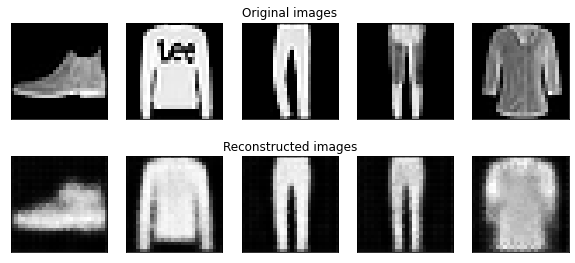

partial train loss (single batch): 7367.253418

partial train loss (single batch): 7295.999023

partial train loss (single batch): 7164.191895

partial train loss (single batch): 7346.668457

partial train loss (single batch): 7276.975586

partial train loss (single batch): 6911.363281

partial train loss (single batch): 6978.318359

partial train loss (single batch): 6779.511719

partial train loss (single batch): 6945.222656

partial train loss (single batch): 6859.741211

partial train loss (single batch): 7117.175293

partial train loss (single batch): 7381.409180

partial train loss (single batch): 6873.942383

partial train loss (single batch): 7010.607422

partial train loss (single batch): 7393.498047

partial train loss (single batch): 7219.856445

partial train loss (single batch): 6950.615234

partial train loss (single batch): 6437.862793

partial train loss (single batch): 7223.042969

partial train loss (single batch): 7041.318359

partial train loss (single batch): 7253.749512

partial train loss (single batch): 6946.625488

partial train loss (single batch): 7247.382812

partial train loss (single batch): 6909.811035

partial train loss (single batch): 7161.136230

partial train loss (single batch): 6588.453125

partial train loss (single batch): 7363.321289

partial train loss (single batch): 6948.840820

partial train loss (single batch): 7474.448730

partial train loss (single batch): 6973.059082

partial train loss (single batch): 7410.442383

partial train loss (single batch): 6916.717285

partial train loss (single batch): 7114.483887

partial train loss (single batch): 7364.096191

partial train loss (single batch): 7123.156250

partial train loss (single batch): 7128.678711

partial train loss (single batch): 7174.892578

partial train loss (single batch): 6954.940430

partial train loss (single batch): 6974.046387

partial train loss (single batch): 7098.128906

partial train loss (single batch): 6933.676758

partial train loss (single batch): 6932.172363

partial train loss (single batch): 7031.828125

partial train loss (single batch): 7226.156250

partial train loss (single batch): 7155.031738

partial train loss (single batch): 6877.497559

partial train loss (single batch): 6933.839844

partial train loss (single batch): 7018.164062

partial train loss (single batch): 7188.590332

partial train loss (single batch): 6968.833496

partial train loss (single batch): 7202.739746

partial train loss (single batch): 6962.238770

partial train loss (single batch): 7057.306641

partial train loss (single batch): 6975.740723

partial train loss (single batch): 6750.000977

partial train loss (single batch): 7339.712891

partial train loss (single batch): 7344.875977

partial train loss (single batch): 7137.071289

partial train loss (single batch): 6883.094238

partial train loss (single batch): 6949.882812

partial train loss (single batch): 7061.752930

partial train loss (single batch): 7044.567383

partial train loss (single batch): 6928.337891

partial train loss (single batch): 7369.773438

partial train loss (single batch): 6871.651367

partial train loss (single batch): 6907.137207

partial train loss (single batch): 6936.212891

partial train loss (single batch): 6999.078125

partial train loss (single batch): 7212.945312

partial train loss (single batch): 6795.001953

partial train loss (single batch): 6961.573242

partial train loss (single batch): 6797.945312

partial train loss (single batch): 7264.642578

partial train loss (single batch): 6826.166016

partial train loss (single batch): 7150.653320

partial train loss (single batch): 7138.069336

partial train loss (single batch): 7156.595703

partial train loss (single batch): 6963.880371

partial train loss (single batch): 7064.418945

partial train loss (single batch): 6963.796875

partial train loss (single batch): 6811.298828

partial train loss (single batch): 7411.078125

partial train loss (single batch): 7333.986328

partial train loss (single batch): 6999.716797

partial train loss (single batch): 7055.017090

partial train loss (single batch): 6897.418457

partial train loss (single batch): 7068.458008

partial train loss (single batch): 7194.515625

partial train loss (single batch): 6903.125488

partial train loss (single batch): 7284.971191

partial train loss (single batch): 7022.882812

partial train loss (single batch): 6747.684570

partial train loss (single batch): 7058.930176

partial train loss (single batch): 7002.532227

partial train loss (single batch): 6969.868164

partial train loss (single batch): 7034.930664

partial train loss (single batch): 7107.500977

partial train loss (single batch): 7197.598633

partial train loss (single batch): 6989.511719

partial train loss (single batch): 7194.807129

partial train loss (single batch): 7276.636230

partial train loss (single batch): 7316.955566

partial train loss (single batch): 7061.735840

partial train loss (single batch): 7010.936523

partial train loss (single batch): 7078.373535

partial train loss (single batch): 6918.226562

partial train loss (single batch): 6852.247070

partial train loss (single batch): 6954.341797

partial train loss (single batch): 6950.104004

partial train loss (single batch): 6929.920898

partial train loss (single batch): 6752.099609

partial train loss (single batch): 7256.742188

partial train loss (single batch): 7180.661133

partial train loss (single batch): 6825.618652

partial train loss (single batch): 7149.131836

partial train loss (single batch): 6944.600586

partial train loss (single batch): 7363.816406

partial train loss (single batch): 7088.868652

partial train loss (single batch): 7299.016602

partial train loss (single batch): 7014.501953

partial train loss (single batch): 6926.205078

partial train loss (single batch): 7089.916016

partial train loss (single batch): 6969.939453

partial train loss (single batch): 6717.774902

partial train loss (single batch): 7006.352051

partial train loss (single batch): 7001.451172

partial train loss (single batch): 7180.329102

partial train loss (single batch): 7068.657715

partial train loss (single batch): 6971.669434

partial train loss (single batch): 7155.285156

partial train loss (single batch): 6921.368164

partial train loss (single batch): 6870.242188

partial train loss (single batch): 6867.368652

partial train loss (single batch): 6854.169922

partial train loss (single batch): 7464.442871

partial train loss (single batch): 6886.900391

partial train loss (single batch): 6912.051270

partial train loss (single batch): 6915.898438

partial train loss (single batch): 7187.017578

partial train loss (single batch): 6922.446289

partial train loss (single batch): 7138.051758

partial train loss (single batch): 7256.242188

partial train loss (single batch): 6922.479004

partial train loss (single batch): 6957.342285

partial train loss (single batch): 7052.240234

partial train loss (single batch): 7030.093750

partial train loss (single batch): 6892.055664

partial train loss (single batch): 6993.566406

partial train loss (single batch): 6887.539062

partial train loss (single batch): 7061.896484

partial train loss (single batch): 6985.811523

partial train loss (single batch): 7128.838867

partial train loss (single batch): 6766.397461

partial train loss (single batch): 7040.125000

partial train loss (single batch): 6821.630859

partial train loss (single batch): 7043.146484

partial train loss (single batch): 6906.941406

partial train loss (single batch): 7104.181641

partial train loss (single batch): 6748.016602

partial train loss (single batch): 7046.054688

partial train loss (single batch): 7077.390137

partial train loss (single batch): 7066.414062

partial train loss (single batch): 7153.780273

partial train loss (single batch): 7269.788574

partial train loss (single batch): 7128.210938

partial train loss (single batch): 7145.714355

partial train loss (single batch): 7266.517578

partial train loss (single batch): 6854.299316

partial train loss (single batch): 7318.591309

partial train loss (single batch): 7007.369141

partial train loss (single batch): 7066.042480

partial train loss (single batch): 7145.024414

partial train loss (single batch): 6989.662598

partial train loss (single batch): 6937.773438

partial train loss (single batch): 6948.250000

partial train loss (single batch): 6968.624023

partial train loss (single batch): 6953.358887

partial train loss (single batch): 6726.750977

partial train loss (single batch): 6992.487305

partial train loss (single batch): 6965.220703

partial train loss (single batch): 6918.179199

partial train loss (single batch): 7130.310547

partial train loss (single batch): 6835.855469

partial train loss (single batch): 6814.966309

partial train loss (single batch): 7267.326172

partial train loss (single batch): 7205.208008

partial train loss (single batch): 7123.227051

partial train loss (single batch): 3547.296387

EPOCH 7/30      train loss 27.521       val loss 27.588

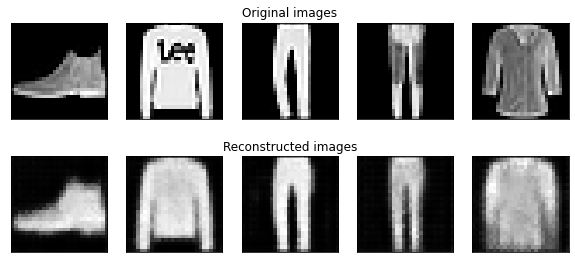

partial train loss (single batch): 7324.754883

partial train loss (single batch): 7277.494141

partial train loss (single batch): 7206.561523

partial train loss (single batch): 7172.471191

partial train loss (single batch): 7205.685547

partial train loss (single batch): 6884.557617

partial train loss (single batch): 6829.198242

partial train loss (single batch): 6719.602539

partial train loss (single batch): 6906.342773

partial train loss (single batch): 6789.552734

partial train loss (single batch): 7031.738281

partial train loss (single batch): 7286.686523

partial train loss (single batch): 6903.257812

partial train loss (single batch): 7020.617188

partial train loss (single batch): 7310.706543

partial train loss (single batch): 7165.461914

partial train loss (single batch): 6920.541016

partial train loss (single batch): 6423.898438

partial train loss (single batch): 7107.573242

partial train loss (single batch): 6942.180664

partial train loss (single batch): 7173.429688

partial train loss (single batch): 6885.196289

partial train loss (single batch): 7123.134766

partial train loss (single batch): 6828.791992

partial train loss (single batch): 6997.628906

partial train loss (single batch): 6523.097656

partial train loss (single batch): 7180.136230

partial train loss (single batch): 6820.392578

partial train loss (single batch): 7353.768555

partial train loss (single batch): 6868.124023

partial train loss (single batch): 7311.872070

partial train loss (single batch): 6848.259277

partial train loss (single batch): 7033.512695

partial train loss (single batch): 7323.032227

partial train loss (single batch): 7001.249023

partial train loss (single batch): 6986.112793

partial train loss (single batch): 7179.833984

partial train loss (single batch): 6835.716797

partial train loss (single batch): 6872.812500

partial train loss (single batch): 7037.324707

partial train loss (single batch): 6910.329102

partial train loss (single batch): 6825.619141

partial train loss (single batch): 6999.474609

partial train loss (single batch): 7197.066895

partial train loss (single batch): 7146.019531

partial train loss (single batch): 6701.686523

partial train loss (single batch): 6867.241211

partial train loss (single batch): 7010.443359

partial train loss (single batch): 7130.303711

partial train loss (single batch): 6893.403320

partial train loss (single batch): 7054.284180

partial train loss (single batch): 6888.976562

partial train loss (single batch): 6925.207031

partial train loss (single batch): 6854.440430

partial train loss (single batch): 6683.246094

partial train loss (single batch): 7191.038574

partial train loss (single batch): 7346.375977

partial train loss (single batch): 7064.899414

partial train loss (single batch): 6831.860352

partial train loss (single batch): 6956.446777

partial train loss (single batch): 7019.846191

partial train loss (single batch): 7001.513672

partial train loss (single batch): 6880.154297

partial train loss (single batch): 7326.939453

partial train loss (single batch): 6776.373047

partial train loss (single batch): 6781.110840

partial train loss (single batch): 6869.806641

partial train loss (single batch): 6991.255859

partial train loss (single batch): 7139.524902

partial train loss (single batch): 6705.317871

partial train loss (single batch): 6868.600098

partial train loss (single batch): 6723.789551

partial train loss (single batch): 7123.272461

partial train loss (single batch): 6718.628906

partial train loss (single batch): 7142.277344

partial train loss (single batch): 7136.809570

partial train loss (single batch): 7086.834473

partial train loss (single batch): 6865.638672

partial train loss (single batch): 7017.222656

partial train loss (single batch): 6762.766602

partial train loss (single batch): 6797.687500

partial train loss (single batch): 7348.566406

partial train loss (single batch): 7152.346680

partial train loss (single batch): 6998.481445

partial train loss (single batch): 7090.461426

partial train loss (single batch): 6752.244141

partial train loss (single batch): 6917.504883

partial train loss (single batch): 7133.104492

partial train loss (single batch): 6800.434570

partial train loss (single batch): 7220.608398

partial train loss (single batch): 6943.791504

partial train loss (single batch): 6656.750000

partial train loss (single batch): 6926.711914

partial train loss (single batch): 6914.398926

partial train loss (single batch): 6872.372559

partial train loss (single batch): 6941.749023

partial train loss (single batch): 7019.007812

partial train loss (single batch): 7087.590332

partial train loss (single batch): 6875.000000

partial train loss (single batch): 7100.617188

partial train loss (single batch): 7228.294922

partial train loss (single batch): 7283.789062

partial train loss (single batch): 7004.300781

partial train loss (single batch): 6976.687988

partial train loss (single batch): 6999.839844

partial train loss (single batch): 6818.716309

partial train loss (single batch): 6727.412109

partial train loss (single batch): 6921.414062

partial train loss (single batch): 6807.985840

partial train loss (single batch): 6709.309570

partial train loss (single batch): 6633.303711

partial train loss (single batch): 7197.195312

partial train loss (single batch): 7085.740234

partial train loss (single batch): 6760.979004

partial train loss (single batch): 7127.934570

partial train loss (single batch): 6850.117676

partial train loss (single batch): 7319.318359

partial train loss (single batch): 7020.074219

partial train loss (single batch): 7224.814453

partial train loss (single batch): 6921.798828

partial train loss (single batch): 6881.437988

partial train loss (single batch): 7009.474609

partial train loss (single batch): 6952.665039

partial train loss (single batch): 6658.856445

partial train loss (single batch): 6927.751465

partial train loss (single batch): 6907.627930

partial train loss (single batch): 7081.115723

partial train loss (single batch): 7026.645996

partial train loss (single batch): 6924.799316

partial train loss (single batch): 7160.808594

partial train loss (single batch): 6820.380371

partial train loss (single batch): 6775.533691

partial train loss (single batch): 6817.184082

partial train loss (single batch): 6817.471680

partial train loss (single batch): 7421.176270

partial train loss (single batch): 6780.556641

partial train loss (single batch): 6896.479980

partial train loss (single batch): 6882.217285

partial train loss (single batch): 7073.655762

partial train loss (single batch): 6873.447754

partial train loss (single batch): 7023.076172

partial train loss (single batch): 7145.569336

partial train loss (single batch): 6896.750977

partial train loss (single batch): 6860.472168

partial train loss (single batch): 6982.820312

partial train loss (single batch): 6999.000977

partial train loss (single batch): 6880.879883

partial train loss (single batch): 6985.408691

partial train loss (single batch): 6749.860352

partial train loss (single batch): 6988.390137

partial train loss (single batch): 6954.651367

partial train loss (single batch): 7066.084473

partial train loss (single batch): 6756.059082

partial train loss (single batch): 6926.061523

partial train loss (single batch): 6700.843262

partial train loss (single batch): 6953.132812

partial train loss (single batch): 6800.817871

partial train loss (single batch): 7042.213867

partial train loss (single batch): 6735.222168

partial train loss (single batch): 6947.439453

partial train loss (single batch): 6904.746582

partial train loss (single batch): 7037.528320

partial train loss (single batch): 7038.197754

partial train loss (single batch): 7169.030273

partial train loss (single batch): 7078.156250

partial train loss (single batch): 7093.197754

partial train loss (single batch): 7242.431641

partial train loss (single batch): 6911.884766

partial train loss (single batch): 7310.445312

partial train loss (single batch): 6884.400391

partial train loss (single batch): 7058.186035

partial train loss (single batch): 7050.998047

partial train loss (single batch): 6995.185547

partial train loss (single batch): 6911.848633

partial train loss (single batch): 6888.996582

partial train loss (single batch): 6908.527344

partial train loss (single batch): 6859.697754

partial train loss (single batch): 6641.660645

partial train loss (single batch): 6937.606445

partial train loss (single batch): 6882.132324

partial train loss (single batch): 6898.637695

partial train loss (single batch): 7086.571289

partial train loss (single batch): 6726.985352

partial train loss (single batch): 6725.559570

partial train loss (single batch): 7187.001465

partial train loss (single batch): 7082.666992

partial train loss (single batch): 7041.567871

partial train loss (single batch): 3496.135498

EPOCH 8/30      train loss 27.236       val loss 27.149

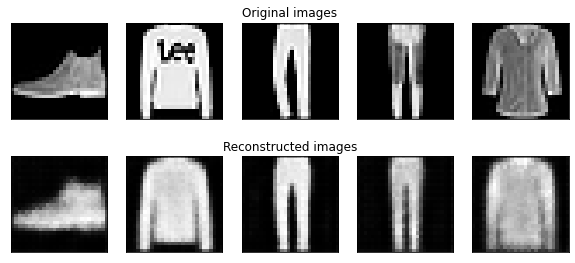

partial train loss (single batch): 7221.533203

partial train loss (single batch): 7210.266113

partial train loss (single batch): 7064.439941

partial train loss (single batch): 7092.364746

partial train loss (single batch): 7140.458008

partial train loss (single batch): 6821.790039

partial train loss (single batch): 6738.650879

partial train loss (single batch): 6618.203125

partial train loss (single batch): 6906.320312

partial train loss (single batch): 6729.417480

partial train loss (single batch): 7004.308594

partial train loss (single batch): 7170.063477

partial train loss (single batch): 6726.846680

partial train loss (single batch): 6930.965820

partial train loss (single batch): 7206.542969

partial train loss (single batch): 7104.541992

partial train loss (single batch): 6848.280273

partial train loss (single batch): 6313.001953

partial train loss (single batch): 6970.605469

partial train loss (single batch): 6895.937500

partial train loss (single batch): 7097.663086

partial train loss (single batch): 6811.164062

partial train loss (single batch): 7115.479980

partial train loss (single batch): 6821.172852

partial train loss (single batch): 6956.799316

partial train loss (single batch): 6531.050293

partial train loss (single batch): 7210.216797

partial train loss (single batch): 6806.000000

partial train loss (single batch): 7374.415527

partial train loss (single batch): 6758.668945

partial train loss (single batch): 7233.256836

partial train loss (single batch): 6739.939453

partial train loss (single batch): 7004.718750

partial train loss (single batch): 7308.956055

partial train loss (single batch): 7001.779297

partial train loss (single batch): 6971.600586

partial train loss (single batch): 7097.645020

partial train loss (single batch): 6794.631836

partial train loss (single batch): 6907.290039

partial train loss (single batch): 6992.706055

partial train loss (single batch): 6775.168945

partial train loss (single batch): 6805.857910

partial train loss (single batch): 6891.048828

partial train loss (single batch): 7095.640625

partial train loss (single batch): 7039.841797

partial train loss (single batch): 6597.402832

partial train loss (single batch): 6764.859375

partial train loss (single batch): 6960.934082

partial train loss (single batch): 7001.544922

partial train loss (single batch): 6788.690430

partial train loss (single batch): 6976.989258

partial train loss (single batch): 6873.142090

partial train loss (single batch): 6835.621094

partial train loss (single batch): 6826.427734

partial train loss (single batch): 6519.049805

partial train loss (single batch): 7185.292969

partial train loss (single batch): 7277.893555

partial train loss (single batch): 7044.276855

partial train loss (single batch): 6754.250977

partial train loss (single batch): 6850.985840

partial train loss (single batch): 7021.074219

partial train loss (single batch): 6924.891602

partial train loss (single batch): 6798.098633

partial train loss (single batch): 7261.892090

partial train loss (single batch): 6733.482422

partial train loss (single batch): 6785.945312

partial train loss (single batch): 6833.035645

partial train loss (single batch): 6893.943359

partial train loss (single batch): 7094.725098

partial train loss (single batch): 6636.675781

partial train loss (single batch): 6888.170898

partial train loss (single batch): 6674.335938

partial train loss (single batch): 7138.579102

partial train loss (single batch): 6758.165039

partial train loss (single batch): 7077.383789

partial train loss (single batch): 7076.402344

partial train loss (single batch): 7044.022949

partial train loss (single batch): 6785.013672

partial train loss (single batch): 6990.289062

partial train loss (single batch): 6811.477539

partial train loss (single batch): 6721.377930

partial train loss (single batch): 7315.354492

partial train loss (single batch): 7104.963379

partial train loss (single batch): 6965.806152

partial train loss (single batch): 6999.252930

partial train loss (single batch): 6708.843262

partial train loss (single batch): 6889.786133

partial train loss (single batch): 7055.458984

partial train loss (single batch): 6830.690430

partial train loss (single batch): 7160.225586

partial train loss (single batch): 6947.304199

partial train loss (single batch): 6590.075684

partial train loss (single batch): 6861.284180

partial train loss (single batch): 6806.758789

partial train loss (single batch): 6866.830078

partial train loss (single batch): 6918.086914

partial train loss (single batch): 6994.915039

partial train loss (single batch): 7062.813477

partial train loss (single batch): 6789.410645

partial train loss (single batch): 7143.584961

partial train loss (single batch): 7193.408691

partial train loss (single batch): 7239.425293

partial train loss (single batch): 6979.120117

partial train loss (single batch): 6940.572266

partial train loss (single batch): 6966.562500

partial train loss (single batch): 6825.424316

partial train loss (single batch): 6668.197754

partial train loss (single batch): 6910.912109

partial train loss (single batch): 6766.267578

partial train loss (single batch): 6739.620117

partial train loss (single batch): 6614.547363

partial train loss (single batch): 7161.933105

partial train loss (single batch): 7057.854004

partial train loss (single batch): 6668.215820

partial train loss (single batch): 7011.058594

partial train loss (single batch): 6782.670410

partial train loss (single batch): 7287.739258

partial train loss (single batch): 6970.446289

partial train loss (single batch): 7098.438965

partial train loss (single batch): 6835.305664

partial train loss (single batch): 6798.761230

partial train loss (single batch): 6940.705078

partial train loss (single batch): 6878.349609

partial train loss (single batch): 6611.549316

partial train loss (single batch): 6906.467773

partial train loss (single batch): 6868.921875

partial train loss (single batch): 6994.941895

partial train loss (single batch): 6926.303223

partial train loss (single batch): 6870.353516

partial train loss (single batch): 7029.177246

partial train loss (single batch): 6772.621094

partial train loss (single batch): 6720.222656

partial train loss (single batch): 6803.167969

partial train loss (single batch): 6703.933105

partial train loss (single batch): 7379.897461

partial train loss (single batch): 6682.673828

partial train loss (single batch): 6871.668457

partial train loss (single batch): 6819.920410

partial train loss (single batch): 7096.410156

partial train loss (single batch): 6755.685059

partial train loss (single batch): 6982.799805

partial train loss (single batch): 7106.869141

partial train loss (single batch): 6797.268555

partial train loss (single batch): 6945.812500

partial train loss (single batch): 6943.938477

partial train loss (single batch): 6971.174805

partial train loss (single batch): 6830.166016

partial train loss (single batch): 6861.128906

partial train loss (single batch): 6714.351074

partial train loss (single batch): 7027.190430

partial train loss (single batch): 6819.385742

partial train loss (single batch): 7057.445312

partial train loss (single batch): 6713.180176

partial train loss (single batch): 6945.171875

partial train loss (single batch): 6652.294922

partial train loss (single batch): 6910.810059

partial train loss (single batch): 6733.038086

partial train loss (single batch): 6969.679688

partial train loss (single batch): 6647.761719

partial train loss (single batch): 6810.045410

partial train loss (single batch): 6915.804688

partial train loss (single batch): 6939.450684

partial train loss (single batch): 6955.597656

partial train loss (single batch): 7112.427734

partial train loss (single batch): 6964.815430

partial train loss (single batch): 7038.180664

partial train loss (single batch): 7232.856445

partial train loss (single batch): 6879.899414

partial train loss (single batch): 7238.180664

partial train loss (single batch): 6844.291504

partial train loss (single batch): 6978.678223

partial train loss (single batch): 7051.928223

partial train loss (single batch): 6847.850586

partial train loss (single batch): 6832.183594

partial train loss (single batch): 6934.865234

partial train loss (single batch): 6868.125488

partial train loss (single batch): 6856.188477

partial train loss (single batch): 6589.040039

partial train loss (single batch): 6894.456055

partial train loss (single batch): 6828.309082

partial train loss (single batch): 6858.702148

partial train loss (single batch): 7106.842285

partial train loss (single batch): 6694.964355

partial train loss (single batch): 6726.516602

partial train loss (single batch): 7114.738281

partial train loss (single batch): 7048.919922

partial train loss (single batch): 6956.067383

partial train loss (single batch): 3500.828613

EPOCH 9/30      train loss 27.031       val loss 27.179

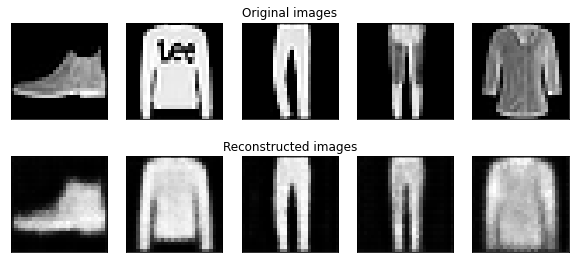

partial train loss (single batch): 7135.233887

partial train loss (single batch): 7167.473145

partial train loss (single batch): 7008.495117

partial train loss (single batch): 7022.622559

partial train loss (single batch): 7011.222168

partial train loss (single batch): 6744.557617

partial train loss (single batch): 6707.103516

partial train loss (single batch): 6650.097656

partial train loss (single batch): 6777.670898

partial train loss (single batch): 6659.704590

partial train loss (single batch): 6908.112793

partial train loss (single batch): 7173.425293

partial train loss (single batch): 6793.693359

partial train loss (single batch): 6834.914062

partial train loss (single batch): 7147.228516

partial train loss (single batch): 7084.580078

partial train loss (single batch): 6778.653320

partial train loss (single batch): 6337.685547

partial train loss (single batch): 6941.916504

partial train loss (single batch): 6845.729492

partial train loss (single batch): 6993.835449

partial train loss (single batch): 6798.610840

partial train loss (single batch): 7052.221680

partial train loss (single batch): 6708.029785

partial train loss (single batch): 6893.295898

partial train loss (single batch): 6442.323242

partial train loss (single batch): 7109.708008

partial train loss (single batch): 6684.497559

partial train loss (single batch): 7262.594727

partial train loss (single batch): 6683.150879

partial train loss (single batch): 7268.982422

partial train loss (single batch): 6693.851562

partial train loss (single batch): 6895.186523

partial train loss (single batch): 7221.062988

partial train loss (single batch): 6875.134277

partial train loss (single batch): 6893.314453

partial train loss (single batch): 7107.058105

partial train loss (single batch): 6762.701172

partial train loss (single batch): 6748.097656

partial train loss (single batch): 6851.875977

partial train loss (single batch): 6794.309570

partial train loss (single batch): 6743.961914

partial train loss (single batch): 6837.007324

partial train loss (single batch): 7011.655273

partial train loss (single batch): 7032.248535

partial train loss (single batch): 6639.092773

partial train loss (single batch): 6743.549316

partial train loss (single batch): 6893.230469

partial train loss (single batch): 7015.680664

partial train loss (single batch): 6782.463379

partial train loss (single batch): 6938.448242

partial train loss (single batch): 6861.101074

partial train loss (single batch): 6816.340820

partial train loss (single batch): 6756.097168

partial train loss (single batch): 6560.830078

partial train loss (single batch): 7196.299316

partial train loss (single batch): 7275.124023

partial train loss (single batch): 6926.409668

partial train loss (single batch): 6715.978027

partial train loss (single batch): 6768.079590

partial train loss (single batch): 6886.385254

partial train loss (single batch): 6838.413574

partial train loss (single batch): 6820.484375

partial train loss (single batch): 7190.714355

partial train loss (single batch): 6725.925781

partial train loss (single batch): 6760.544922

partial train loss (single batch): 6768.797852

partial train loss (single batch): 6820.831055

partial train loss (single batch): 7017.159180

partial train loss (single batch): 6675.146484

partial train loss (single batch): 6738.306152

partial train loss (single batch): 6605.509766

partial train loss (single batch): 7116.009277

partial train loss (single batch): 6682.436523

partial train loss (single batch): 7023.958984

partial train loss (single batch): 7069.416992

partial train loss (single batch): 7005.229492

partial train loss (single batch): 6748.036621

partial train loss (single batch): 6938.036133

partial train loss (single batch): 6803.165039

partial train loss (single batch): 6705.925293

partial train loss (single batch): 7268.947754

partial train loss (single batch): 7081.866211

partial train loss (single batch): 6901.849609

partial train loss (single batch): 6909.926758

partial train loss (single batch): 6696.667969

partial train loss (single batch): 6806.697266

partial train loss (single batch): 7004.250488

partial train loss (single batch): 6781.503906

partial train loss (single batch): 7121.443848

partial train loss (single batch): 6865.257324

partial train loss (single batch): 6641.782227

partial train loss (single batch): 6775.401855

partial train loss (single batch): 6769.482910

partial train loss (single batch): 6760.813477

partial train loss (single batch): 6884.892578

partial train loss (single batch): 6927.962402

partial train loss (single batch): 7034.217773

partial train loss (single batch): 6744.583008

partial train loss (single batch): 7034.346191

partial train loss (single batch): 7128.257812

partial train loss (single batch): 7169.948730

partial train loss (single batch): 6944.472656

partial train loss (single batch): 6895.710938

partial train loss (single batch): 6911.649414

partial train loss (single batch): 6797.598145

partial train loss (single batch): 6622.506836

partial train loss (single batch): 6798.979492

partial train loss (single batch): 6791.031250

partial train loss (single batch): 6673.873535

partial train loss (single batch): 6518.185547

partial train loss (single batch): 7048.788574

partial train loss (single batch): 6998.534180

partial train loss (single batch): 6612.279297

partial train loss (single batch): 7003.171875

partial train loss (single batch): 6808.746094

partial train loss (single batch): 7221.582031

partial train loss (single batch): 6915.613281

partial train loss (single batch): 7116.161133

partial train loss (single batch): 6776.259766

partial train loss (single batch): 6777.737305

partial train loss (single batch): 6941.714844

partial train loss (single batch): 6813.341797

partial train loss (single batch): 6652.958008

partial train loss (single batch): 6820.750977

partial train loss (single batch): 6887.876953

partial train loss (single batch): 7004.141113

partial train loss (single batch): 6895.198242

partial train loss (single batch): 6828.111816

partial train loss (single batch): 7081.172363

partial train loss (single batch): 6689.178711

partial train loss (single batch): 6720.384277

partial train loss (single batch): 6724.595703

partial train loss (single batch): 6675.831055

partial train loss (single batch): 7351.845703

partial train loss (single batch): 6759.083008

partial train loss (single batch): 6782.873047

partial train loss (single batch): 6817.946289

partial train loss (single batch): 7008.501953

partial train loss (single batch): 6763.547852

partial train loss (single batch): 6939.739746

partial train loss (single batch): 7120.486328

partial train loss (single batch): 6823.437012

partial train loss (single batch): 6825.530762

partial train loss (single batch): 6907.814453

partial train loss (single batch): 6985.033203

partial train loss (single batch): 6806.767578

partial train loss (single batch): 6895.212891

partial train loss (single batch): 6595.923828

partial train loss (single batch): 6918.593262

partial train loss (single batch): 6821.861328

partial train loss (single batch): 6919.125977

partial train loss (single batch): 6629.081055

partial train loss (single batch): 6919.357910

partial train loss (single batch): 6615.585449

partial train loss (single batch): 6832.497070

partial train loss (single batch): 6629.364258

partial train loss (single batch): 6967.490234

partial train loss (single batch): 6686.657715

partial train loss (single batch): 6880.516602

partial train loss (single batch): 6827.004395

partial train loss (single batch): 6902.457031

partial train loss (single batch): 6931.091797

partial train loss (single batch): 7111.533203

partial train loss (single batch): 6926.766602

partial train loss (single batch): 6962.405273

partial train loss (single batch): 7171.264160

partial train loss (single batch): 6722.226562

partial train loss (single batch): 7179.322754

partial train loss (single batch): 6856.789062

partial train loss (single batch): 6953.804199

partial train loss (single batch): 6968.715820

partial train loss (single batch): 6829.507812

partial train loss (single batch): 6780.621582

partial train loss (single batch): 6767.416992

partial train loss (single batch): 6881.096680

partial train loss (single batch): 6808.335938

partial train loss (single batch): 6536.062500

partial train loss (single batch): 6815.355957

partial train loss (single batch): 6832.875000

partial train loss (single batch): 6829.911621

partial train loss (single batch): 7026.424805

partial train loss (single batch): 6720.466797

partial train loss (single batch): 6621.980469

partial train loss (single batch): 7101.467773

partial train loss (single batch): 6991.776367

partial train loss (single batch): 6992.540039

partial train loss (single batch): 3517.287109

EPOCH 10/30     train loss 26.854       val loss 26.975

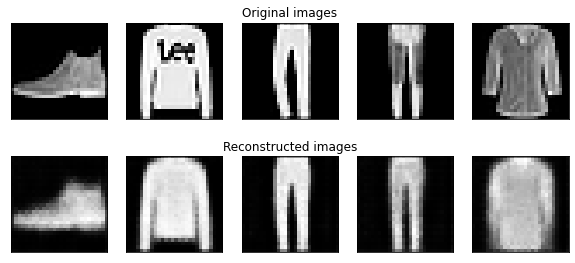

partial train loss (single batch): 7078.540039

partial train loss (single batch): 7114.955078

partial train loss (single batch): 6993.282227

partial train loss (single batch): 7073.447754

partial train loss (single batch): 7043.781738

partial train loss (single batch): 6661.434570

partial train loss (single batch): 6693.529297

partial train loss (single batch): 6515.537598

partial train loss (single batch): 6719.591797

partial train loss (single batch): 6698.731445

partial train loss (single batch): 6894.395020

partial train loss (single batch): 7094.847656

partial train loss (single batch): 6729.411621

partial train loss (single batch): 6842.745117

partial train loss (single batch): 7087.757812

partial train loss (single batch): 7008.116699

partial train loss (single batch): 6741.019043

partial train loss (single batch): 6247.902344

partial train loss (single batch): 6957.507324

partial train loss (single batch): 6854.530762

partial train loss (single batch): 7036.817383

partial train loss (single batch): 6717.924316

partial train loss (single batch): 6986.790527

partial train loss (single batch): 6757.333984

partial train loss (single batch): 6956.616211

partial train loss (single batch): 6484.842773

partial train loss (single batch): 7089.513672

partial train loss (single batch): 6720.432129

partial train loss (single batch): 7216.096680

partial train loss (single batch): 6650.901855

partial train loss (single batch): 7201.810547

partial train loss (single batch): 6654.629395

partial train loss (single batch): 6934.601562

partial train loss (single batch): 7249.633789

partial train loss (single batch): 6992.052734

partial train loss (single batch): 6870.262695

partial train loss (single batch): 6990.462402

partial train loss (single batch): 6807.627930

partial train loss (single batch): 6776.397949

partial train loss (single batch): 6881.090820

partial train loss (single batch): 6733.569824

partial train loss (single batch): 6746.827148

partial train loss (single batch): 6837.267578

partial train loss (single batch): 7025.507812

partial train loss (single batch): 6919.181152

partial train loss (single batch): 6603.027832

partial train loss (single batch): 6714.959961

partial train loss (single batch): 6898.679199

partial train loss (single batch): 6976.766113

partial train loss (single batch): 6741.007812

partial train loss (single batch): 6959.315430

partial train loss (single batch): 6739.963867

partial train loss (single batch): 6807.577637

partial train loss (single batch): 6803.077637

partial train loss (single batch): 6505.387695

partial train loss (single batch): 7111.295898

partial train loss (single batch): 7136.223145

partial train loss (single batch): 6936.705078

partial train loss (single batch): 6711.695312

partial train loss (single batch): 6735.604492

partial train loss (single batch): 6957.500000

partial train loss (single batch): 6797.105957

partial train loss (single batch): 6780.525391

partial train loss (single batch): 7226.166016

partial train loss (single batch): 6695.292480

partial train loss (single batch): 6612.164062

partial train loss (single batch): 6717.872070

partial train loss (single batch): 6923.462402

partial train loss (single batch): 6982.010742

partial train loss (single batch): 6559.886719

partial train loss (single batch): 6735.444824

partial train loss (single batch): 6568.894043

partial train loss (single batch): 7083.611816

partial train loss (single batch): 6650.602051

partial train loss (single batch): 6989.472656

partial train loss (single batch): 7009.456543

partial train loss (single batch): 6959.715332

partial train loss (single batch): 6676.779297

partial train loss (single batch): 6851.614746

partial train loss (single batch): 6616.245117

partial train loss (single batch): 6661.899414

partial train loss (single batch): 7176.002930

partial train loss (single batch): 7032.490723

partial train loss (single batch): 6876.492188

partial train loss (single batch): 6910.291016

partial train loss (single batch): 6645.816895

partial train loss (single batch): 6774.428223

partial train loss (single batch): 7057.102051

partial train loss (single batch): 6779.721680

partial train loss (single batch): 7077.427246

partial train loss (single batch): 6783.440918

partial train loss (single batch): 6530.113281

partial train loss (single batch): 6801.032227

partial train loss (single batch): 6792.788086

partial train loss (single batch): 6846.500977

partial train loss (single batch): 6858.452637

partial train loss (single batch): 6901.112305

partial train loss (single batch): 6988.255371

partial train loss (single batch): 6772.519043

partial train loss (single batch): 6985.787109

partial train loss (single batch): 7082.948242

partial train loss (single batch): 7113.498047

partial train loss (single batch): 6847.103516

partial train loss (single batch): 6824.049805

partial train loss (single batch): 6796.290039

partial train loss (single batch): 6706.930664

partial train loss (single batch): 6613.873535

partial train loss (single batch): 6804.956055

partial train loss (single batch): 6703.386719

partial train loss (single batch): 6660.088867

partial train loss (single batch): 6523.312500

partial train loss (single batch): 7065.870605

partial train loss (single batch): 6974.305664

partial train loss (single batch): 6602.232910

partial train loss (single batch): 7027.387695

partial train loss (single batch): 6761.033691

partial train loss (single batch): 7154.528809

partial train loss (single batch): 6942.655273

partial train loss (single batch): 7079.618164

partial train loss (single batch): 6745.824707

partial train loss (single batch): 6714.067383

partial train loss (single batch): 6904.850586

partial train loss (single batch): 6792.187500

partial train loss (single batch): 6616.588379

partial train loss (single batch): 6794.867188

partial train loss (single batch): 6855.194336

partial train loss (single batch): 6949.847656

partial train loss (single batch): 6812.399902

partial train loss (single batch): 6770.495605

partial train loss (single batch): 6963.770508

partial train loss (single batch): 6711.733398

partial train loss (single batch): 6738.435547

partial train loss (single batch): 6709.314453

partial train loss (single batch): 6660.173828

partial train loss (single batch): 7174.530273

partial train loss (single batch): 6702.601074

partial train loss (single batch): 6807.600586

partial train loss (single batch): 6806.035156

partial train loss (single batch): 7001.134766

partial train loss (single batch): 6777.527344

partial train loss (single batch): 6989.287109

partial train loss (single batch): 7110.636230

partial train loss (single batch): 6731.509766

partial train loss (single batch): 6763.949219

partial train loss (single batch): 6904.686523

partial train loss (single batch): 6920.277344

partial train loss (single batch): 6784.243164

partial train loss (single batch): 6806.519043

partial train loss (single batch): 6696.096680

partial train loss (single batch): 6927.036133

partial train loss (single batch): 6788.469727

partial train loss (single batch): 6942.914062

partial train loss (single batch): 6663.249512

partial train loss (single batch): 6883.587891

partial train loss (single batch): 6577.004883

partial train loss (single batch): 6879.387695

partial train loss (single batch): 6692.079102

partial train loss (single batch): 6900.230469

partial train loss (single batch): 6564.592773

partial train loss (single batch): 6724.314453

partial train loss (single batch): 6973.480469

partial train loss (single batch): 6867.548340

partial train loss (single batch): 6830.349609

partial train loss (single batch): 7018.115723

partial train loss (single batch): 6963.752441

partial train loss (single batch): 6886.910156

partial train loss (single batch): 7062.269531

partial train loss (single batch): 6707.814941

partial train loss (single batch): 7124.444336

partial train loss (single batch): 6776.323242

partial train loss (single batch): 6903.729004

partial train loss (single batch): 6964.029297

partial train loss (single batch): 6810.659668

partial train loss (single batch): 6798.889160

partial train loss (single batch): 6797.134277

partial train loss (single batch): 6784.366211

partial train loss (single batch): 6816.785156

partial train loss (single batch): 6586.469727

partial train loss (single batch): 6805.983398

partial train loss (single batch): 6783.443359

partial train loss (single batch): 6798.158203

partial train loss (single batch): 6997.246094

partial train loss (single batch): 6680.282227

partial train loss (single batch): 6665.498047

partial train loss (single batch): 7150.443359

partial train loss (single batch): 6992.975098

partial train loss (single batch): 6886.681641

partial train loss (single batch): 3476.162598

EPOCH 11/30     train loss 26.745       val loss 26.798

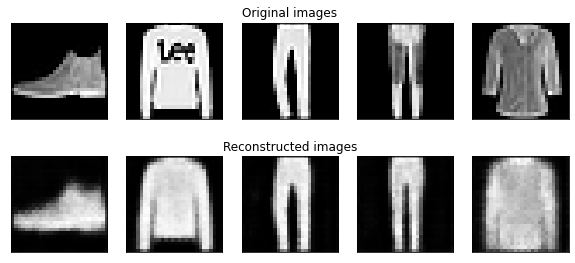

partial train loss (single batch): 7133.517578

partial train loss (single batch): 7150.522461

partial train loss (single batch): 6933.394531

partial train loss (single batch): 6994.603027

partial train loss (single batch): 6991.256348

partial train loss (single batch): 6722.938965

partial train loss (single batch): 6672.833008

partial train loss (single batch): 6526.336426

partial train loss (single batch): 6761.153320

partial train loss (single batch): 6652.836914

partial train loss (single batch): 6900.527344

partial train loss (single batch): 7136.317871

partial train loss (single batch): 6634.318359

partial train loss (single batch): 6758.369141

partial train loss (single batch): 7051.202148

partial train loss (single batch): 6993.794922

partial train loss (single batch): 6773.703125

partial train loss (single batch): 6198.765625

partial train loss (single batch): 6894.171387

partial train loss (single batch): 6758.266602

partial train loss (single batch): 7013.227539

partial train loss (single batch): 6701.224121

partial train loss (single batch): 6908.495605

partial train loss (single batch): 6710.387695

partial train loss (single batch): 6864.882812

partial train loss (single batch): 6391.273438

partial train loss (single batch): 6994.886719

partial train loss (single batch): 6735.648926

partial train loss (single batch): 7191.214844

partial train loss (single batch): 6644.987793

partial train loss (single batch): 7268.977051

partial train loss (single batch): 6677.359863

partial train loss (single batch): 6840.946289

partial train loss (single batch): 7162.078613

partial train loss (single batch): 6845.146484

partial train loss (single batch): 6839.421387

partial train loss (single batch): 7042.022949

partial train loss (single batch): 6721.065918

partial train loss (single batch): 6705.831055

partial train loss (single batch): 6838.165039

partial train loss (single batch): 6742.166016

partial train loss (single batch): 6752.383789

partial train loss (single batch): 6833.473145

partial train loss (single batch): 6950.613281

partial train loss (single batch): 6885.090820

partial train loss (single batch): 6570.545898

partial train loss (single batch): 6650.352539

partial train loss (single batch): 6841.993164

partial train loss (single batch): 6894.065430

partial train loss (single batch): 6672.991211

partial train loss (single batch): 6936.990723

partial train loss (single batch): 6749.211914

partial train loss (single batch): 6799.099121

partial train loss (single batch): 6710.123047

partial train loss (single batch): 6494.313477

partial train loss (single batch): 7117.272949

partial train loss (single batch): 7124.503418

partial train loss (single batch): 6928.797852

partial train loss (single batch): 6653.158203

partial train loss (single batch): 6728.553711

partial train loss (single batch): 6856.428223

partial train loss (single batch): 6851.516113

partial train loss (single batch): 6789.880371

partial train loss (single batch): 7137.184082

partial train loss (single batch): 6620.892578

partial train loss (single batch): 6689.361328

partial train loss (single batch): 6665.257812

partial train loss (single batch): 6798.282227

partial train loss (single batch): 7025.995117

partial train loss (single batch): 6530.990234

partial train loss (single batch): 6700.881836

partial train loss (single batch): 6600.948730

partial train loss (single batch): 7159.108398

partial train loss (single batch): 6577.531250

partial train loss (single batch): 6973.381348

partial train loss (single batch): 7041.405273

partial train loss (single batch): 6949.355469

partial train loss (single batch): 6724.845215

partial train loss (single batch): 6924.937500

partial train loss (single batch): 6661.531250

partial train loss (single batch): 6709.904297

partial train loss (single batch): 7181.647949

partial train loss (single batch): 7042.927734

partial train loss (single batch): 6886.916504

partial train loss (single batch): 6880.750488

partial train loss (single batch): 6593.017578

partial train loss (single batch): 6777.794434

partial train loss (single batch): 6937.366699

partial train loss (single batch): 6609.998535

partial train loss (single batch): 7032.969238

partial train loss (single batch): 6800.276855

partial train loss (single batch): 6563.613770

partial train loss (single batch): 6738.458008

partial train loss (single batch): 6715.546387

partial train loss (single batch): 6760.007324

partial train loss (single batch): 6765.302734

partial train loss (single batch): 6843.662109

partial train loss (single batch): 6980.041016

partial train loss (single batch): 6755.647461

partial train loss (single batch): 6943.929688

partial train loss (single batch): 7039.458008

partial train loss (single batch): 7083.458008

partial train loss (single batch): 6851.430664

partial train loss (single batch): 6819.486328

partial train loss (single batch): 6824.723145

partial train loss (single batch): 6703.916992

partial train loss (single batch): 6639.298828

partial train loss (single batch): 6751.150391

partial train loss (single batch): 6725.095215

partial train loss (single batch): 6663.821289

partial train loss (single batch): 6535.729980

partial train loss (single batch): 7060.843750

partial train loss (single batch): 6952.953613

partial train loss (single batch): 6612.901855

partial train loss (single batch): 7017.726074

partial train loss (single batch): 6698.943848

partial train loss (single batch): 7225.535156

partial train loss (single batch): 6893.179199

partial train loss (single batch): 7103.905762

partial train loss (single batch): 6805.699219

partial train loss (single batch): 6729.308105

partial train loss (single batch): 6885.956055

partial train loss (single batch): 6750.920898

partial train loss (single batch): 6645.809570

partial train loss (single batch): 6846.050293

partial train loss (single batch): 6820.089355

partial train loss (single batch): 6908.008789

partial train loss (single batch): 6854.553223

partial train loss (single batch): 6802.059570

partial train loss (single batch): 6952.343750

partial train loss (single batch): 6708.068359

partial train loss (single batch): 6664.989258

partial train loss (single batch): 6723.204102

partial train loss (single batch): 6606.181641

partial train loss (single batch): 7229.711914

partial train loss (single batch): 6697.052734

partial train loss (single batch): 6843.963379

partial train loss (single batch): 6771.208984

partial train loss (single batch): 6981.736328

partial train loss (single batch): 6756.625000

partial train loss (single batch): 6940.665039

partial train loss (single batch): 7075.908203

partial train loss (single batch): 6689.869141

partial train loss (single batch): 6702.351562

partial train loss (single batch): 6868.487793

partial train loss (single batch): 6838.209473

partial train loss (single batch): 6742.011230

partial train loss (single batch): 6844.602539

partial train loss (single batch): 6645.602051

partial train loss (single batch): 6897.920410

partial train loss (single batch): 6736.034668

partial train loss (single batch): 6902.397461

partial train loss (single batch): 6553.764648

partial train loss (single batch): 6836.935547

partial train loss (single batch): 6585.334473

partial train loss (single batch): 6811.374023

partial train loss (single batch): 6571.607422

partial train loss (single batch): 6924.450195

partial train loss (single batch): 6597.048828

partial train loss (single batch): 6787.484375

partial train loss (single batch): 6777.043457

partial train loss (single batch): 6912.415039

partial train loss (single batch): 6889.659180

partial train loss (single batch): 7004.826172

partial train loss (single batch): 6865.573242

partial train loss (single batch): 6909.133789

partial train loss (single batch): 7081.187500

partial train loss (single batch): 6740.253906

partial train loss (single batch): 7104.950195

partial train loss (single batch): 6768.957031

partial train loss (single batch): 6871.543945

partial train loss (single batch): 6898.032227

partial train loss (single batch): 6716.716797

partial train loss (single batch): 6771.783691

partial train loss (single batch): 6716.980469

partial train loss (single batch): 6797.445312

partial train loss (single batch): 6780.041504

partial train loss (single batch): 6488.176758

partial train loss (single batch): 6814.029297

partial train loss (single batch): 6767.553223

partial train loss (single batch): 6725.572266

partial train loss (single batch): 6938.055664

partial train loss (single batch): 6613.730469

partial train loss (single batch): 6607.352051

partial train loss (single batch): 7044.180664

partial train loss (single batch): 7027.103516

partial train loss (single batch): 6922.015625

partial train loss (single batch): 3462.309082

EPOCH 12/30     train loss 26.653       val loss 26.661

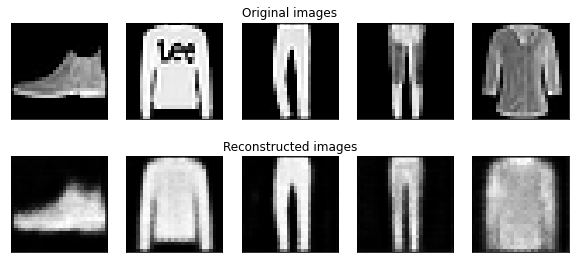

partial train loss (single batch): 7039.676270

partial train loss (single batch): 7061.873047

partial train loss (single batch): 6915.124023

partial train loss (single batch): 6906.969238

partial train loss (single batch): 6985.852539

partial train loss (single batch): 6567.552734

partial train loss (single batch): 6553.703125

partial train loss (single batch): 6458.923340

partial train loss (single batch): 6737.095215

partial train loss (single batch): 6595.962891

partial train loss (single batch): 6794.355957

partial train loss (single batch): 7044.693359

partial train loss (single batch): 6616.609863

partial train loss (single batch): 6745.074707

partial train loss (single batch): 7033.936035

partial train loss (single batch): 6948.653320

partial train loss (single batch): 6702.123535

partial train loss (single batch): 6186.648926

partial train loss (single batch): 6856.313477

partial train loss (single batch): 6756.616699

partial train loss (single batch): 6912.703125

partial train loss (single batch): 6691.831055

partial train loss (single batch): 6931.892090

partial train loss (single batch): 6615.313965

partial train loss (single batch): 6832.286621

partial train loss (single batch): 6367.867188

partial train loss (single batch): 7037.142578

partial train loss (single batch): 6669.915039

partial train loss (single batch): 7117.740723

partial train loss (single batch): 6733.328125

partial train loss (single batch): 7155.093262

partial train loss (single batch): 6559.956543

partial train loss (single batch): 6850.514648

partial train loss (single batch): 7145.384766

partial train loss (single batch): 6823.480469

partial train loss (single batch): 6779.046875

partial train loss (single batch): 6971.551758

partial train loss (single batch): 6713.117188

partial train loss (single batch): 6744.755371

partial train loss (single batch): 6786.082031

partial train loss (single batch): 6667.633789

partial train loss (single batch): 6669.903809

partial train loss (single batch): 6785.587891

partial train loss (single batch): 6952.141602

partial train loss (single batch): 6912.576660

partial train loss (single batch): 6568.807617

partial train loss (single batch): 6638.895020

partial train loss (single batch): 6837.062988

partial train loss (single batch): 6898.731934

partial train loss (single batch): 6760.389648

partial train loss (single batch): 6877.529785

partial train loss (single batch): 6768.209961

partial train loss (single batch): 6732.451172

partial train loss (single batch): 6662.478516

partial train loss (single batch): 6437.639648

partial train loss (single batch): 7053.061523

partial train loss (single batch): 7039.425781

partial train loss (single batch): 6862.549316

partial train loss (single batch): 6662.821289

partial train loss (single batch): 6646.168945

partial train loss (single batch): 6848.368164

partial train loss (single batch): 6789.951172

partial train loss (single batch): 6758.773438

partial train loss (single batch): 7092.522461

partial train loss (single batch): 6652.861328

partial train loss (single batch): 6609.768555

partial train loss (single batch): 6688.693359

partial train loss (single batch): 6764.622070

partial train loss (single batch): 6961.404785

partial train loss (single batch): 6475.936035

partial train loss (single batch): 6741.975586

partial train loss (single batch): 6547.861816

partial train loss (single batch): 7052.698730

partial train loss (single batch): 6588.487305

partial train loss (single batch): 6881.186523

partial train loss (single batch): 6936.291992

partial train loss (single batch): 6907.045898

partial train loss (single batch): 6661.774414

partial train loss (single batch): 6857.330078

partial train loss (single batch): 6561.588379

partial train loss (single batch): 6587.162109

partial train loss (single batch): 7266.856445

partial train loss (single batch): 7001.907227

partial train loss (single batch): 6800.660156

partial train loss (single batch): 6829.367676

partial train loss (single batch): 6637.986816

partial train loss (single batch): 6805.751953

partial train loss (single batch): 6929.182129

partial train loss (single batch): 6685.276367

partial train loss (single batch): 7019.586914

partial train loss (single batch): 6768.383789

partial train loss (single batch): 6539.307617

partial train loss (single batch): 6693.161133

partial train loss (single batch): 6727.615234

partial train loss (single batch): 6791.373535

partial train loss (single batch): 6749.493164

partial train loss (single batch): 6855.431152

partial train loss (single batch): 6976.879883

partial train loss (single batch): 6687.170410

partial train loss (single batch): 6965.321289

partial train loss (single batch): 7054.000977

partial train loss (single batch): 7147.544922

partial train loss (single batch): 6838.499023

partial train loss (single batch): 6786.988770

partial train loss (single batch): 6737.566406

partial train loss (single batch): 6685.541504

partial train loss (single batch): 6531.416992

partial train loss (single batch): 6788.685059

partial train loss (single batch): 6696.984863

partial train loss (single batch): 6608.704102

partial train loss (single batch): 6523.290527

partial train loss (single batch): 6943.782227

partial train loss (single batch): 6869.812012

partial train loss (single batch): 6592.534180

partial train loss (single batch): 6939.273926

partial train loss (single batch): 6711.449219

partial train loss (single batch): 7103.532715

partial train loss (single batch): 6898.582520

partial train loss (single batch): 7089.996094

partial train loss (single batch): 6777.445312

partial train loss (single batch): 6696.502441

partial train loss (single batch): 6838.837891

partial train loss (single batch): 6742.578125

partial train loss (single batch): 6543.328125

partial train loss (single batch): 6838.432617

partial train loss (single batch): 6788.149902

partial train loss (single batch): 6961.416992

partial train loss (single batch): 6843.955566

partial train loss (single batch): 6771.956055

partial train loss (single batch): 6918.139160

partial train loss (single batch): 6662.172852

partial train loss (single batch): 6669.969727

partial train loss (single batch): 6735.679688

partial train loss (single batch): 6625.003418

partial train loss (single batch): 7212.393555

partial train loss (single batch): 6635.280762

partial train loss (single batch): 6784.696289

partial train loss (single batch): 6833.437500

partial train loss (single batch): 6924.874023

partial train loss (single batch): 6758.676758

partial train loss (single batch): 6930.567383

partial train loss (single batch): 7096.138672

partial train loss (single batch): 6684.237305

partial train loss (single batch): 6756.562500

partial train loss (single batch): 6889.217773

partial train loss (single batch): 6844.013672

partial train loss (single batch): 6738.130859

partial train loss (single batch): 6825.026367

partial train loss (single batch): 6617.681152

partial train loss (single batch): 6872.365234

partial train loss (single batch): 6729.664551

partial train loss (single batch): 6922.533203

partial train loss (single batch): 6598.550293

partial train loss (single batch): 6817.507812

partial train loss (single batch): 6611.362305

partial train loss (single batch): 6783.050781

partial train loss (single batch): 6648.178711

partial train loss (single batch): 6899.933594

partial train loss (single batch): 6565.116211

partial train loss (single batch): 6750.674805

partial train loss (single batch): 6786.607910

partial train loss (single batch): 6910.366211

partial train loss (single batch): 6869.684082

partial train loss (single batch): 6957.235352

partial train loss (single batch): 6882.099121

partial train loss (single batch): 6925.424805

partial train loss (single batch): 7000.108887

partial train loss (single batch): 6647.373047

partial train loss (single batch): 7194.735352

partial train loss (single batch): 6764.356445

partial train loss (single batch): 6867.931152

partial train loss (single batch): 6899.957520

partial train loss (single batch): 6783.419434

partial train loss (single batch): 6711.320312

partial train loss (single batch): 6692.827637

partial train loss (single batch): 6772.822266

partial train loss (single batch): 6767.653320

partial train loss (single batch): 6480.409668

partial train loss (single batch): 6766.800293

partial train loss (single batch): 6740.297852

partial train loss (single batch): 6682.715820

partial train loss (single batch): 7008.636230

partial train loss (single batch): 6616.244629

partial train loss (single batch): 6633.899902

partial train loss (single batch): 7047.023926

partial train loss (single batch): 6930.949219

partial train loss (single batch): 6831.537109

partial train loss (single batch): 3474.301758

EPOCH 13/30     train loss 26.550       val loss 26.905

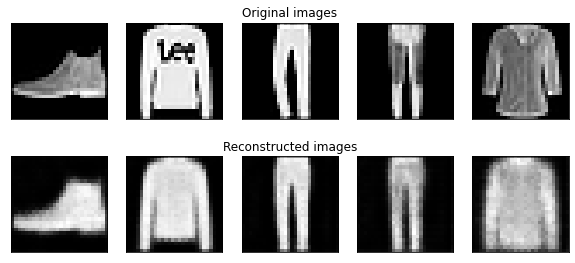

partial train loss (single batch): 7110.258789

partial train loss (single batch): 7139.562012

partial train loss (single batch): 6866.772949

partial train loss (single batch): 6930.158203

partial train loss (single batch): 6975.728027

partial train loss (single batch): 6604.640625

partial train loss (single batch): 6578.045410

partial train loss (single batch): 6466.120605

partial train loss (single batch): 6678.447266

partial train loss (single batch): 6556.037109

partial train loss (single batch): 6775.059570

partial train loss (single batch): 7003.704102

partial train loss (single batch): 6580.616211

partial train loss (single batch): 6782.795898

partial train loss (single batch): 6963.214844

partial train loss (single batch): 6996.417480

partial train loss (single batch): 6675.039551

partial train loss (single batch): 6177.455078

partial train loss (single batch): 6883.076172

partial train loss (single batch): 6737.080078

partial train loss (single batch): 6951.895508

partial train loss (single batch): 6684.954102

partial train loss (single batch): 6888.229004

partial train loss (single batch): 6696.702148

partial train loss (single batch): 6822.363281

partial train loss (single batch): 6381.983398

partial train loss (single batch): 6979.199219

partial train loss (single batch): 6605.797852

partial train loss (single batch): 7171.783203

partial train loss (single batch): 6564.325195

partial train loss (single batch): 7091.881836

partial train loss (single batch): 6603.792969

partial train loss (single batch): 6787.966797

partial train loss (single batch): 7111.228516

partial train loss (single batch): 6838.562500

partial train loss (single batch): 6775.411133

partial train loss (single batch): 6989.956055

partial train loss (single batch): 6710.683594

partial train loss (single batch): 6669.600586

partial train loss (single batch): 6788.422363

partial train loss (single batch): 6616.561523

partial train loss (single batch): 6637.985352

partial train loss (single batch): 6746.990723

partial train loss (single batch): 6889.180176

partial train loss (single batch): 6881.057617

partial train loss (single batch): 6456.226562

partial train loss (single batch): 6638.250488

partial train loss (single batch): 6822.465332

partial train loss (single batch): 6902.739258

partial train loss (single batch): 6734.837891

partial train loss (single batch): 6979.280762

partial train loss (single batch): 6695.367676

partial train loss (single batch): 6700.794434

partial train loss (single batch): 6666.985352

partial train loss (single batch): 6487.802734

partial train loss (single batch): 7018.707031

partial train loss (single batch): 7037.490234

partial train loss (single batch): 6850.019043

partial train loss (single batch): 6639.423828

partial train loss (single batch): 6724.101562

partial train loss (single batch): 6802.055664

partial train loss (single batch): 6721.289551

partial train loss (single batch): 6732.873047

partial train loss (single batch): 7074.089355

partial train loss (single batch): 6597.732422

partial train loss (single batch): 6542.564453

partial train loss (single batch): 6682.648438

partial train loss (single batch): 6730.660156

partial train loss (single batch): 6909.620117

partial train loss (single batch): 6541.534180

partial train loss (single batch): 6652.651367

partial train loss (single batch): 6486.089355

partial train loss (single batch): 6974.853516

partial train loss (single batch): 6544.224609

partial train loss (single batch): 6905.293945

partial train loss (single batch): 6986.441406

partial train loss (single batch): 6834.773438

partial train loss (single batch): 6685.770020

partial train loss (single batch): 6880.236328

partial train loss (single batch): 6586.215820

partial train loss (single batch): 6606.958984

partial train loss (single batch): 7210.119629

partial train loss (single batch): 6960.210449

partial train loss (single batch): 6781.274414

partial train loss (single batch): 6784.762695

partial train loss (single batch): 6591.491211

partial train loss (single batch): 6774.142090

partial train loss (single batch): 6957.725098

partial train loss (single batch): 6650.041992

partial train loss (single batch): 7012.630859

partial train loss (single batch): 6760.599609

partial train loss (single batch): 6420.813477

partial train loss (single batch): 6581.256348

partial train loss (single batch): 6722.673828

partial train loss (single batch): 6701.183594

partial train loss (single batch): 6763.229004

partial train loss (single batch): 6789.406250

partial train loss (single batch): 7002.855469

partial train loss (single batch): 6685.508789

partial train loss (single batch): 6962.754395

partial train loss (single batch): 7024.207031

partial train loss (single batch): 7067.827637

partial train loss (single batch): 6747.777344

partial train loss (single batch): 6778.759277

partial train loss (single batch): 6782.522461

partial train loss (single batch): 6677.606934

partial train loss (single batch): 6585.703613

partial train loss (single batch): 6715.926758

partial train loss (single batch): 6639.240723

partial train loss (single batch): 6547.895508

partial train loss (single batch): 6438.453125

partial train loss (single batch): 6931.498535

partial train loss (single batch): 6978.044434

partial train loss (single batch): 6535.037109

partial train loss (single batch): 6917.979492

partial train loss (single batch): 6725.163086

partial train loss (single batch): 7086.237793

partial train loss (single batch): 6852.686035

partial train loss (single batch): 7037.323242

partial train loss (single batch): 6755.517578

partial train loss (single batch): 6699.095703

partial train loss (single batch): 6930.385254

partial train loss (single batch): 6769.737305

partial train loss (single batch): 6555.135742

partial train loss (single batch): 6817.912109

partial train loss (single batch): 6711.041992

partial train loss (single batch): 6982.447266

partial train loss (single batch): 6763.827148

partial train loss (single batch): 6778.237305

partial train loss (single batch): 6932.436523

partial train loss (single batch): 6681.316895

partial train loss (single batch): 6662.408203

partial train loss (single batch): 6683.795410

partial train loss (single batch): 6637.848145

partial train loss (single batch): 7195.847656

partial train loss (single batch): 6642.615234

partial train loss (single batch): 6752.748047

partial train loss (single batch): 6742.214355

partial train loss (single batch): 6901.892578

partial train loss (single batch): 6629.335938

partial train loss (single batch): 6843.804688

partial train loss (single batch): 6997.436035

partial train loss (single batch): 6595.594727

partial train loss (single batch): 6744.574707

partial train loss (single batch): 6814.142090

partial train loss (single batch): 6804.736816

partial train loss (single batch): 6646.849609

partial train loss (single batch): 6728.121094

partial train loss (single batch): 6537.641602

partial train loss (single batch): 6795.297852

partial train loss (single batch): 6644.903320

partial train loss (single batch): 6819.711426

partial train loss (single batch): 6536.232910

partial train loss (single batch): 6762.997559

partial train loss (single batch): 6587.698242

partial train loss (single batch): 6807.735840

partial train loss (single batch): 6536.919922

partial train loss (single batch): 6858.346680

partial train loss (single batch): 6573.833984

partial train loss (single batch): 6624.208008

partial train loss (single batch): 6759.389160

partial train loss (single batch): 6808.102539

partial train loss (single batch): 6817.383301

partial train loss (single batch): 6908.481445

partial train loss (single batch): 6881.592285

partial train loss (single batch): 6896.568359

partial train loss (single batch): 6963.847656

partial train loss (single batch): 6658.535645

partial train loss (single batch): 7117.756348

partial train loss (single batch): 6776.797852

partial train loss (single batch): 6871.168457

partial train loss (single batch): 6874.491211

partial train loss (single batch): 6737.811523

partial train loss (single batch): 6585.623047

partial train loss (single batch): 6706.655762

partial train loss (single batch): 6787.451172

partial train loss (single batch): 6724.442383

partial train loss (single batch): 6477.083984

partial train loss (single batch): 6790.827637

partial train loss (single batch): 6745.392578

partial train loss (single batch): 6734.893555

partial train loss (single batch): 6953.232422

partial train loss (single batch): 6634.975586

partial train loss (single batch): 6609.422852

partial train loss (single batch): 7075.866699

partial train loss (single batch): 6869.807129

partial train loss (single batch): 6851.385254

partial train loss (single batch): 3426.364258

EPOCH 14/30     train loss 26.457       val loss 26.741

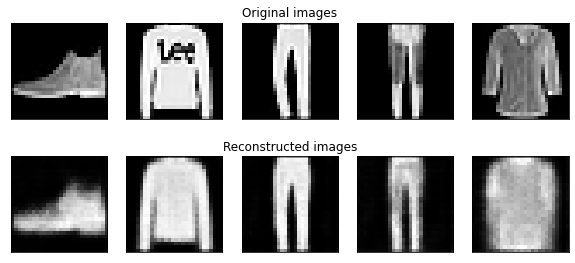

partial train loss (single batch): 7111.187500

partial train loss (single batch): 7042.902344

partial train loss (single batch): 6974.042969

partial train loss (single batch): 6891.861328

partial train loss (single batch): 6953.349609

partial train loss (single batch): 6647.237793

partial train loss (single batch): 6570.693359

partial train loss (single batch): 6452.011230

partial train loss (single batch): 6634.624023

partial train loss (single batch): 6531.736328

partial train loss (single batch): 6798.721680

partial train loss (single batch): 6979.740723

partial train loss (single batch): 6646.202637

partial train loss (single batch): 6714.455078

partial train loss (single batch): 7020.458008

partial train loss (single batch): 6874.719727

partial train loss (single batch): 6601.066895

partial train loss (single batch): 6200.421875

partial train loss (single batch): 6852.853516

partial train loss (single batch): 6730.477539

partial train loss (single batch): 6969.975586

partial train loss (single batch): 6723.132812

partial train loss (single batch): 6915.240234

partial train loss (single batch): 6635.335449

partial train loss (single batch): 6856.086914

partial train loss (single batch): 6345.473633

partial train loss (single batch): 6962.100586

partial train loss (single batch): 6595.215332

partial train loss (single batch): 7166.834961

partial train loss (single batch): 6640.447266

partial train loss (single batch): 7090.108398

partial train loss (single batch): 6551.814941

partial train loss (single batch): 6725.387695

partial train loss (single batch): 7109.835449

partial train loss (single batch): 6861.942383

partial train loss (single batch): 6723.877441

partial train loss (single batch): 6948.762695

partial train loss (single batch): 6663.944336

partial train loss (single batch): 6638.750000

partial train loss (single batch): 6670.258301

partial train loss (single batch): 6645.754395

partial train loss (single batch): 6644.705566

partial train loss (single batch): 6765.270020

partial train loss (single batch): 6958.808594

partial train loss (single batch): 6846.053711

partial train loss (single batch): 6470.296875

partial train loss (single batch): 6575.149902

partial train loss (single batch): 6748.205078

partial train loss (single batch): 6871.202148

partial train loss (single batch): 6687.288574

partial train loss (single batch): 6895.535645

partial train loss (single batch): 6690.373047

partial train loss (single batch): 6698.403320

partial train loss (single batch): 6723.177734

partial train loss (single batch): 6463.390625

partial train loss (single batch): 7008.528809

partial train loss (single batch): 7070.500977

partial train loss (single batch): 6901.920410

partial train loss (single batch): 6607.729492

partial train loss (single batch): 6700.571289

partial train loss (single batch): 6820.332031

partial train loss (single batch): 6775.002930

partial train loss (single batch): 6730.277344

partial train loss (single batch): 7112.492676

partial train loss (single batch): 6594.975586

partial train loss (single batch): 6644.139160

partial train loss (single batch): 6623.077637

partial train loss (single batch): 6743.867188

partial train loss (single batch): 6875.311523

partial train loss (single batch): 6560.790039

partial train loss (single batch): 6668.516113

partial train loss (single batch): 6524.137207

partial train loss (single batch): 6933.500977

partial train loss (single batch): 6511.181641

partial train loss (single batch): 6907.110352

partial train loss (single batch): 6988.515625

partial train loss (single batch): 6882.310059

partial train loss (single batch): 6631.171387

partial train loss (single batch): 6799.326172

partial train loss (single batch): 6573.070801

partial train loss (single batch): 6514.303223

partial train loss (single batch): 7170.813477

partial train loss (single batch): 6883.903320

partial train loss (single batch): 6769.279297

partial train loss (single batch): 6828.059570

partial train loss (single batch): 6528.408203

partial train loss (single batch): 6655.288086

partial train loss (single batch): 6900.153320

partial train loss (single batch): 6632.085938

partial train loss (single batch): 6943.327148

partial train loss (single batch): 6718.235352

partial train loss (single batch): 6511.753906

partial train loss (single batch): 6644.771484

partial train loss (single batch): 6651.626953

partial train loss (single batch): 6729.193848

partial train loss (single batch): 6773.712891

partial train loss (single batch): 6768.022461

partial train loss (single batch): 6858.684082

partial train loss (single batch): 6645.542969

partial train loss (single batch): 6807.238281

partial train loss (single batch): 6960.816895

partial train loss (single batch): 7019.532227

partial train loss (single batch): 6745.927246

partial train loss (single batch): 6690.119141

partial train loss (single batch): 6731.434570

partial train loss (single batch): 6645.875000

partial train loss (single batch): 6517.765625

partial train loss (single batch): 6604.689453

partial train loss (single batch): 6664.803711

partial train loss (single batch): 6576.510742

partial train loss (single batch): 6445.199219

partial train loss (single batch): 6914.908203

partial train loss (single batch): 6897.504883

partial train loss (single batch): 6459.793945

partial train loss (single batch): 6888.141113

partial train loss (single batch): 6659.502930

partial train loss (single batch): 7061.844238

partial train loss (single batch): 6742.943359

partial train loss (single batch): 6969.746094

partial train loss (single batch): 6646.129883

partial train loss (single batch): 6626.028809

partial train loss (single batch): 6831.423340

partial train loss (single batch): 6691.951660

partial train loss (single batch): 6508.171387

partial train loss (single batch): 6721.843262

partial train loss (single batch): 6723.520020

partial train loss (single batch): 6919.674805

partial train loss (single batch): 6717.312988

partial train loss (single batch): 6763.133789

partial train loss (single batch): 6884.412109

partial train loss (single batch): 6566.926270

partial train loss (single batch): 6627.704590

partial train loss (single batch): 6613.236816

partial train loss (single batch): 6598.895996

partial train loss (single batch): 7155.066406

partial train loss (single batch): 6675.122070

partial train loss (single batch): 6756.892578

partial train loss (single batch): 6738.104492

partial train loss (single batch): 6908.687500

partial train loss (single batch): 6707.993164

partial train loss (single batch): 6886.150879

partial train loss (single batch): 6970.594727

partial train loss (single batch): 6672.625488

partial train loss (single batch): 6647.195801

partial train loss (single batch): 6775.991211

partial train loss (single batch): 6812.087891

partial train loss (single batch): 6585.313477

partial train loss (single batch): 6821.548828

partial train loss (single batch): 6596.170410

partial train loss (single batch): 6790.908691

partial train loss (single batch): 6726.189941

partial train loss (single batch): 6853.719727

partial train loss (single batch): 6572.449707

partial train loss (single batch): 6764.862305

partial train loss (single batch): 6577.269531

partial train loss (single batch): 6762.284668

partial train loss (single batch): 6568.573730

partial train loss (single batch): 6855.350098

partial train loss (single batch): 6539.226562

partial train loss (single batch): 6724.428223

partial train loss (single batch): 6730.703125

partial train loss (single batch): 6812.981445

partial train loss (single batch): 6776.119141

partial train loss (single batch): 6930.724609

partial train loss (single batch): 6843.900391

partial train loss (single batch): 6781.830078

partial train loss (single batch): 6932.354004

partial train loss (single batch): 6607.778809

partial train loss (single batch): 7136.730957

partial train loss (single batch): 6668.749023

partial train loss (single batch): 6896.198242

partial train loss (single batch): 6875.863281

partial train loss (single batch): 6712.075195

partial train loss (single batch): 6647.342285

partial train loss (single batch): 6651.537109

partial train loss (single batch): 6775.507324

partial train loss (single batch): 6726.636719

partial train loss (single batch): 6445.715820

partial train loss (single batch): 6665.160645

partial train loss (single batch): 6684.750488

partial train loss (single batch): 6625.317871

partial train loss (single batch): 6881.567383

partial train loss (single batch): 6549.452148

partial train loss (single batch): 6673.606934

partial train loss (single batch): 6938.486816

partial train loss (single batch): 6925.776367

partial train loss (single batch): 6783.450195

partial train loss (single batch): 3387.500244

EPOCH 15/30     train loss 26.375       val loss 26.593

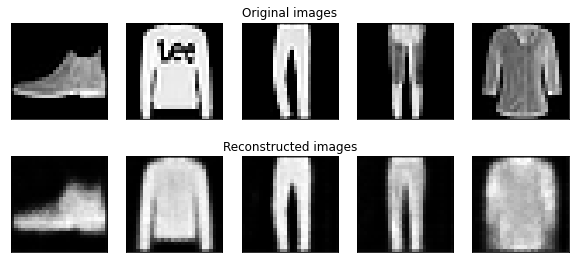

partial train loss (single batch): 6983.952148

partial train loss (single batch): 7011.402344

partial train loss (single batch): 6888.295898

partial train loss (single batch): 6947.552734

partial train loss (single batch): 6881.833984

partial train loss (single batch): 6600.067871

partial train loss (single batch): 6584.669922

partial train loss (single batch): 6412.998535

partial train loss (single batch): 6594.724121

partial train loss (single batch): 6576.740234

partial train loss (single batch): 6730.751953

partial train loss (single batch): 6960.978027

partial train loss (single batch): 6596.472656

partial train loss (single batch): 6723.148926

partial train loss (single batch): 6925.946777

partial train loss (single batch): 6839.296387

partial train loss (single batch): 6569.837402

partial train loss (single batch): 6158.141602

partial train loss (single batch): 6823.666992

partial train loss (single batch): 6722.776855

partial train loss (single batch): 6868.362305

partial train loss (single batch): 6625.029297

partial train loss (single batch): 6861.874023

partial train loss (single batch): 6593.120117

partial train loss (single batch): 6732.144531

partial train loss (single batch): 6354.636719

partial train loss (single batch): 6977.977539

partial train loss (single batch): 6610.516602

partial train loss (single batch): 7084.039062

partial train loss (single batch): 6541.644531

partial train loss (single batch): 7082.319336

partial train loss (single batch): 6464.395996

partial train loss (single batch): 6848.505371

partial train loss (single batch): 7128.291992

partial train loss (single batch): 6783.204590

partial train loss (single batch): 6795.528320

partial train loss (single batch): 6896.160645

partial train loss (single batch): 6623.554688

partial train loss (single batch): 6706.350586

partial train loss (single batch): 6743.191895

partial train loss (single batch): 6581.632324

partial train loss (single batch): 6647.754883

partial train loss (single batch): 6691.584961

partial train loss (single batch): 6944.354004

partial train loss (single batch): 6795.091797

partial train loss (single batch): 6454.972168

partial train loss (single batch): 6612.189453

partial train loss (single batch): 6702.514160

partial train loss (single batch): 6862.732422

partial train loss (single batch): 6620.681641

partial train loss (single batch): 6867.462402

partial train loss (single batch): 6603.191895

partial train loss (single batch): 6634.406738

partial train loss (single batch): 6616.370117

partial train loss (single batch): 6432.415039

partial train loss (single batch): 7068.341309

partial train loss (single batch): 7078.273438

partial train loss (single batch): 6856.507812

partial train loss (single batch): 6540.239746

partial train loss (single batch): 6648.073242

partial train loss (single batch): 6779.751465

partial train loss (single batch): 6724.043945

partial train loss (single batch): 6741.426270

partial train loss (single batch): 7038.465332

partial train loss (single batch): 6595.832520

partial train loss (single batch): 6606.488281

partial train loss (single batch): 6664.593750

partial train loss (single batch): 6733.107910

partial train loss (single batch): 6818.613770

partial train loss (single batch): 6473.616211

partial train loss (single batch): 6643.335938

partial train loss (single batch): 6502.374023

partial train loss (single batch): 6901.708496

partial train loss (single batch): 6491.847656

partial train loss (single batch): 6863.907227

partial train loss (single batch): 6971.308594

partial train loss (single batch): 6885.374023

partial train loss (single batch): 6672.179199

partial train loss (single batch): 6789.045898

partial train loss (single batch): 6614.909180

partial train loss (single batch): 6632.523926

partial train loss (single batch): 7085.928223

partial train loss (single batch): 6822.739746

partial train loss (single batch): 6756.030273

partial train loss (single batch): 6815.985352

partial train loss (single batch): 6518.613770

partial train loss (single batch): 6725.522461

partial train loss (single batch): 6911.906250

partial train loss (single batch): 6683.222168

partial train loss (single batch): 6934.766113

partial train loss (single batch): 6774.071289

partial train loss (single batch): 6451.545410

partial train loss (single batch): 6666.217773

partial train loss (single batch): 6627.550293

partial train loss (single batch): 6706.055176

partial train loss (single batch): 6750.977539

partial train loss (single batch): 6829.921875

partial train loss (single batch): 6960.271973

partial train loss (single batch): 6675.915039

partial train loss (single batch): 6892.115234

partial train loss (single batch): 6999.559570

partial train loss (single batch): 6968.937500

partial train loss (single batch): 6774.155273

partial train loss (single batch): 6789.567871

partial train loss (single batch): 6765.025391

partial train loss (single batch): 6618.567871

partial train loss (single batch): 6547.366211

partial train loss (single batch): 6654.944336

partial train loss (single batch): 6651.830566

partial train loss (single batch): 6581.375000

partial train loss (single batch): 6394.413086

partial train loss (single batch): 6946.044434

partial train loss (single batch): 6845.562500

partial train loss (single batch): 6504.599121

partial train loss (single batch): 6933.705078

partial train loss (single batch): 6582.695312

partial train loss (single batch): 7062.076172

partial train loss (single batch): 6790.265137

partial train loss (single batch): 6993.794922

partial train loss (single batch): 6670.970703

partial train loss (single batch): 6594.700195

partial train loss (single batch): 6762.557129

partial train loss (single batch): 6642.196777

partial train loss (single batch): 6493.614258

partial train loss (single batch): 6703.420898

partial train loss (single batch): 6690.157227

partial train loss (single batch): 6838.854492

partial train loss (single batch): 6718.372070

partial train loss (single batch): 6682.220703

partial train loss (single batch): 6873.529297

partial train loss (single batch): 6605.931152

partial train loss (single batch): 6697.142578

partial train loss (single batch): 6622.233398

partial train loss (single batch): 6627.116211

partial train loss (single batch): 7097.157227

partial train loss (single batch): 6673.793945

partial train loss (single batch): 6711.061035

partial train loss (single batch): 6696.935547

partial train loss (single batch): 6788.359863

partial train loss (single batch): 6693.106934

partial train loss (single batch): 6834.646973

partial train loss (single batch): 6936.665527

partial train loss (single batch): 6621.859375

partial train loss (single batch): 6625.951172

partial train loss (single batch): 6831.015625

partial train loss (single batch): 6733.045410

partial train loss (single batch): 6660.893066

partial train loss (single batch): 6750.851074

partial train loss (single batch): 6564.149902

partial train loss (single batch): 6847.715820

partial train loss (single batch): 6615.128418

partial train loss (single batch): 6756.766602

partial train loss (single batch): 6539.547363

partial train loss (single batch): 6737.263184

partial train loss (single batch): 6510.219727

partial train loss (single batch): 6702.430176

partial train loss (single batch): 6531.687988

partial train loss (single batch): 6819.103027

partial train loss (single batch): 6610.937500

partial train loss (single batch): 6671.918945

partial train loss (single batch): 6752.319336

partial train loss (single batch): 6810.081543

partial train loss (single batch): 6864.658203

partial train loss (single batch): 6912.998047

partial train loss (single batch): 6818.695312

partial train loss (single batch): 6943.545898

partial train loss (single batch): 6924.178223

partial train loss (single batch): 6661.317383

partial train loss (single batch): 6980.725586

partial train loss (single batch): 6671.423828

partial train loss (single batch): 6834.149414

partial train loss (single batch): 6842.905273

partial train loss (single batch): 6700.001465

partial train loss (single batch): 6675.114258

partial train loss (single batch): 6633.373047

partial train loss (single batch): 6744.992188

partial train loss (single batch): 6783.733398

partial train loss (single batch): 6441.098633

partial train loss (single batch): 6706.443848

partial train loss (single batch): 6669.673828

partial train loss (single batch): 6632.373535

partial train loss (single batch): 6856.107910

partial train loss (single batch): 6573.436523

partial train loss (single batch): 6615.694824

partial train loss (single batch): 6963.502441

partial train loss (single batch): 6844.424805

partial train loss (single batch): 6812.302734

partial train loss (single batch): 3431.969971

EPOCH 16/30     train loss 26.315       val loss 26.442

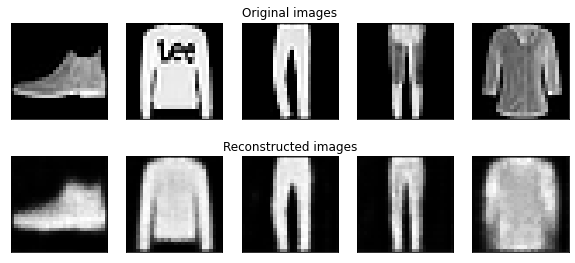

partial train loss (single batch): 6965.127441

partial train loss (single batch): 6984.106934

partial train loss (single batch): 6932.191895

partial train loss (single batch): 6892.635742

partial train loss (single batch): 6827.489258

partial train loss (single batch): 6562.956055

partial train loss (single batch): 6469.647949

partial train loss (single batch): 6448.565430

partial train loss (single batch): 6591.327148

partial train loss (single batch): 6468.720703

partial train loss (single batch): 6693.780273

partial train loss (single batch): 6935.669922

partial train loss (single batch): 6612.308105

partial train loss (single batch): 6693.337891

partial train loss (single batch): 6898.682617

partial train loss (single batch): 6852.914551

partial train loss (single batch): 6649.265625

partial train loss (single batch): 6176.466797

partial train loss (single batch): 6710.775879

partial train loss (single batch): 6750.509277

partial train loss (single batch): 6877.911621

partial train loss (single batch): 6625.021973

partial train loss (single batch): 6811.490723

partial train loss (single batch): 6605.593750

partial train loss (single batch): 6777.024902

partial train loss (single batch): 6276.160645

partial train loss (single batch): 6869.498047

partial train loss (single batch): 6529.225586

partial train loss (single batch): 7072.403809

partial train loss (single batch): 6576.435547

partial train loss (single batch): 7067.622559

partial train loss (single batch): 6564.338379

partial train loss (single batch): 6725.477539

partial train loss (single batch): 7066.062012

partial train loss (single batch): 6712.845703

partial train loss (single batch): 6771.920410

partial train loss (single batch): 6891.978516

partial train loss (single batch): 6588.255371

partial train loss (single batch): 6661.512695

partial train loss (single batch): 6775.300781

partial train loss (single batch): 6634.179199

partial train loss (single batch): 6563.376465

partial train loss (single batch): 6778.910156

partial train loss (single batch): 6899.076172

partial train loss (single batch): 6806.122070

partial train loss (single batch): 6438.484863

partial train loss (single batch): 6530.950684

partial train loss (single batch): 6725.670898

partial train loss (single batch): 6828.295898

partial train loss (single batch): 6657.026367

partial train loss (single batch): 6801.490234

partial train loss (single batch): 6660.589355

partial train loss (single batch): 6688.145508

partial train loss (single batch): 6619.103027

partial train loss (single batch): 6397.685059

partial train loss (single batch): 6945.637695

partial train loss (single batch): 7072.054688

partial train loss (single batch): 6854.187988

partial train loss (single batch): 6597.780273

partial train loss (single batch): 6571.772949

partial train loss (single batch): 6731.207031

partial train loss (single batch): 6691.471191

partial train loss (single batch): 6660.143555

partial train loss (single batch): 6955.449219

partial train loss (single batch): 6568.717773

partial train loss (single batch): 6588.185059

partial train loss (single batch): 6667.034668

partial train loss (single batch): 6715.401367

partial train loss (single batch): 6879.367188

partial train loss (single batch): 6455.610352

partial train loss (single batch): 6623.214844

partial train loss (single batch): 6542.158203

partial train loss (single batch): 6933.301758

partial train loss (single batch): 6494.279297

partial train loss (single batch): 6867.655273

partial train loss (single batch): 7000.848633

partial train loss (single batch): 6875.111328

partial train loss (single batch): 6634.882812

partial train loss (single batch): 6841.191406

partial train loss (single batch): 6565.789062

partial train loss (single batch): 6589.118164

partial train loss (single batch): 7097.659668

partial train loss (single batch): 6863.799805

partial train loss (single batch): 6728.279785

partial train loss (single batch): 6758.979492

partial train loss (single batch): 6529.168945

partial train loss (single batch): 6618.008789

partial train loss (single batch): 6935.881836

partial train loss (single batch): 6610.342773

partial train loss (single batch): 6919.435547

partial train loss (single batch): 6758.819336

partial train loss (single batch): 6449.887207

partial train loss (single batch): 6612.116211

partial train loss (single batch): 6703.092773

partial train loss (single batch): 6697.031738

partial train loss (single batch): 6697.774414

partial train loss (single batch): 6738.635742

partial train loss (single batch): 6886.764160

partial train loss (single batch): 6584.984863

partial train loss (single batch): 6854.195801

partial train loss (single batch): 6952.089355

partial train loss (single batch): 6987.409180

partial train loss (single batch): 6755.210938

partial train loss (single batch): 6712.770020

partial train loss (single batch): 6696.143066

partial train loss (single batch): 6629.336914

partial train loss (single batch): 6527.048340

partial train loss (single batch): 6622.518555

partial train loss (single batch): 6602.002930

partial train loss (single batch): 6535.789062

partial train loss (single batch): 6390.697266

partial train loss (single batch): 6965.287598

partial train loss (single batch): 6866.291504

partial train loss (single batch): 6474.790527

partial train loss (single batch): 6869.103516

partial train loss (single batch): 6593.901367

partial train loss (single batch): 7020.843750

partial train loss (single batch): 6812.114258

partial train loss (single batch): 7025.755859

partial train loss (single batch): 6724.538086

partial train loss (single batch): 6645.257324

partial train loss (single batch): 6775.257812

partial train loss (single batch): 6695.597656

partial train loss (single batch): 6485.384766

partial train loss (single batch): 6743.527832

partial train loss (single batch): 6702.073242

partial train loss (single batch): 6874.322754

partial train loss (single batch): 6735.367188

partial train loss (single batch): 6669.447266

partial train loss (single batch): 6915.431152

partial train loss (single batch): 6582.966309

partial train loss (single batch): 6578.467773

partial train loss (single batch): 6675.214355

partial train loss (single batch): 6621.370117

partial train loss (single batch): 7194.816895

partial train loss (single batch): 6567.461914

partial train loss (single batch): 6700.357910

partial train loss (single batch): 6693.567383

partial train loss (single batch): 6840.412598

partial train loss (single batch): 6670.753418

partial train loss (single batch): 6833.455566

partial train loss (single batch): 6987.126953

partial train loss (single batch): 6612.089844

partial train loss (single batch): 6672.466309

partial train loss (single batch): 6793.325195

partial train loss (single batch): 6803.141602

partial train loss (single batch): 6672.794922

partial train loss (single batch): 6738.658691

partial train loss (single batch): 6526.435059

partial train loss (single batch): 6792.352539

partial train loss (single batch): 6672.104492

partial train loss (single batch): 6778.446289

partial train loss (single batch): 6495.185547

partial train loss (single batch): 6805.610352

partial train loss (single batch): 6496.629883

partial train loss (single batch): 6739.953125

partial train loss (single batch): 6549.832031

partial train loss (single batch): 6865.932129

partial train loss (single batch): 6546.458984

partial train loss (single batch): 6697.810547

partial train loss (single batch): 6743.458008

partial train loss (single batch): 6793.017578

partial train loss (single batch): 6840.314453

partial train loss (single batch): 6928.887695

partial train loss (single batch): 6845.556641

partial train loss (single batch): 6779.010742

partial train loss (single batch): 6949.177734

partial train loss (single batch): 6582.467285

partial train loss (single batch): 7078.183594

partial train loss (single batch): 6657.438477

partial train loss (single batch): 6781.236816

partial train loss (single batch): 6836.152832

partial train loss (single batch): 6639.181641

partial train loss (single batch): 6604.133789

partial train loss (single batch): 6663.591797

partial train loss (single batch): 6618.495117

partial train loss (single batch): 6682.700195

partial train loss (single batch): 6418.540039

partial train loss (single batch): 6691.959473

partial train loss (single batch): 6655.823730

partial train loss (single batch): 6637.115234

partial train loss (single batch): 6918.582520

partial train loss (single batch): 6528.108887

partial train loss (single batch): 6485.833496

partial train loss (single batch): 6921.793945

partial train loss (single batch): 6830.278320

partial train loss (single batch): 6791.464844

partial train loss (single batch): 3447.617188

EPOCH 17/30     train loss 26.261       val loss 26.439

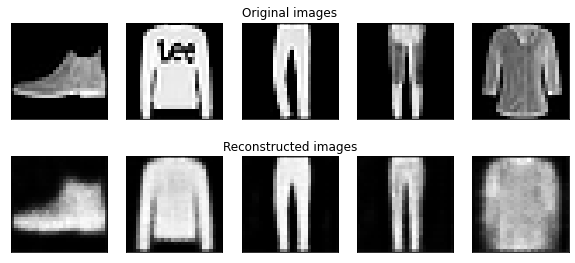

partial train loss (single batch): 7052.748047

partial train loss (single batch): 6949.749512

partial train loss (single batch): 6887.286133

partial train loss (single batch): 6886.939453

partial train loss (single batch): 6876.371094

partial train loss (single batch): 6503.484375

partial train loss (single batch): 6574.460938

partial train loss (single batch): 6402.769531

partial train loss (single batch): 6560.154297

partial train loss (single batch): 6471.312500

partial train loss (single batch): 6732.054688

partial train loss (single batch): 6925.637695

partial train loss (single batch): 6496.008789

partial train loss (single batch): 6677.021484

partial train loss (single batch): 6967.620117

partial train loss (single batch): 6790.473633

partial train loss (single batch): 6646.702148

partial train loss (single batch): 6175.911133

partial train loss (single batch): 6793.758301

partial train loss (single batch): 6686.424316

partial train loss (single batch): 6851.396973

partial train loss (single batch): 6748.251953

partial train loss (single batch): 6817.519043

partial train loss (single batch): 6587.741211

partial train loss (single batch): 6763.052734

partial train loss (single batch): 6304.250977

partial train loss (single batch): 6905.648438

partial train loss (single batch): 6527.184570

partial train loss (single batch): 7089.623047

partial train loss (single batch): 6603.666016

partial train loss (single batch): 7068.661133

partial train loss (single batch): 6517.344727

partial train loss (single batch): 6680.928711

partial train loss (single batch): 7046.506836

partial train loss (single batch): 6668.117676

partial train loss (single batch): 6683.500977

partial train loss (single batch): 6943.691406

partial train loss (single batch): 6603.679688

partial train loss (single batch): 6598.479492

partial train loss (single batch): 6617.788086

partial train loss (single batch): 6555.721680

partial train loss (single batch): 6568.050781

partial train loss (single batch): 6686.866211

partial train loss (single batch): 6786.193359

partial train loss (single batch): 6803.658203

partial train loss (single batch): 6458.318359

partial train loss (single batch): 6572.455078

partial train loss (single batch): 6740.610352

partial train loss (single batch): 6857.076172

partial train loss (single batch): 6690.358398

partial train loss (single batch): 6794.297363

partial train loss (single batch): 6565.359863

partial train loss (single batch): 6681.711426

partial train loss (single batch): 6606.598633

partial train loss (single batch): 6369.482422

partial train loss (single batch): 6963.930664

partial train loss (single batch): 7043.578125

partial train loss (single batch): 6738.787109

partial train loss (single batch): 6594.710449

partial train loss (single batch): 6600.487793

partial train loss (single batch): 6754.265625

partial train loss (single batch): 6674.792969

partial train loss (single batch): 6690.723145

partial train loss (single batch): 7081.488281

partial train loss (single batch): 6551.738770

partial train loss (single batch): 6597.358887

partial train loss (single batch): 6623.781738

partial train loss (single batch): 6747.009766

partial train loss (single batch): 6891.182617

partial train loss (single batch): 6390.175293

partial train loss (single batch): 6592.310059

partial train loss (single batch): 6449.065430

partial train loss (single batch): 6948.656250

partial train loss (single batch): 6508.111328

partial train loss (single batch): 6901.594727

partial train loss (single batch): 6929.941895

partial train loss (single batch): 6856.471680

partial train loss (single batch): 6586.349609

partial train loss (single batch): 6809.650879

partial train loss (single batch): 6597.223633

partial train loss (single batch): 6612.117188

partial train loss (single batch): 7116.935059

partial train loss (single batch): 6888.937012

partial train loss (single batch): 6731.890137

partial train loss (single batch): 6806.481445

partial train loss (single batch): 6552.870117

partial train loss (single batch): 6610.570312

partial train loss (single batch): 6918.701660

partial train loss (single batch): 6547.673340

partial train loss (single batch): 6905.058594

partial train loss (single batch): 6684.202148

partial train loss (single batch): 6452.772461

partial train loss (single batch): 6581.949707

partial train loss (single batch): 6650.190430

partial train loss (single batch): 6633.991699

partial train loss (single batch): 6794.970703

partial train loss (single batch): 6792.824219

partial train loss (single batch): 6870.166504

partial train loss (single batch): 6590.975586

partial train loss (single batch): 6825.573730

partial train loss (single batch): 6938.422363

partial train loss (single batch): 7051.549316

partial train loss (single batch): 6665.991699

partial train loss (single batch): 6679.246094

partial train loss (single batch): 6771.514648

partial train loss (single batch): 6566.973145

partial train loss (single batch): 6529.005859

partial train loss (single batch): 6594.986328

partial train loss (single batch): 6567.433594

partial train loss (single batch): 6534.282227

partial train loss (single batch): 6421.775879

partial train loss (single batch): 6911.135742

partial train loss (single batch): 6888.029297

partial train loss (single batch): 6523.863281

partial train loss (single batch): 6895.089355

partial train loss (single batch): 6508.577148

partial train loss (single batch): 7060.374023

partial train loss (single batch): 6725.562500

partial train loss (single batch): 6896.132812

partial train loss (single batch): 6627.591797

partial train loss (single batch): 6592.064453

partial train loss (single batch): 6801.379883

partial train loss (single batch): 6663.426758

partial train loss (single batch): 6494.659180

partial train loss (single batch): 6726.198242

partial train loss (single batch): 6696.916016

partial train loss (single batch): 6829.520508

partial train loss (single batch): 6749.380859

partial train loss (single batch): 6694.030273

partial train loss (single batch): 6881.079590

partial train loss (single batch): 6576.455078

partial train loss (single batch): 6618.476562

partial train loss (single batch): 6555.146484

partial train loss (single batch): 6573.383789

partial train loss (single batch): 7104.206055

partial train loss (single batch): 6606.968750

partial train loss (single batch): 6777.071777

partial train loss (single batch): 6702.810547

partial train loss (single batch): 6826.437500

partial train loss (single batch): 6670.505371

partial train loss (single batch): 6793.321777

partial train loss (single batch): 6953.701172

partial train loss (single batch): 6563.637695

partial train loss (single batch): 6614.052734

partial train loss (single batch): 6803.476074

partial train loss (single batch): 6684.332031

partial train loss (single batch): 6633.590820

partial train loss (single batch): 6778.646973

partial train loss (single batch): 6503.498047

partial train loss (single batch): 6800.811523

partial train loss (single batch): 6663.784180

partial train loss (single batch): 6873.520020

partial train loss (single batch): 6456.074707

partial train loss (single batch): 6680.059570

partial train loss (single batch): 6460.968750

partial train loss (single batch): 6696.479492

partial train loss (single batch): 6610.266113

partial train loss (single batch): 6866.119141

partial train loss (single batch): 6499.370117

partial train loss (single batch): 6625.065430

partial train loss (single batch): 6676.000000

partial train loss (single batch): 6837.527832

partial train loss (single batch): 6737.334961

partial train loss (single batch): 6932.838867

partial train loss (single batch): 6749.428711

partial train loss (single batch): 6825.846191

partial train loss (single batch): 6901.312012

partial train loss (single batch): 6612.591309

partial train loss (single batch): 7015.761719

partial train loss (single batch): 6629.956543

partial train loss (single batch): 6834.301758

partial train loss (single batch): 6834.303711

partial train loss (single batch): 6688.300781

partial train loss (single batch): 6593.560547

partial train loss (single batch): 6643.721680

partial train loss (single batch): 6671.283203

partial train loss (single batch): 6717.293945

partial train loss (single batch): 6384.374023

partial train loss (single batch): 6725.005859

partial train loss (single batch): 6668.144043

partial train loss (single batch): 6595.863281

partial train loss (single batch): 6894.655273

partial train loss (single batch): 6513.597168

partial train loss (single batch): 6505.522949

partial train loss (single batch): 6937.127930

partial train loss (single batch): 6854.157227

partial train loss (single batch): 6800.914062

partial train loss (single batch): 3361.420410

EPOCH 18/30     train loss 26.215       val loss 26.248

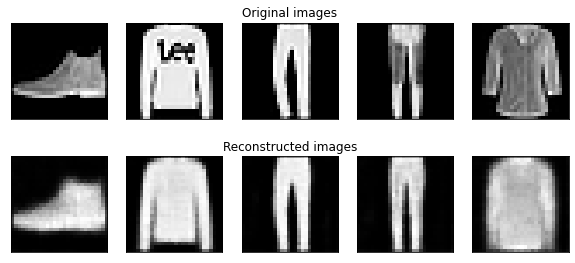

partial train loss (single batch): 6889.557617

partial train loss (single batch): 7050.776367

partial train loss (single batch): 6865.056641

partial train loss (single batch): 6830.094238

partial train loss (single batch): 6883.437500

partial train loss (single batch): 6623.013184

partial train loss (single batch): 6528.670898

partial train loss (single batch): 6366.462891

partial train loss (single batch): 6580.699219

partial train loss (single batch): 6481.855957

partial train loss (single batch): 6702.742676

partial train loss (single batch): 6978.678711

partial train loss (single batch): 6537.964844

partial train loss (single batch): 6622.769043

partial train loss (single batch): 6857.245117

partial train loss (single batch): 6912.567383

partial train loss (single batch): 6599.813965

partial train loss (single batch): 6136.475586

partial train loss (single batch): 6757.894043

partial train loss (single batch): 6682.417969

partial train loss (single batch): 6875.938477

partial train loss (single batch): 6647.874512

partial train loss (single batch): 6754.470703

partial train loss (single batch): 6568.801758

partial train loss (single batch): 6776.151855

partial train loss (single batch): 6340.709961

partial train loss (single batch): 6953.448730

partial train loss (single batch): 6590.369141

partial train loss (single batch): 7068.273438

partial train loss (single batch): 6508.622070

partial train loss (single batch): 7034.612305

partial train loss (single batch): 6536.084473

partial train loss (single batch): 6696.078125

partial train loss (single batch): 7004.403809

partial train loss (single batch): 6773.514648

partial train loss (single batch): 6672.091797

partial train loss (single batch): 6856.690430

partial train loss (single batch): 6557.660156

partial train loss (single batch): 6598.417969

partial train loss (single batch): 6598.563477

partial train loss (single batch): 6568.047852

partial train loss (single batch): 6654.026367

partial train loss (single batch): 6691.714844

partial train loss (single batch): 6801.880371

partial train loss (single batch): 6847.538086

partial train loss (single batch): 6528.076172

partial train loss (single batch): 6470.386719

partial train loss (single batch): 6781.074219

partial train loss (single batch): 6866.397461

partial train loss (single batch): 6656.680664

partial train loss (single batch): 6848.454590

partial train loss (single batch): 6572.644043

partial train loss (single batch): 6620.883301

partial train loss (single batch): 6640.851074

partial train loss (single batch): 6376.448730

partial train loss (single batch): 6951.635254

partial train loss (single batch): 7058.984375

partial train loss (single batch): 6711.583496

partial train loss (single batch): 6570.075195

partial train loss (single batch): 6602.383789

partial train loss (single batch): 6728.723145

partial train loss (single batch): 6664.590820

partial train loss (single batch): 6679.767090

partial train loss (single batch): 7126.931641

partial train loss (single batch): 6496.606934

partial train loss (single batch): 6498.049805

partial train loss (single batch): 6576.414551

partial train loss (single batch): 6717.360352

partial train loss (single batch): 6833.144531

partial train loss (single batch): 6473.120117

partial train loss (single batch): 6579.186035

partial train loss (single batch): 6455.681641

partial train loss (single batch): 6914.323242

partial train loss (single batch): 6488.620117

partial train loss (single batch): 6776.881836

partial train loss (single batch): 6887.435547

partial train loss (single batch): 6867.138672

partial train loss (single batch): 6561.973633

partial train loss (single batch): 6797.911621

partial train loss (single batch): 6543.129395

partial train loss (single batch): 6574.921875

partial train loss (single batch): 7054.440430

partial train loss (single batch): 6857.026855

partial train loss (single batch): 6732.364258

partial train loss (single batch): 6828.899414

partial train loss (single batch): 6503.260254

partial train loss (single batch): 6704.209961

partial train loss (single batch): 6867.169434

partial train loss (single batch): 6625.088867

partial train loss (single batch): 6964.347168

partial train loss (single batch): 6725.426270

partial train loss (single batch): 6527.170898

partial train loss (single batch): 6613.658691

partial train loss (single batch): 6551.298828

partial train loss (single batch): 6618.187012

partial train loss (single batch): 6609.402344

partial train loss (single batch): 6776.531250

partial train loss (single batch): 6939.452148

partial train loss (single batch): 6587.778809

partial train loss (single batch): 6908.076172

partial train loss (single batch): 6936.598145

partial train loss (single batch): 7002.214844

partial train loss (single batch): 6712.141113

partial train loss (single batch): 6724.564941

partial train loss (single batch): 6685.889160

partial train loss (single batch): 6608.616211

partial train loss (single batch): 6505.564453

partial train loss (single batch): 6603.006836

partial train loss (single batch): 6580.012695

partial train loss (single batch): 6554.312988

partial train loss (single batch): 6410.834961

partial train loss (single batch): 6918.141113

partial train loss (single batch): 6899.348633

partial train loss (single batch): 6494.435059

partial train loss (single batch): 6869.235352

partial train loss (single batch): 6611.482422

partial train loss (single batch): 7063.230957

partial train loss (single batch): 6801.675781

partial train loss (single batch): 6971.818359

partial train loss (single batch): 6629.068848

partial train loss (single batch): 6633.483398

partial train loss (single batch): 6829.839355

partial train loss (single batch): 6650.093262

partial train loss (single batch): 6468.674805

partial train loss (single batch): 6681.509277

partial train loss (single batch): 6672.336426

partial train loss (single batch): 6807.600586

partial train loss (single batch): 6762.538086

partial train loss (single batch): 6695.937500

partial train loss (single batch): 6879.773926

partial train loss (single batch): 6651.377441

partial train loss (single batch): 6591.781250

partial train loss (single batch): 6601.064453

partial train loss (single batch): 6564.564453

partial train loss (single batch): 7116.203125

partial train loss (single batch): 6612.433594

partial train loss (single batch): 6649.008301

partial train loss (single batch): 6724.542969

partial train loss (single batch): 6868.625488

partial train loss (single batch): 6629.589844

partial train loss (single batch): 6790.081543

partial train loss (single batch): 6906.277832

partial train loss (single batch): 6535.768555

partial train loss (single batch): 6631.289062

partial train loss (single batch): 6699.003906

partial train loss (single batch): 6732.291016

partial train loss (single batch): 6593.337891

partial train loss (single batch): 6692.831055

partial train loss (single batch): 6449.132812

partial train loss (single batch): 6726.622559

partial train loss (single batch): 6631.975586

partial train loss (single batch): 6756.332031

partial train loss (single batch): 6404.665039

partial train loss (single batch): 6658.583984

partial train loss (single batch): 6451.488770

partial train loss (single batch): 6730.510742

partial train loss (single batch): 6498.409180

partial train loss (single batch): 6786.809082

partial train loss (single batch): 6451.026855

partial train loss (single batch): 6596.131348

partial train loss (single batch): 6654.676270

partial train loss (single batch): 6802.010742

partial train loss (single batch): 6784.191895

partial train loss (single batch): 6949.081055

partial train loss (single batch): 6725.202148

partial train loss (single batch): 6798.161621

partial train loss (single batch): 6898.432129

partial train loss (single batch): 6538.116699

partial train loss (single batch): 6970.454102

partial train loss (single batch): 6673.940430

partial train loss (single batch): 6825.131836

partial train loss (single batch): 6793.443848

partial train loss (single batch): 6704.657227

partial train loss (single batch): 6632.311523

partial train loss (single batch): 6556.898438

partial train loss (single batch): 6654.012207

partial train loss (single batch): 6657.429688

partial train loss (single batch): 6408.902832

partial train loss (single batch): 6646.495605

partial train loss (single batch): 6606.326172

partial train loss (single batch): 6568.182617

partial train loss (single batch): 6869.917969

partial train loss (single batch): 6501.758789

partial train loss (single batch): 6515.443359

partial train loss (single batch): 7017.651367

partial train loss (single batch): 6795.134277

partial train loss (single batch): 6719.339355

partial train loss (single batch): 3362.001465

EPOCH 19/30     train loss 26.175       val loss 26.257

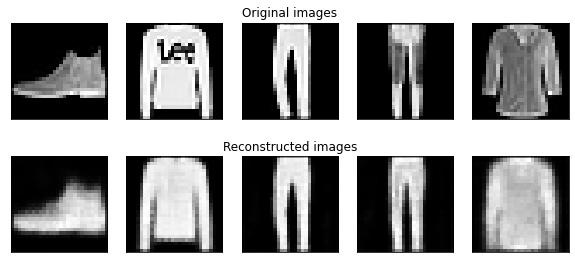

partial train loss (single batch): 6933.171875

partial train loss (single batch): 6923.399902

partial train loss (single batch): 6831.944336

partial train loss (single batch): 6850.148926

partial train loss (single batch): 6842.658203

partial train loss (single batch): 6539.435547

partial train loss (single batch): 6487.625000

partial train loss (single batch): 6313.881836

partial train loss (single batch): 6567.601074

partial train loss (single batch): 6458.381348

partial train loss (single batch): 6744.573730

partial train loss (single batch): 6950.671875

partial train loss (single batch): 6543.467285

partial train loss (single batch): 6648.182129

partial train loss (single batch): 6895.769531

partial train loss (single batch): 6749.753906

partial train loss (single batch): 6568.360352

partial train loss (single batch): 6137.913086

partial train loss (single batch): 6754.333984

partial train loss (single batch): 6595.611328

partial train loss (single batch): 6796.830566

partial train loss (single batch): 6598.593750

partial train loss (single batch): 6808.604492

partial train loss (single batch): 6491.744141

partial train loss (single batch): 6737.242188

partial train loss (single batch): 6332.026855

partial train loss (single batch): 6886.626953

partial train loss (single batch): 6493.464844

partial train loss (single batch): 7057.880371

partial train loss (single batch): 6492.530273

partial train loss (single batch): 7038.990234

partial train loss (single batch): 6493.981934

partial train loss (single batch): 6709.613770

partial train loss (single batch): 6984.691895

partial train loss (single batch): 6698.309082

partial train loss (single batch): 6728.597168

partial train loss (single batch): 6916.806641

partial train loss (single batch): 6583.714844

partial train loss (single batch): 6653.167969

partial train loss (single batch): 6643.051270

partial train loss (single batch): 6523.379395

partial train loss (single batch): 6569.250000

partial train loss (single batch): 6657.425293

partial train loss (single batch): 6857.748047

partial train loss (single batch): 6741.312012

partial train loss (single batch): 6439.589844

partial train loss (single batch): 6539.025879

partial train loss (single batch): 6682.147949

partial train loss (single batch): 6757.324219

partial train loss (single batch): 6582.893555

partial train loss (single batch): 6817.052734

partial train loss (single batch): 6560.439453

partial train loss (single batch): 6572.666992

partial train loss (single batch): 6579.406250

partial train loss (single batch): 6406.886230

partial train loss (single batch): 6957.862305

partial train loss (single batch): 6974.395508

partial train loss (single batch): 6808.247070

partial train loss (single batch): 6552.170898

partial train loss (single batch): 6583.742676

partial train loss (single batch): 6698.404785

partial train loss (single batch): 6676.837891

partial train loss (single batch): 6691.796875

partial train loss (single batch): 7096.460938

partial train loss (single batch): 6494.596191

partial train loss (single batch): 6508.541992

partial train loss (single batch): 6566.249023

partial train loss (single batch): 6746.259277

partial train loss (single batch): 6792.915039

partial train loss (single batch): 6428.261719

partial train loss (single batch): 6628.622070

partial train loss (single batch): 6432.571289

partial train loss (single batch): 6931.544922

partial train loss (single batch): 6519.737305

partial train loss (single batch): 6818.145020

partial train loss (single batch): 6916.033691

partial train loss (single batch): 6833.066406

partial train loss (single batch): 6590.636719

partial train loss (single batch): 6751.540039

partial train loss (single batch): 6569.411133

partial train loss (single batch): 6514.943848

partial train loss (single batch): 7020.205078

partial train loss (single batch): 6859.216797

partial train loss (single batch): 6703.932129

partial train loss (single batch): 6692.412109

partial train loss (single batch): 6482.381348

partial train loss (single batch): 6635.432617

partial train loss (single batch): 6812.138672

partial train loss (single batch): 6579.958008

partial train loss (single batch): 6867.101562

partial train loss (single batch): 6682.075195

partial train loss (single batch): 6385.838379

partial train loss (single batch): 6539.388672

partial train loss (single batch): 6602.127930

partial train loss (single batch): 6652.943359

partial train loss (single batch): 6599.278320

partial train loss (single batch): 6681.788574

partial train loss (single batch): 6820.875000

partial train loss (single batch): 6599.020508

partial train loss (single batch): 6837.393555

partial train loss (single batch): 6940.200684

partial train loss (single batch): 6904.170898

partial train loss (single batch): 6682.148438

partial train loss (single batch): 6697.487793

partial train loss (single batch): 6679.143066

partial train loss (single batch): 6561.913086

partial train loss (single batch): 6437.163574

partial train loss (single batch): 6607.117676

partial train loss (single batch): 6565.924805

partial train loss (single batch): 6534.394531

partial train loss (single batch): 6382.600586

partial train loss (single batch): 6897.336426

partial train loss (single batch): 6803.823242

partial train loss (single batch): 6503.271973

partial train loss (single batch): 6881.857422

partial train loss (single batch): 6551.898438

partial train loss (single batch): 6962.954590

partial train loss (single batch): 6735.344238

partial train loss (single batch): 6857.750000

partial train loss (single batch): 6597.058594

partial train loss (single batch): 6603.599609

partial train loss (single batch): 6800.255859

partial train loss (single batch): 6600.324219

partial train loss (single batch): 6433.603516

partial train loss (single batch): 6687.645996

partial train loss (single batch): 6694.624023

partial train loss (single batch): 6839.648926

partial train loss (single batch): 6661.692383

partial train loss (single batch): 6619.285156

partial train loss (single batch): 6882.924805

partial train loss (single batch): 6591.306641

partial train loss (single batch): 6540.619629

partial train loss (single batch): 6604.729004

partial train loss (single batch): 6626.042969

partial train loss (single batch): 7039.015625

partial train loss (single batch): 6524.706543

partial train loss (single batch): 6701.295898

partial train loss (single batch): 6665.541504

partial train loss (single batch): 6806.823730

partial train loss (single batch): 6642.937500

partial train loss (single batch): 6782.902832

partial train loss (single batch): 6957.170898

partial train loss (single batch): 6594.394043

partial train loss (single batch): 6670.332031

partial train loss (single batch): 6777.786621

partial train loss (single batch): 6744.076172

partial train loss (single batch): 6599.362793

partial train loss (single batch): 6715.651855

partial train loss (single batch): 6514.967285

partial train loss (single batch): 6713.168457

partial train loss (single batch): 6625.623535

partial train loss (single batch): 6820.282227

partial train loss (single batch): 6456.306152

partial train loss (single batch): 6670.207520

partial train loss (single batch): 6398.798828

partial train loss (single batch): 6728.396484

partial train loss (single batch): 6532.221680

partial train loss (single batch): 6784.094238

partial train loss (single batch): 6516.278320

partial train loss (single batch): 6597.782715

partial train loss (single batch): 6738.134277

partial train loss (single batch): 6767.071289

partial train loss (single batch): 6744.566406

partial train loss (single batch): 6898.647461

partial train loss (single batch): 6808.758789

partial train loss (single batch): 6730.411133

partial train loss (single batch): 6921.526367

partial train loss (single batch): 6583.933105

partial train loss (single batch): 6980.687500

partial train loss (single batch): 6633.578125

partial train loss (single batch): 6810.228516

partial train loss (single batch): 6733.582520

partial train loss (single batch): 6651.369141

partial train loss (single batch): 6650.218750

partial train loss (single batch): 6565.531250

partial train loss (single batch): 6633.772461

partial train loss (single batch): 6619.566895

partial train loss (single batch): 6392.314453

partial train loss (single batch): 6647.516602

partial train loss (single batch): 6585.201660

partial train loss (single batch): 6604.685059

partial train loss (single batch): 6791.638672

partial train loss (single batch): 6494.870117

partial train loss (single batch): 6542.710938

partial train loss (single batch): 6865.672363

partial train loss (single batch): 6861.900391

partial train loss (single batch): 6734.817383

partial train loss (single batch): 3350.800781

EPOCH 20/30     train loss 26.100       val loss 26.140

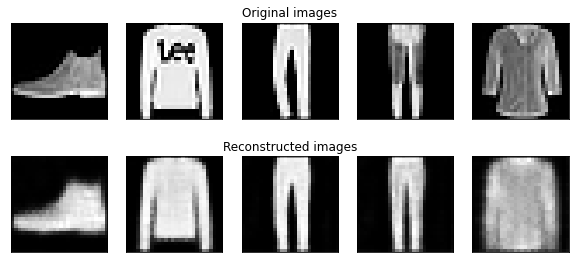

partial train loss (single batch): 6967.503906

partial train loss (single batch): 6965.604492

partial train loss (single batch): 6834.349609

partial train loss (single batch): 6806.934570

partial train loss (single batch): 6880.765625

partial train loss (single batch): 6548.168945

partial train loss (single batch): 6482.818359

partial train loss (single batch): 6337.386719

partial train loss (single batch): 6551.203125

partial train loss (single batch): 6422.381836

partial train loss (single batch): 6695.515625

partial train loss (single batch): 6907.253906

partial train loss (single batch): 6496.585938

partial train loss (single batch): 6594.123047

partial train loss (single batch): 6848.686035

partial train loss (single batch): 6772.695801

partial train loss (single batch): 6596.164062

partial train loss (single batch): 6075.578613

partial train loss (single batch): 6722.881836

partial train loss (single batch): 6564.000000

partial train loss (single batch): 6819.359863

partial train loss (single batch): 6607.528320

partial train loss (single batch): 6750.913574

partial train loss (single batch): 6553.891602

partial train loss (single batch): 6713.784180

partial train loss (single batch): 6284.894043

partial train loss (single batch): 6848.263672

partial train loss (single batch): 6500.884277

partial train loss (single batch): 7018.820312

partial train loss (single batch): 6457.120117

partial train loss (single batch): 6972.238281

partial train loss (single batch): 6531.275879

partial train loss (single batch): 6734.117676

partial train loss (single batch): 6970.497559

partial train loss (single batch): 6742.130371

partial train loss (single batch): 6735.345703

partial train loss (single batch): 6863.736328

partial train loss (single batch): 6545.456543

partial train loss (single batch): 6605.079102

partial train loss (single batch): 6673.151367

partial train loss (single batch): 6530.314941

partial train loss (single batch): 6514.695312

partial train loss (single batch): 6704.091797

partial train loss (single batch): 6753.335938

partial train loss (single batch): 6769.609375

partial train loss (single batch): 6357.823730

partial train loss (single batch): 6497.050781

partial train loss (single batch): 6685.949219

partial train loss (single batch): 6806.358398

partial train loss (single batch): 6578.842773

partial train loss (single batch): 6848.564941

partial train loss (single batch): 6557.557129

partial train loss (single batch): 6607.012695

partial train loss (single batch): 6619.450195

partial train loss (single batch): 6372.919922

partial train loss (single batch): 6911.815430

partial train loss (single batch): 6930.555664

partial train loss (single batch): 6843.354492

partial train loss (single batch): 6537.959961

partial train loss (single batch): 6581.877441

partial train loss (single batch): 6809.146973

partial train loss (single batch): 6711.534668

partial train loss (single batch): 6654.047852

partial train loss (single batch): 7032.426758

partial train loss (single batch): 6550.769043

partial train loss (single batch): 6464.145020

partial train loss (single batch): 6540.352539

partial train loss (single batch): 6718.237793

partial train loss (single batch): 6835.065430

partial train loss (single batch): 6358.617676

partial train loss (single batch): 6609.665527

partial train loss (single batch): 6531.244141

partial train loss (single batch): 6961.662109

partial train loss (single batch): 6489.522461

partial train loss (single batch): 6880.864258

partial train loss (single batch): 6841.901855

partial train loss (single batch): 6838.520996

partial train loss (single batch): 6594.098145

partial train loss (single batch): 6781.434082

partial train loss (single batch): 6558.974121

partial train loss (single batch): 6475.464844

partial train loss (single batch): 7034.286133

partial train loss (single batch): 6947.083496

partial train loss (single batch): 6721.785156

partial train loss (single batch): 6738.375488

partial train loss (single batch): 6528.722656

partial train loss (single batch): 6663.279297

partial train loss (single batch): 6875.844727

partial train loss (single batch): 6597.511230

partial train loss (single batch): 6950.616211

partial train loss (single batch): 6614.362305

partial train loss (single batch): 6386.323730

partial train loss (single batch): 6503.478027

partial train loss (single batch): 6562.779785

partial train loss (single batch): 6605.378906

partial train loss (single batch): 6644.229980

partial train loss (single batch): 6743.182129

partial train loss (single batch): 6833.600586

partial train loss (single batch): 6558.154297

partial train loss (single batch): 6850.594727

partial train loss (single batch): 6882.159668

partial train loss (single batch): 6984.647461

partial train loss (single batch): 6657.657715

partial train loss (single batch): 6625.260742

partial train loss (single batch): 6654.874512

partial train loss (single batch): 6563.299316

partial train loss (single batch): 6480.584961

partial train loss (single batch): 6584.790527

partial train loss (single batch): 6503.705566

partial train loss (single batch): 6517.146973

partial train loss (single batch): 6326.862305

partial train loss (single batch): 6804.836914

partial train loss (single batch): 6788.478027

partial train loss (single batch): 6373.022949

partial train loss (single batch): 6810.096191

partial train loss (single batch): 6555.465332

partial train loss (single batch): 6981.160156

partial train loss (single batch): 6740.317383

partial train loss (single batch): 6913.656250

partial train loss (single batch): 6628.300293

partial train loss (single batch): 6574.985840

partial train loss (single batch): 6744.623047

partial train loss (single batch): 6637.523438

partial train loss (single batch): 6491.568359

partial train loss (single batch): 6644.552246

partial train loss (single batch): 6716.525391

partial train loss (single batch): 6780.300781

partial train loss (single batch): 6662.635254

partial train loss (single batch): 6645.255859

partial train loss (single batch): 6893.622070

partial train loss (single batch): 6576.655273

partial train loss (single batch): 6552.063477

partial train loss (single batch): 6584.942383

partial train loss (single batch): 6560.109375

partial train loss (single batch): 7123.330078

partial train loss (single batch): 6580.899902

partial train loss (single batch): 6629.896484

partial train loss (single batch): 6693.620605

partial train loss (single batch): 6784.879395

partial train loss (single batch): 6622.535645

partial train loss (single batch): 6709.218750

partial train loss (single batch): 6840.778320

partial train loss (single batch): 6549.287598

partial train loss (single batch): 6630.401855

partial train loss (single batch): 6734.472656

partial train loss (single batch): 6692.691895

partial train loss (single batch): 6589.843750

partial train loss (single batch): 6740.538086

partial train loss (single batch): 6433.291016

partial train loss (single batch): 6717.358887

partial train loss (single batch): 6612.050293

partial train loss (single batch): 6700.575195

partial train loss (single batch): 6445.625000

partial train loss (single batch): 6676.367188

partial train loss (single batch): 6414.541992

partial train loss (single batch): 6664.191895

partial train loss (single batch): 6473.507812

partial train loss (single batch): 6845.822266

partial train loss (single batch): 6470.987305

partial train loss (single batch): 6547.787109

partial train loss (single batch): 6732.427246

partial train loss (single batch): 6734.555664

partial train loss (single batch): 6714.567383

partial train loss (single batch): 6908.178711

partial train loss (single batch): 6753.558594

partial train loss (single batch): 6799.659180

partial train loss (single batch): 6873.416992

partial train loss (single batch): 6590.081055

partial train loss (single batch): 6917.060547

partial train loss (single batch): 6555.369141

partial train loss (single batch): 6821.724121

partial train loss (single batch): 6747.377441

partial train loss (single batch): 6664.325195

partial train loss (single batch): 6607.879883

partial train loss (single batch): 6561.712402

partial train loss (single batch): 6610.692871

partial train loss (single batch): 6660.215820

partial train loss (single batch): 6333.248535

partial train loss (single batch): 6641.945312

partial train loss (single batch): 6546.506836

partial train loss (single batch): 6607.054688

partial train loss (single batch): 6832.235352

partial train loss (single batch): 6497.714844

partial train loss (single batch): 6514.717285

partial train loss (single batch): 6901.840820

partial train loss (single batch): 6791.279785

partial train loss (single batch): 6720.039062

partial train loss (single batch): 3337.536133

EPOCH 21/30     train loss 26.061       val loss 26.198

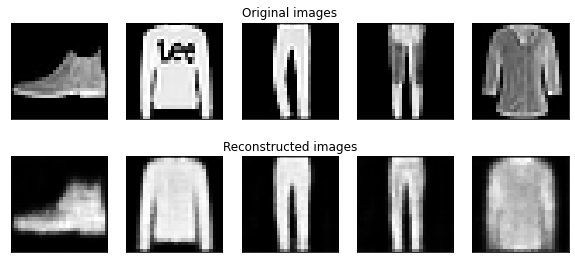

partial train loss (single batch): 6860.802734

partial train loss (single batch): 6958.292480

partial train loss (single batch): 6804.885742

partial train loss (single batch): 6839.574219

partial train loss (single batch): 6794.860840

partial train loss (single batch): 6541.158691

partial train loss (single batch): 6500.062988

partial train loss (single batch): 6332.922363

partial train loss (single batch): 6577.983398

partial train loss (single batch): 6446.980469

partial train loss (single batch): 6642.950195

partial train loss (single batch): 6856.931641

partial train loss (single batch): 6494.443848

partial train loss (single batch): 6562.231934

partial train loss (single batch): 6861.763184

partial train loss (single batch): 6782.442383

partial train loss (single batch): 6554.648438

partial train loss (single batch): 6151.637207

partial train loss (single batch): 6723.402832

partial train loss (single batch): 6656.892578

partial train loss (single batch): 6772.690918

partial train loss (single batch): 6511.251465

partial train loss (single batch): 6729.614746

partial train loss (single batch): 6520.895508

partial train loss (single batch): 6651.108887

partial train loss (single batch): 6288.575195

partial train loss (single batch): 6839.719727

partial train loss (single batch): 6468.018066

partial train loss (single batch): 6956.947266

partial train loss (single batch): 6459.991211

partial train loss (single batch): 6977.574219

partial train loss (single batch): 6414.905762

partial train loss (single batch): 6648.578125

partial train loss (single batch): 7012.116211

partial train loss (single batch): 6636.110840

partial train loss (single batch): 6691.208984

partial train loss (single batch): 6886.278320

partial train loss (single batch): 6514.542969

partial train loss (single batch): 6546.256348

partial train loss (single batch): 6596.403320

partial train loss (single batch): 6515.233398

partial train loss (single batch): 6466.237305

partial train loss (single batch): 6601.775391

partial train loss (single batch): 6813.404785

partial train loss (single batch): 6804.246094

partial train loss (single batch): 6378.576172

partial train loss (single batch): 6513.242188

partial train loss (single batch): 6640.917969

partial train loss (single batch): 6786.336426

partial train loss (single batch): 6601.496582

partial train loss (single batch): 6750.208008

partial train loss (single batch): 6566.740723

partial train loss (single batch): 6599.753418

partial train loss (single batch): 6551.648438

partial train loss (single batch): 6340.796875

partial train loss (single batch): 6885.591309

partial train loss (single batch): 7089.109375

partial train loss (single batch): 6756.639648

partial train loss (single batch): 6481.527344

partial train loss (single batch): 6566.048340

partial train loss (single batch): 6663.102539

partial train loss (single batch): 6658.295410

partial train loss (single batch): 6609.565430

partial train loss (single batch): 7019.687012

partial train loss (single batch): 6475.264160

partial train loss (single batch): 6444.976562

partial train loss (single batch): 6601.282227

partial train loss (single batch): 6653.640625

partial train loss (single batch): 6760.188477

partial train loss (single batch): 6376.537109

partial train loss (single batch): 6562.481934

partial train loss (single batch): 6384.809570

partial train loss (single batch): 6883.845215

partial train loss (single batch): 6485.580566

partial train loss (single batch): 6728.570801

partial train loss (single batch): 6880.455078

partial train loss (single batch): 6738.104492

partial train loss (single batch): 6581.532227

partial train loss (single batch): 6676.796875

partial train loss (single batch): 6556.083008

partial train loss (single batch): 6539.968262

partial train loss (single batch): 7072.530273

partial train loss (single batch): 6821.894043

partial train loss (single batch): 6719.189453

partial train loss (single batch): 6683.593750

partial train loss (single batch): 6475.527344

partial train loss (single batch): 6608.686523

partial train loss (single batch): 6842.820312

partial train loss (single batch): 6500.889648

partial train loss (single batch): 6917.504395

partial train loss (single batch): 6699.937988

partial train loss (single batch): 6396.593262

partial train loss (single batch): 6523.452637

partial train loss (single batch): 6615.996582

partial train loss (single batch): 6633.594727

partial train loss (single batch): 6606.313965

partial train loss (single batch): 6712.034180

partial train loss (single batch): 6822.800781

partial train loss (single batch): 6585.582520

partial train loss (single batch): 6763.590820

partial train loss (single batch): 6967.074219

partial train loss (single batch): 6948.199219

partial train loss (single batch): 6656.856934

partial train loss (single batch): 6689.970215

partial train loss (single batch): 6674.403320

partial train loss (single batch): 6574.629883

partial train loss (single batch): 6461.353027

partial train loss (single batch): 6548.307617

partial train loss (single batch): 6536.545898

partial train loss (single batch): 6455.056152

partial train loss (single batch): 6398.851562

partial train loss (single batch): 6818.627930

partial train loss (single batch): 6794.201660

partial train loss (single batch): 6422.075195

partial train loss (single batch): 6802.801270

partial train loss (single batch): 6527.819336

partial train loss (single batch): 7058.835938

partial train loss (single batch): 6719.296875

partial train loss (single batch): 6849.122070

partial train loss (single batch): 6568.184570

partial train loss (single batch): 6616.496094

partial train loss (single batch): 6736.999023

partial train loss (single batch): 6582.657227

partial train loss (single batch): 6450.715820

partial train loss (single batch): 6746.005859

partial train loss (single batch): 6684.220215

partial train loss (single batch): 6900.040039

partial train loss (single batch): 6638.509277

partial train loss (single batch): 6683.375977

partial train loss (single batch): 6860.910156

partial train loss (single batch): 6586.061035

partial train loss (single batch): 6532.146973

partial train loss (single batch): 6604.227539

partial train loss (single batch): 6586.561035

partial train loss (single batch): 7027.335938

partial train loss (single batch): 6509.044434

partial train loss (single batch): 6701.658691

partial train loss (single batch): 6684.639160

partial train loss (single batch): 6836.070312

partial train loss (single batch): 6579.690918

partial train loss (single batch): 6783.035156

partial train loss (single batch): 6993.135742

partial train loss (single batch): 6558.159668

partial train loss (single batch): 6559.226074

partial train loss (single batch): 6847.659180

partial train loss (single batch): 6723.641602

partial train loss (single batch): 6561.098145

partial train loss (single batch): 6689.175781

partial train loss (single batch): 6478.554199

partial train loss (single batch): 6718.143555

partial train loss (single batch): 6634.165039

partial train loss (single batch): 6768.725586

partial train loss (single batch): 6460.836426

partial train loss (single batch): 6740.806641

partial train loss (single batch): 6437.591797

partial train loss (single batch): 6632.491211

partial train loss (single batch): 6446.587402

partial train loss (single batch): 6753.604492

partial train loss (single batch): 6465.127441

partial train loss (single batch): 6603.020996

partial train loss (single batch): 6665.005859

partial train loss (single batch): 6760.867188

partial train loss (single batch): 6715.577148

partial train loss (single batch): 6898.803711

partial train loss (single batch): 6727.781738

partial train loss (single batch): 6763.368164

partial train loss (single batch): 6908.729004

partial train loss (single batch): 6523.742188

partial train loss (single batch): 6984.524414

partial train loss (single batch): 6574.386230

partial train loss (single batch): 6767.500977

partial train loss (single batch): 6754.225098

partial train loss (single batch): 6627.309570

partial train loss (single batch): 6592.077637

partial train loss (single batch): 6551.116211

partial train loss (single batch): 6609.319824

partial train loss (single batch): 6643.652344

partial train loss (single batch): 6323.926270

partial train loss (single batch): 6616.377930

partial train loss (single batch): 6586.471191

partial train loss (single batch): 6620.473633

partial train loss (single batch): 6798.973633

partial train loss (single batch): 6526.092773

partial train loss (single batch): 6489.050781

partial train loss (single batch): 6882.700195

partial train loss (single batch): 6778.903809

partial train loss (single batch): 6680.735840

partial train loss (single batch): 3348.155518

EPOCH 22/30     train loss 26.014       val loss 26.240

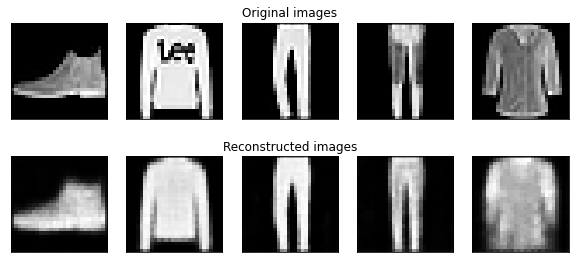

partial train loss (single batch): 6939.442871

partial train loss (single batch): 6897.821777

partial train loss (single batch): 6812.152832

partial train loss (single batch): 6744.244141

partial train loss (single batch): 6834.522949

partial train loss (single batch): 6573.761230

partial train loss (single batch): 6444.527344

partial train loss (single batch): 6322.472656

partial train loss (single batch): 6544.583008

partial train loss (single batch): 6421.212891

partial train loss (single batch): 6688.719727

partial train loss (single batch): 6909.531738

partial train loss (single batch): 6514.166992

partial train loss (single batch): 6570.557129

partial train loss (single batch): 6877.909180

partial train loss (single batch): 6718.028320

partial train loss (single batch): 6542.373047

partial train loss (single batch): 6066.769043

partial train loss (single batch): 6643.478027

partial train loss (single batch): 6635.264648

partial train loss (single batch): 6833.882324

partial train loss (single batch): 6615.583008

partial train loss (single batch): 6730.643555

partial train loss (single batch): 6504.759766

partial train loss (single batch): 6673.964844

partial train loss (single batch): 6294.012695

partial train loss (single batch): 6814.073242

partial train loss (single batch): 6487.674805

partial train loss (single batch): 7042.377930

partial train loss (single batch): 6447.820312

partial train loss (single batch): 6993.198242

partial train loss (single batch): 6475.011230

partial train loss (single batch): 6655.654297

partial train loss (single batch): 7008.717285

partial train loss (single batch): 6670.422852

partial train loss (single batch): 6691.441406

partial train loss (single batch): 6836.664551

partial train loss (single batch): 6552.893555

partial train loss (single batch): 6563.980469

partial train loss (single batch): 6551.908691

partial train loss (single batch): 6518.208984

partial train loss (single batch): 6518.769043

partial train loss (single batch): 6631.207520

partial train loss (single batch): 6833.980469

partial train loss (single batch): 6788.364258

partial train loss (single batch): 6401.706543

partial train loss (single batch): 6497.364258

partial train loss (single batch): 6654.546387

partial train loss (single batch): 6732.455078

partial train loss (single batch): 6557.013184

partial train loss (single batch): 6782.643555

partial train loss (single batch): 6620.223633

partial train loss (single batch): 6550.311035

partial train loss (single batch): 6559.782227

partial train loss (single batch): 6354.834473

partial train loss (single batch): 6909.029785

partial train loss (single batch): 6988.168457

partial train loss (single batch): 6729.359863

partial train loss (single batch): 6473.536621

partial train loss (single batch): 6537.249023

partial train loss (single batch): 6727.380859

partial train loss (single batch): 6644.206543

partial train loss (single batch): 6647.571289

partial train loss (single batch): 7010.627441

partial train loss (single batch): 6471.213379

partial train loss (single batch): 6466.779297

partial train loss (single batch): 6500.394531

partial train loss (single batch): 6641.084961

partial train loss (single batch): 6842.723145

partial train loss (single batch): 6393.318359

partial train loss (single batch): 6548.561035

partial train loss (single batch): 6390.163574

partial train loss (single batch): 6912.548828

partial train loss (single batch): 6493.647461

partial train loss (single batch): 6764.517090

partial train loss (single batch): 6910.163574

partial train loss (single batch): 6773.535645

partial train loss (single batch): 6635.723145

partial train loss (single batch): 6680.674805

partial train loss (single batch): 6543.829102

partial train loss (single batch): 6463.436523

partial train loss (single batch): 6933.154297

partial train loss (single batch): 6795.638184

partial train loss (single batch): 6668.144531

partial train loss (single batch): 6681.818359

partial train loss (single batch): 6502.256348

partial train loss (single batch): 6638.303711

partial train loss (single batch): 6852.019043

partial train loss (single batch): 6535.405273

partial train loss (single batch): 6918.914062

partial train loss (single batch): 6661.527832

partial train loss (single batch): 6362.840820

partial train loss (single batch): 6528.245117

partial train loss (single batch): 6593.598145

partial train loss (single batch): 6629.731445

partial train loss (single batch): 6592.484375

partial train loss (single batch): 6686.296875

partial train loss (single batch): 6809.836914

partial train loss (single batch): 6537.467285

partial train loss (single batch): 6802.603516

partial train loss (single batch): 6875.893066

partial train loss (single batch): 6918.132812

partial train loss (single batch): 6689.267578

partial train loss (single batch): 6635.990234

partial train loss (single batch): 6682.004395

partial train loss (single batch): 6534.690918

partial train loss (single batch): 6387.964355

partial train loss (single batch): 6528.279785

partial train loss (single batch): 6512.597168

partial train loss (single batch): 6407.310547

partial train loss (single batch): 6319.998047

partial train loss (single batch): 6854.346680

partial train loss (single batch): 6745.246582

partial train loss (single batch): 6376.049805

partial train loss (single batch): 6734.660156

partial train loss (single batch): 6522.673828

partial train loss (single batch): 6935.458984

partial train loss (single batch): 6653.218750

partial train loss (single batch): 6877.733398

partial train loss (single batch): 6583.478027

partial train loss (single batch): 6570.244141

partial train loss (single batch): 6737.233398

partial train loss (single batch): 6657.932129

partial train loss (single batch): 6420.147949

partial train loss (single batch): 6651.760742

partial train loss (single batch): 6620.887695

partial train loss (single batch): 6800.555664

partial train loss (single batch): 6717.390137

partial train loss (single batch): 6606.990234

partial train loss (single batch): 6774.477539

partial train loss (single batch): 6547.529297

partial train loss (single batch): 6510.061035

partial train loss (single batch): 6541.246582

partial train loss (single batch): 6569.059082

partial train loss (single batch): 7086.813965

partial train loss (single batch): 6570.989746

partial train loss (single batch): 6668.943359

partial train loss (single batch): 6652.565430

partial train loss (single batch): 6761.644531

partial train loss (single batch): 6580.880859

partial train loss (single batch): 6739.808105

partial train loss (single batch): 6901.691406

partial train loss (single batch): 6548.691406

partial train loss (single batch): 6642.982910

partial train loss (single batch): 6786.789551

partial train loss (single batch): 6685.168457

partial train loss (single batch): 6575.208984

partial train loss (single batch): 6684.107910

partial train loss (single batch): 6465.765625

partial train loss (single batch): 6725.290039

partial train loss (single batch): 6583.774414

partial train loss (single batch): 6750.760742

partial train loss (single batch): 6452.252930

partial train loss (single batch): 6656.090820

partial train loss (single batch): 6461.627930

partial train loss (single batch): 6613.221191

partial train loss (single batch): 6399.392090

partial train loss (single batch): 6796.052734

partial train loss (single batch): 6424.585938

partial train loss (single batch): 6596.361328

partial train loss (single batch): 6639.588867

partial train loss (single batch): 6747.148438

partial train loss (single batch): 6745.302246

partial train loss (single batch): 6888.540527

partial train loss (single batch): 6709.869141

partial train loss (single batch): 6762.347168

partial train loss (single batch): 6933.562012

partial train loss (single batch): 6527.470703

partial train loss (single batch): 6949.328125

partial train loss (single batch): 6589.703125

partial train loss (single batch): 6794.619141

partial train loss (single batch): 6695.574219

partial train loss (single batch): 6608.567871

partial train loss (single batch): 6609.751953

partial train loss (single batch): 6668.613281

partial train loss (single batch): 6599.613281

partial train loss (single batch): 6640.873047

partial train loss (single batch): 6361.256836

partial train loss (single batch): 6663.142090

partial train loss (single batch): 6559.626953

partial train loss (single batch): 6535.401367

partial train loss (single batch): 6832.221680

partial train loss (single batch): 6466.639648

partial train loss (single batch): 6512.573730

partial train loss (single batch): 6851.937012

partial train loss (single batch): 6852.598145

partial train loss (single batch): 6734.181641

partial train loss (single batch): 3363.266602

EPOCH 23/30     train loss 25.982       val loss 25.960

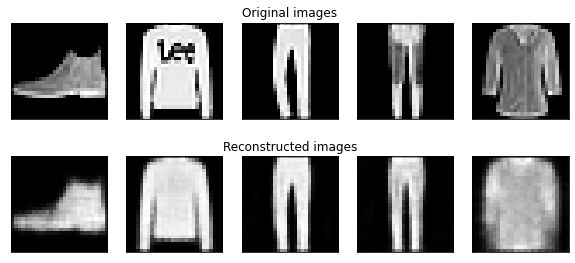

partial train loss (single batch): 6883.867676

partial train loss (single batch): 6936.854492

partial train loss (single batch): 6818.351562

partial train loss (single batch): 6850.919434

partial train loss (single batch): 6801.247559

partial train loss (single batch): 6522.863281

partial train loss (single batch): 6463.388184

partial train loss (single batch): 6287.641113

partial train loss (single batch): 6530.545898

partial train loss (single batch): 6474.737305

partial train loss (single batch): 6672.576172

partial train loss (single batch): 6842.334961

partial train loss (single batch): 6480.497559

partial train loss (single batch): 6595.317383

partial train loss (single batch): 6839.066406

partial train loss (single batch): 6738.817383

partial train loss (single batch): 6544.713867

partial train loss (single batch): 6046.508301

partial train loss (single batch): 6664.811523

partial train loss (single batch): 6558.233398

partial train loss (single batch): 6832.015137

partial train loss (single batch): 6542.601562

partial train loss (single batch): 6683.266602

partial train loss (single batch): 6499.536133

partial train loss (single batch): 6713.567383

partial train loss (single batch): 6210.727539

partial train loss (single batch): 6824.399414

partial train loss (single batch): 6530.606934

partial train loss (single batch): 7025.667969

partial train loss (single batch): 6473.621094

partial train loss (single batch): 6983.581543

partial train loss (single batch): 6505.833008

partial train loss (single batch): 6642.061523

partial train loss (single batch): 7029.875977

partial train loss (single batch): 6686.424316

partial train loss (single batch): 6657.810547

partial train loss (single batch): 6862.912598

partial train loss (single batch): 6538.399902

partial train loss (single batch): 6595.453613

partial train loss (single batch): 6657.337891

partial train loss (single batch): 6510.193359

partial train loss (single batch): 6540.094238

partial train loss (single batch): 6599.343262

partial train loss (single batch): 6835.055176

partial train loss (single batch): 6772.758301

partial train loss (single batch): 6322.759766

partial train loss (single batch): 6496.698242

partial train loss (single batch): 6634.711914

partial train loss (single batch): 6747.812500

partial train loss (single batch): 6500.472168

partial train loss (single batch): 6753.079102

partial train loss (single batch): 6545.882812

partial train loss (single batch): 6606.154297

partial train loss (single batch): 6543.540527

partial train loss (single batch): 6302.904297

partial train loss (single batch): 6875.450684

partial train loss (single batch): 6983.113770

partial train loss (single batch): 6781.070312

partial train loss (single batch): 6452.610840

partial train loss (single batch): 6570.545410

partial train loss (single batch): 6653.593262

partial train loss (single batch): 6615.438477

partial train loss (single batch): 6596.047363

partial train loss (single batch): 6937.390625

partial train loss (single batch): 6481.771484

partial train loss (single batch): 6497.915039

partial train loss (single batch): 6564.553223

partial train loss (single batch): 6575.179688

partial train loss (single batch): 6826.399902

partial train loss (single batch): 6386.967773

partial train loss (single batch): 6510.474609

partial train loss (single batch): 6399.689453

partial train loss (single batch): 6834.618164

partial train loss (single batch): 6466.125977

partial train loss (single batch): 6735.175781

partial train loss (single batch): 6861.203125

partial train loss (single batch): 6744.623535

partial train loss (single batch): 6545.656250

partial train loss (single batch): 6760.689453

partial train loss (single batch): 6515.461914

partial train loss (single batch): 6490.155273

partial train loss (single batch): 6975.017090

partial train loss (single batch): 6850.128906

partial train loss (single batch): 6666.712891

partial train loss (single batch): 6618.063477

partial train loss (single batch): 6547.550781

partial train loss (single batch): 6593.288086

partial train loss (single batch): 6870.456055

partial train loss (single batch): 6482.435547

partial train loss (single batch): 6840.513672

partial train loss (single batch): 6680.824219

partial train loss (single batch): 6356.978516

partial train loss (single batch): 6460.413086

partial train loss (single batch): 6606.008789

partial train loss (single batch): 6645.325195

partial train loss (single batch): 6601.090332

partial train loss (single batch): 6618.037109

partial train loss (single batch): 6822.398438

partial train loss (single batch): 6576.226074

partial train loss (single batch): 6837.160156

partial train loss (single batch): 6883.707031

partial train loss (single batch): 6905.167480

partial train loss (single batch): 6645.708008

partial train loss (single batch): 6685.668945

partial train loss (single batch): 6672.064453

partial train loss (single batch): 6543.341797

partial train loss (single batch): 6436.899414

partial train loss (single batch): 6552.411621

partial train loss (single batch): 6561.638184

partial train loss (single batch): 6483.335938

partial train loss (single batch): 6380.420898

partial train loss (single batch): 6870.837402

partial train loss (single batch): 6771.031738

partial train loss (single batch): 6405.518555

partial train loss (single batch): 6802.114746

partial train loss (single batch): 6523.640625

partial train loss (single batch): 6991.264648

partial train loss (single batch): 6718.601074

partial train loss (single batch): 6880.120605

partial train loss (single batch): 6587.395020

partial train loss (single batch): 6521.249512

partial train loss (single batch): 6645.029785

partial train loss (single batch): 6591.401855

partial train loss (single batch): 6401.550781

partial train loss (single batch): 6670.747559

partial train loss (single batch): 6608.259277

partial train loss (single batch): 6792.746094

partial train loss (single batch): 6621.970703

partial train loss (single batch): 6605.882812

partial train loss (single batch): 6813.633789

partial train loss (single batch): 6505.072266

partial train loss (single batch): 6506.920898

partial train loss (single batch): 6523.539551

partial train loss (single batch): 6453.324219

partial train loss (single batch): 7010.170410

partial train loss (single batch): 6485.853516

partial train loss (single batch): 6638.569824

partial train loss (single batch): 6621.921875

partial train loss (single batch): 6762.433594

partial train loss (single batch): 6571.616211

partial train loss (single batch): 6734.127441

partial train loss (single batch): 6840.183594

partial train loss (single batch): 6526.052734

partial train loss (single batch): 6611.280273

partial train loss (single batch): 6690.714355

partial train loss (single batch): 6746.927246

partial train loss (single batch): 6557.656250

partial train loss (single batch): 6626.209961

partial train loss (single batch): 6391.494141

partial train loss (single batch): 6675.669922

partial train loss (single batch): 6613.895508

partial train loss (single batch): 6736.630859

partial train loss (single batch): 6408.145508

partial train loss (single batch): 6694.636719

partial train loss (single batch): 6403.207520

partial train loss (single batch): 6668.136719

partial train loss (single batch): 6479.334473

partial train loss (single batch): 6749.557129

partial train loss (single batch): 6448.702148

partial train loss (single batch): 6572.772461

partial train loss (single batch): 6629.548828

partial train loss (single batch): 6665.862305

partial train loss (single batch): 6718.668945

partial train loss (single batch): 6774.473633

partial train loss (single batch): 6772.874512

partial train loss (single batch): 6768.059570

partial train loss (single batch): 6905.330078

partial train loss (single batch): 6541.165039

partial train loss (single batch): 6927.565918

partial train loss (single batch): 6587.886719

partial train loss (single batch): 6680.583984

partial train loss (single batch): 6749.593750

partial train loss (single batch): 6587.949707

partial train loss (single batch): 6543.063477

partial train loss (single batch): 6508.729492

partial train loss (single batch): 6608.381348

partial train loss (single batch): 6639.713867

partial train loss (single batch): 6342.315430

partial train loss (single batch): 6613.570312

partial train loss (single batch): 6597.312988

partial train loss (single batch): 6565.478027

partial train loss (single batch): 6822.074707

partial train loss (single batch): 6439.951172

partial train loss (single batch): 6462.549805

partial train loss (single batch): 6908.373047

partial train loss (single batch): 6754.825684

partial train loss (single batch): 6799.266602

partial train loss (single batch): 3316.788086

EPOCH 24/30     train loss 25.940       val loss 26.077

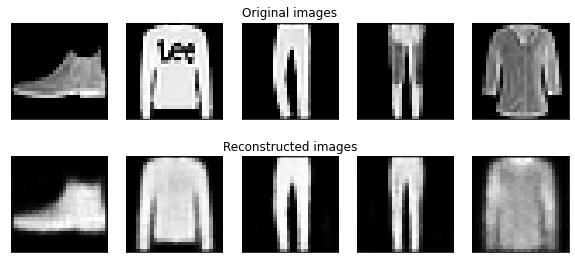

partial train loss (single batch): 6917.972168

partial train loss (single batch): 6981.033691

partial train loss (single batch): 6792.159180

partial train loss (single batch): 6771.856934

partial train loss (single batch): 6802.870605

partial train loss (single batch): 6491.447754

partial train loss (single batch): 6454.701660

partial train loss (single batch): 6288.144043

partial train loss (single batch): 6560.053711

partial train loss (single batch): 6441.627930

partial train loss (single batch): 6606.474609

partial train loss (single batch): 6884.900391

partial train loss (single batch): 6418.935059

partial train loss (single batch): 6552.516602

partial train loss (single batch): 6784.932617

partial train loss (single batch): 6757.145020

partial train loss (single batch): 6520.676270

partial train loss (single batch): 6124.354004

partial train loss (single batch): 6705.304199

partial train loss (single batch): 6620.811035

partial train loss (single batch): 6741.789551

partial train loss (single batch): 6532.300293

partial train loss (single batch): 6753.295410

partial train loss (single batch): 6495.371094

partial train loss (single batch): 6594.173340

partial train loss (single batch): 6243.037598

partial train loss (single batch): 6795.928223

partial train loss (single batch): 6450.517578

partial train loss (single batch): 6968.707031

partial train loss (single batch): 6378.695312

partial train loss (single batch): 6952.357422

partial train loss (single batch): 6473.472168

partial train loss (single batch): 6622.142578

partial train loss (single batch): 6970.793945

partial train loss (single batch): 6654.954590

partial train loss (single batch): 6676.048828

partial train loss (single batch): 6840.258789

partial train loss (single batch): 6501.966309

partial train loss (single batch): 6563.792480

partial train loss (single batch): 6607.313965

partial train loss (single batch): 6472.616211

partial train loss (single batch): 6474.195312

partial train loss (single batch): 6620.641113

partial train loss (single batch): 6841.083496

partial train loss (single batch): 6686.530762

partial train loss (single batch): 6299.678223

partial train loss (single batch): 6511.307617

partial train loss (single batch): 6667.417969

partial train loss (single batch): 6702.845215

partial train loss (single batch): 6558.993164

partial train loss (single batch): 6797.953125

partial train loss (single batch): 6517.679688

partial train loss (single batch): 6560.775391

partial train loss (single batch): 6537.778320

partial train loss (single batch): 6358.348633

partial train loss (single batch): 6797.732910

partial train loss (single batch): 6922.931641

partial train loss (single batch): 6716.705566

partial train loss (single batch): 6534.714844

partial train loss (single batch): 6567.109375

partial train loss (single batch): 6668.782227

partial train loss (single batch): 6608.017090

partial train loss (single batch): 6553.458008

partial train loss (single batch): 7017.698730

partial train loss (single batch): 6480.423828

partial train loss (single batch): 6471.476562

partial train loss (single batch): 6470.465332

partial train loss (single batch): 6610.517578

partial train loss (single batch): 6736.440430

partial train loss (single batch): 6318.366699

partial train loss (single batch): 6530.760254

partial train loss (single batch): 6378.107422

partial train loss (single batch): 6861.008789

partial train loss (single batch): 6370.501465

partial train loss (single batch): 6768.734375

partial train loss (single batch): 6891.292969

partial train loss (single batch): 6690.342773

partial train loss (single batch): 6494.029297

partial train loss (single batch): 6694.822266

partial train loss (single batch): 6505.970215

partial train loss (single batch): 6481.577637

partial train loss (single batch): 6999.938477

partial train loss (single batch): 6811.305664

partial train loss (single batch): 6704.815430

partial train loss (single batch): 6699.245117

partial train loss (single batch): 6455.321777

partial train loss (single batch): 6624.641113

partial train loss (single batch): 6775.276367

partial train loss (single batch): 6515.445312

partial train loss (single batch): 6853.624023

partial train loss (single batch): 6584.261719

partial train loss (single batch): 6401.835938

partial train loss (single batch): 6538.363770

partial train loss (single batch): 6540.070801

partial train loss (single batch): 6620.589844

partial train loss (single batch): 6608.618164

partial train loss (single batch): 6691.449219

partial train loss (single batch): 6803.967285

partial train loss (single batch): 6546.596680

partial train loss (single batch): 6756.036133

partial train loss (single batch): 6892.623047

partial train loss (single batch): 6854.795898

partial train loss (single batch): 6631.605957

partial train loss (single batch): 6615.305664

partial train loss (single batch): 6591.857422

partial train loss (single batch): 6534.888184

partial train loss (single batch): 6407.825195

partial train loss (single batch): 6530.610352

partial train loss (single batch): 6484.813477

partial train loss (single batch): 6464.744141

partial train loss (single batch): 6278.500000

partial train loss (single batch): 6816.391602

partial train loss (single batch): 6810.898438

partial train loss (single batch): 6403.612305

partial train loss (single batch): 6815.635742

partial train loss (single batch): 6494.463867

partial train loss (single batch): 6984.756348

partial train loss (single batch): 6705.470703

partial train loss (single batch): 6861.923828

partial train loss (single batch): 6497.523438

partial train loss (single batch): 6561.092773

partial train loss (single batch): 6729.974609

partial train loss (single batch): 6575.977051

partial train loss (single batch): 6452.042969

partial train loss (single batch): 6622.049805

partial train loss (single batch): 6641.323242

partial train loss (single batch): 6757.287598

partial train loss (single batch): 6603.802734

partial train loss (single batch): 6630.051270

partial train loss (single batch): 6782.824707

partial train loss (single batch): 6526.084961

partial train loss (single batch): 6543.183594

partial train loss (single batch): 6556.563965

partial train loss (single batch): 6506.139160

partial train loss (single batch): 7016.105469

partial train loss (single batch): 6512.034180

partial train loss (single batch): 6583.956055

partial train loss (single batch): 6596.548340

partial train loss (single batch): 6796.746094

partial train loss (single batch): 6553.360352

partial train loss (single batch): 6738.431641

partial train loss (single batch): 6834.282227

partial train loss (single batch): 6540.285156

partial train loss (single batch): 6574.396484

partial train loss (single batch): 6699.044922

partial train loss (single batch): 6676.087891

partial train loss (single batch): 6517.921387

partial train loss (single batch): 6626.083008

partial train loss (single batch): 6519.902832

partial train loss (single batch): 6730.277344

partial train loss (single batch): 6569.281250

partial train loss (single batch): 6770.361816

partial train loss (single batch): 6358.973633

partial train loss (single batch): 6598.041016

partial train loss (single batch): 6436.845215

partial train loss (single batch): 6648.183105

partial train loss (single batch): 6458.244141

partial train loss (single batch): 6790.811523

partial train loss (single batch): 6456.919434

partial train loss (single batch): 6569.462402

partial train loss (single batch): 6626.284180

partial train loss (single batch): 6676.480469

partial train loss (single batch): 6761.298828

partial train loss (single batch): 6871.812012

partial train loss (single batch): 6717.416992

partial train loss (single batch): 6779.388672

partial train loss (single batch): 6851.170898

partial train loss (single batch): 6511.255859

partial train loss (single batch): 6891.222656

partial train loss (single batch): 6627.016602

partial train loss (single batch): 6747.286133

partial train loss (single batch): 6746.310547

partial train loss (single batch): 6540.434570

partial train loss (single batch): 6573.007812

partial train loss (single batch): 6538.546387

partial train loss (single batch): 6611.422852

partial train loss (single batch): 6650.860352

partial train loss (single batch): 6302.862305

partial train loss (single batch): 6615.356445

partial train loss (single batch): 6560.914062

partial train loss (single batch): 6482.055176

partial train loss (single batch): 6782.633789

partial train loss (single batch): 6493.960449

partial train loss (single batch): 6482.470703

partial train loss (single batch): 6840.521973

partial train loss (single batch): 6798.459961

partial train loss (single batch): 6687.534668

partial train loss (single batch): 3321.393555

EPOCH 25/30     train loss 25.896       val loss 26.049

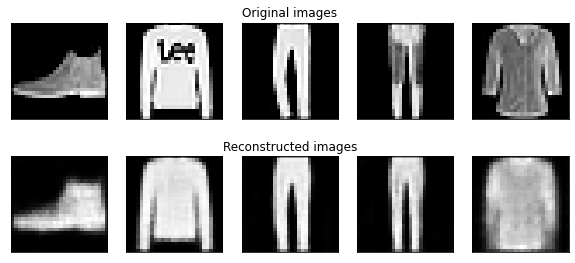

partial train loss (single batch): 6852.198242

partial train loss (single batch): 6905.513672

partial train loss (single batch): 6798.715332

partial train loss (single batch): 6760.865723

partial train loss (single batch): 6833.776855

partial train loss (single batch): 6488.615723

partial train loss (single batch): 6430.337402

partial train loss (single batch): 6307.556152

partial train loss (single batch): 6483.509277

partial train loss (single batch): 6419.939453

partial train loss (single batch): 6688.748047

partial train loss (single batch): 6859.989258

partial train loss (single batch): 6492.386719

partial train loss (single batch): 6586.628906

partial train loss (single batch): 6811.826660

partial train loss (single batch): 6761.122070

partial train loss (single batch): 6588.168945

partial train loss (single batch): 6057.725586

partial train loss (single batch): 6715.594727

partial train loss (single batch): 6579.069336

partial train loss (single batch): 6779.274414

partial train loss (single batch): 6556.902344

partial train loss (single batch): 6787.017090

partial train loss (single batch): 6533.609863

partial train loss (single batch): 6670.262207

partial train loss (single batch): 6261.053223

partial train loss (single batch): 6857.303223

partial train loss (single batch): 6439.797852

partial train loss (single batch): 6996.481934

partial train loss (single batch): 6442.264648

partial train loss (single batch): 6980.424805

partial train loss (single batch): 6422.687500

partial train loss (single batch): 6660.721680

partial train loss (single batch): 6992.381348

partial train loss (single batch): 6659.158203

partial train loss (single batch): 6581.682617

partial train loss (single batch): 6822.889648

partial train loss (single batch): 6530.458008

partial train loss (single batch): 6556.971191

partial train loss (single batch): 6550.401855

partial train loss (single batch): 6485.915527

partial train loss (single batch): 6502.960938

partial train loss (single batch): 6661.833008

partial train loss (single batch): 6780.967285

partial train loss (single batch): 6696.007324

partial train loss (single batch): 6400.515625

partial train loss (single batch): 6532.663086

partial train loss (single batch): 6620.867676

partial train loss (single batch): 6725.108887

partial train loss (single batch): 6545.038086

partial train loss (single batch): 6862.609863

partial train loss (single batch): 6573.029297

partial train loss (single batch): 6563.841797

partial train loss (single batch): 6582.319336

partial train loss (single batch): 6286.035645

partial train loss (single batch): 6906.568359

partial train loss (single batch): 6877.599121

partial train loss (single batch): 6738.771973

partial train loss (single batch): 6595.780273

partial train loss (single batch): 6549.076172

partial train loss (single batch): 6698.835938

partial train loss (single batch): 6662.466797

partial train loss (single batch): 6597.923340

partial train loss (single batch): 7023.397949

partial train loss (single batch): 6473.711914

partial train loss (single batch): 6363.085449

partial train loss (single batch): 6572.870605

partial train loss (single batch): 6690.687500

partial train loss (single batch): 6783.642578

partial train loss (single batch): 6391.405273

partial train loss (single batch): 6508.630859

partial train loss (single batch): 6352.924805

partial train loss (single batch): 6809.582520

partial train loss (single batch): 6450.006836

partial train loss (single batch): 6819.668945

partial train loss (single batch): 6817.403809

partial train loss (single batch): 6696.581055

partial train loss (single batch): 6547.847656

partial train loss (single batch): 6725.933594

partial train loss (single batch): 6509.641602

partial train loss (single batch): 6472.392578

partial train loss (single batch): 7003.783203

partial train loss (single batch): 6768.970703

partial train loss (single batch): 6653.332031

partial train loss (single batch): 6709.531738

partial train loss (single batch): 6440.848633

partial train loss (single batch): 6578.960938

partial train loss (single batch): 6766.034180

partial train loss (single batch): 6501.007812

partial train loss (single batch): 6897.458984

partial train loss (single batch): 6580.208008

partial train loss (single batch): 6358.382812

partial train loss (single batch): 6518.796387

partial train loss (single batch): 6561.164551

partial train loss (single batch): 6569.467285

partial train loss (single batch): 6660.821289

partial train loss (single batch): 6678.840820

partial train loss (single batch): 6850.187988

partial train loss (single batch): 6540.838867

partial train loss (single batch): 6732.435059

partial train loss (single batch): 6912.688477

partial train loss (single batch): 6903.851562

partial train loss (single batch): 6637.288086

partial train loss (single batch): 6721.955078

partial train loss (single batch): 6632.813477

partial train loss (single batch): 6535.224609

partial train loss (single batch): 6393.890137

partial train loss (single batch): 6566.113281

partial train loss (single batch): 6515.035156

partial train loss (single batch): 6513.966309

partial train loss (single batch): 6293.184082

partial train loss (single batch): 6780.341797

partial train loss (single batch): 6791.726074

partial train loss (single batch): 6437.235352

partial train loss (single batch): 6749.021484

partial train loss (single batch): 6538.119141

partial train loss (single batch): 6961.044434

partial train loss (single batch): 6645.499023

partial train loss (single batch): 6830.076172

partial train loss (single batch): 6579.179199

partial train loss (single batch): 6535.578125

partial train loss (single batch): 6698.853027

partial train loss (single batch): 6641.368652

partial train loss (single batch): 6444.259277

partial train loss (single batch): 6652.916992

partial train loss (single batch): 6649.282227

partial train loss (single batch): 6709.031250

partial train loss (single batch): 6638.009766

partial train loss (single batch): 6660.959961

partial train loss (single batch): 6880.993164

partial train loss (single batch): 6509.855469

partial train loss (single batch): 6521.099121

partial train loss (single batch): 6457.522461

partial train loss (single batch): 6483.478027

partial train loss (single batch): 7001.607910

partial train loss (single batch): 6475.342285

partial train loss (single batch): 6609.480957

partial train loss (single batch): 6608.626465

partial train loss (single batch): 6737.188477

partial train loss (single batch): 6555.483398

partial train loss (single batch): 6705.201660

partial train loss (single batch): 6898.269531

partial train loss (single batch): 6506.787598

partial train loss (single batch): 6542.197754

partial train loss (single batch): 6703.085938

partial train loss (single batch): 6745.569336

partial train loss (single batch): 6534.987305

partial train loss (single batch): 6674.984863

partial train loss (single batch): 6408.216797

partial train loss (single batch): 6652.456055

partial train loss (single batch): 6647.077148

partial train loss (single batch): 6705.444824

partial train loss (single batch): 6394.936523

partial train loss (single batch): 6691.697266

partial train loss (single batch): 6429.837402

partial train loss (single batch): 6632.227539

partial train loss (single batch): 6436.735840

partial train loss (single batch): 6781.263672

partial train loss (single batch): 6410.526367

partial train loss (single batch): 6550.355957

partial train loss (single batch): 6667.856445

partial train loss (single batch): 6716.473145

partial train loss (single batch): 6636.539551

partial train loss (single batch): 6856.918945

partial train loss (single batch): 6704.744141

partial train loss (single batch): 6682.119629

partial train loss (single batch): 6865.093262

partial train loss (single batch): 6482.416504

partial train loss (single batch): 6937.301758

partial train loss (single batch): 6598.934082

partial train loss (single batch): 6735.101562

partial train loss (single batch): 6710.169922

partial train loss (single batch): 6597.918457

partial train loss (single batch): 6596.908691

partial train loss (single batch): 6501.165039

partial train loss (single batch): 6610.136719

partial train loss (single batch): 6625.271484

partial train loss (single batch): 6285.060059

partial train loss (single batch): 6614.191406

partial train loss (single batch): 6564.970703

partial train loss (single batch): 6609.713867

partial train loss (single batch): 6763.072266

partial train loss (single batch): 6408.285645

partial train loss (single batch): 6463.005371

partial train loss (single batch): 6857.184570

partial train loss (single batch): 6790.106934

partial train loss (single batch): 6673.259766

partial train loss (single batch): 3266.876465

EPOCH 26/30     train loss 25.909       val loss 26.116

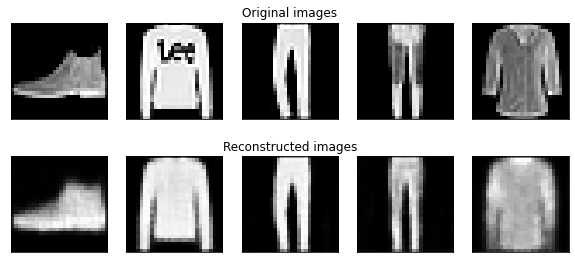

partial train loss (single batch): 6888.978027

partial train loss (single batch): 6840.191406

partial train loss (single batch): 6804.511719

partial train loss (single batch): 6771.790039

partial train loss (single batch): 6731.589355

partial train loss (single batch): 6462.912598

partial train loss (single batch): 6417.334961

partial train loss (single batch): 6270.649414

partial train loss (single batch): 6459.785156

partial train loss (single batch): 6401.299805

partial train loss (single batch): 6675.241699

partial train loss (single batch): 6802.942871

partial train loss (single batch): 6364.812012

partial train loss (single batch): 6582.010254

partial train loss (single batch): 6783.122559

partial train loss (single batch): 6711.653320

partial train loss (single batch): 6503.454590

partial train loss (single batch): 5992.522949

partial train loss (single batch): 6672.620605

partial train loss (single batch): 6600.712891

partial train loss (single batch): 6776.775879

partial train loss (single batch): 6549.375488

partial train loss (single batch): 6717.483887

partial train loss (single batch): 6458.249023

partial train loss (single batch): 6619.478516

partial train loss (single batch): 6219.989746

partial train loss (single batch): 6766.221191

partial train loss (single batch): 6437.000977

partial train loss (single batch): 6939.380859

partial train loss (single batch): 6392.226562

partial train loss (single batch): 6875.230957

partial train loss (single batch): 6405.738281

partial train loss (single batch): 6663.264160

partial train loss (single batch): 6979.918457

partial train loss (single batch): 6640.965820

partial train loss (single batch): 6634.125000

partial train loss (single batch): 6842.161133

partial train loss (single batch): 6520.125000

partial train loss (single batch): 6586.455078

partial train loss (single batch): 6532.309082

partial train loss (single batch): 6478.720215

partial train loss (single batch): 6471.903320

partial train loss (single batch): 6568.197754

partial train loss (single batch): 6886.718262

partial train loss (single batch): 6759.892578

partial train loss (single batch): 6342.333984

partial train loss (single batch): 6539.286133

partial train loss (single batch): 6607.827637

partial train loss (single batch): 6751.351562

partial train loss (single batch): 6523.137207

partial train loss (single batch): 6758.208008

partial train loss (single batch): 6527.816406

partial train loss (single batch): 6577.486328

partial train loss (single batch): 6541.053711

partial train loss (single batch): 6340.608887

partial train loss (single batch): 6840.040527

partial train loss (single batch): 6921.866211

partial train loss (single batch): 6700.955078

partial train loss (single batch): 6417.633789

partial train loss (single batch): 6465.996094

partial train loss (single batch): 6648.527344

partial train loss (single batch): 6602.041016

partial train loss (single batch): 6573.501465

partial train loss (single batch): 6950.497070

partial train loss (single batch): 6438.500000

partial train loss (single batch): 6426.139160

partial train loss (single batch): 6578.486328

partial train loss (single batch): 6622.707031

partial train loss (single batch): 6822.662109

partial train loss (single batch): 6380.554688

partial train loss (single batch): 6519.773438

partial train loss (single batch): 6338.911133

partial train loss (single batch): 6777.812500

partial train loss (single batch): 6380.676758

partial train loss (single batch): 6782.780762

partial train loss (single batch): 6842.932617

partial train loss (single batch): 6701.358398

partial train loss (single batch): 6499.466309

partial train loss (single batch): 6665.595215

partial train loss (single batch): 6480.594238

partial train loss (single batch): 6452.061523

partial train loss (single batch): 6953.116211

partial train loss (single batch): 6803.220703

partial train loss (single batch): 6630.661133

partial train loss (single batch): 6617.650879

partial train loss (single batch): 6391.581055

partial train loss (single batch): 6556.833008

partial train loss (single batch): 6719.779785

partial train loss (single batch): 6515.563477

partial train loss (single batch): 6834.959961

partial train loss (single batch): 6534.254883

partial train loss (single batch): 6349.465332

partial train loss (single batch): 6480.349121

partial train loss (single batch): 6519.007812

partial train loss (single batch): 6570.144531

partial train loss (single batch): 6596.568359

partial train loss (single batch): 6667.231934

partial train loss (single batch): 6768.960449

partial train loss (single batch): 6509.419434

partial train loss (single batch): 6808.978027

partial train loss (single batch): 6832.642578

partial train loss (single batch): 6907.515137

partial train loss (single batch): 6624.119141

partial train loss (single batch): 6660.331055

partial train loss (single batch): 6644.654785

partial train loss (single batch): 6452.922363

partial train loss (single batch): 6452.857910

partial train loss (single batch): 6576.935547

partial train loss (single batch): 6470.213867

partial train loss (single batch): 6402.269043

partial train loss (single batch): 6262.921875

partial train loss (single batch): 6782.487305

partial train loss (single batch): 6838.203125

partial train loss (single batch): 6423.375000

partial train loss (single batch): 6736.455078

partial train loss (single batch): 6490.507324

partial train loss (single batch): 6988.222656

partial train loss (single batch): 6689.647949

partial train loss (single batch): 6867.438477

partial train loss (single batch): 6569.981934

partial train loss (single batch): 6565.720703

partial train loss (single batch): 6704.790527

partial train loss (single batch): 6653.670898

partial train loss (single batch): 6369.631348

partial train loss (single batch): 6642.276367

partial train loss (single batch): 6684.347656

partial train loss (single batch): 6799.036133

partial train loss (single batch): 6622.895508

partial train loss (single batch): 6619.699219

partial train loss (single batch): 6826.487793

partial train loss (single batch): 6555.712891

partial train loss (single batch): 6547.763672

partial train loss (single batch): 6532.837402

partial train loss (single batch): 6442.597168

partial train loss (single batch): 7048.424316

partial train loss (single batch): 6539.937500

partial train loss (single batch): 6622.548828

partial train loss (single batch): 6585.140625

partial train loss (single batch): 6770.297852

partial train loss (single batch): 6531.112305

partial train loss (single batch): 6755.546875

partial train loss (single batch): 6873.194824

partial train loss (single batch): 6482.711426

partial train loss (single batch): 6585.482422

partial train loss (single batch): 6751.883301

partial train loss (single batch): 6675.285156

partial train loss (single batch): 6611.262695

partial train loss (single batch): 6638.496582

partial train loss (single batch): 6392.856445

partial train loss (single batch): 6643.206055

partial train loss (single batch): 6630.163086

partial train loss (single batch): 6755.698242

partial train loss (single batch): 6346.291992

partial train loss (single batch): 6610.372070

partial train loss (single batch): 6346.312988

partial train loss (single batch): 6682.581055

partial train loss (single batch): 6428.755859

partial train loss (single batch): 6727.603027

partial train loss (single batch): 6461.424805

partial train loss (single batch): 6554.478516

partial train loss (single batch): 6595.703125

partial train loss (single batch): 6707.604492

partial train loss (single batch): 6712.580078

partial train loss (single batch): 6858.654297

partial train loss (single batch): 6752.807129

partial train loss (single batch): 6708.157227

partial train loss (single batch): 6936.331543

partial train loss (single batch): 6507.996582

partial train loss (single batch): 6939.521484

partial train loss (single batch): 6522.760254

partial train loss (single batch): 6692.258789

partial train loss (single batch): 6674.353027

partial train loss (single batch): 6542.661133

partial train loss (single batch): 6531.447754

partial train loss (single batch): 6476.466797

partial train loss (single batch): 6616.607422

partial train loss (single batch): 6612.181641

partial train loss (single batch): 6276.265625

partial train loss (single batch): 6585.065918

partial train loss (single batch): 6523.076660

partial train loss (single batch): 6553.304688

partial train loss (single batch): 6805.750977

partial train loss (single batch): 6406.701172

partial train loss (single batch): 6506.140137

partial train loss (single batch): 6841.441895

partial train loss (single batch): 6763.088867

partial train loss (single batch): 6716.085938

partial train loss (single batch): 3376.164551

EPOCH 27/30     train loss 25.847       val loss 26.120

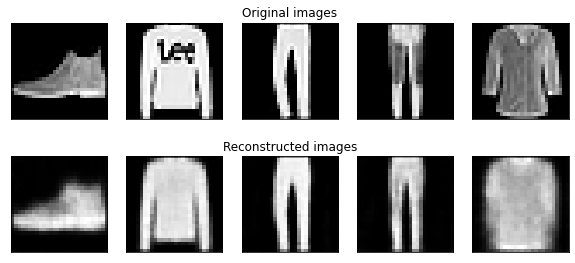

partial train loss (single batch): 6912.920898

partial train loss (single batch): 6895.169922

partial train loss (single batch): 6811.390137

partial train loss (single batch): 6837.943359

partial train loss (single batch): 6819.446777

partial train loss (single batch): 6487.369141

partial train loss (single batch): 6470.903320

partial train loss (single batch): 6245.748047

partial train loss (single batch): 6500.083008

partial train loss (single batch): 6385.203125

partial train loss (single batch): 6659.045898

partial train loss (single batch): 6948.298828

partial train loss (single batch): 6474.088867

partial train loss (single batch): 6559.036133

partial train loss (single batch): 6783.799316

partial train loss (single batch): 6788.812500

partial train loss (single batch): 6475.459961

partial train loss (single batch): 6072.389648

partial train loss (single batch): 6666.229492

partial train loss (single batch): 6575.410156

partial train loss (single batch): 6807.816406

partial train loss (single batch): 6541.660156

partial train loss (single batch): 6687.885742

partial train loss (single batch): 6478.940918

partial train loss (single batch): 6671.832520

partial train loss (single batch): 6278.731934

partial train loss (single batch): 6778.463867

partial train loss (single batch): 6475.785156

partial train loss (single batch): 6983.466309

partial train loss (single batch): 6411.095215

partial train loss (single batch): 6992.616211

partial train loss (single batch): 6471.487305

partial train loss (single batch): 6632.083496

partial train loss (single batch): 7045.093750

partial train loss (single batch): 6653.353516

partial train loss (single batch): 6714.893555

partial train loss (single batch): 6833.731934

partial train loss (single batch): 6516.020508

partial train loss (single batch): 6549.389160

partial train loss (single batch): 6577.284180

partial train loss (single batch): 6498.411621

partial train loss (single batch): 6475.503418

partial train loss (single batch): 6514.673828

partial train loss (single batch): 6841.707520

partial train loss (single batch): 6655.448730

partial train loss (single batch): 6300.333008

partial train loss (single batch): 6417.071289

partial train loss (single batch): 6652.743164

partial train loss (single batch): 6717.750977

partial train loss (single batch): 6471.501465

partial train loss (single batch): 6748.725586

partial train loss (single batch): 6478.583496

partial train loss (single batch): 6566.471191

partial train loss (single batch): 6539.024414

partial train loss (single batch): 6323.431641

partial train loss (single batch): 6838.854492

partial train loss (single batch): 6959.450195

partial train loss (single batch): 6690.801758

partial train loss (single batch): 6516.433594

partial train loss (single batch): 6478.658691

partial train loss (single batch): 6610.136719

partial train loss (single batch): 6600.765625

partial train loss (single batch): 6551.099609

partial train loss (single batch): 6941.235352

partial train loss (single batch): 6431.907715

partial train loss (single batch): 6396.291504

partial train loss (single batch): 6525.718262

partial train loss (single batch): 6567.432617

partial train loss (single batch): 6736.165039

partial train loss (single batch): 6309.369141

partial train loss (single batch): 6526.391602

partial train loss (single batch): 6400.145996

partial train loss (single batch): 6896.652344

partial train loss (single batch): 6480.759766

partial train loss (single batch): 6758.639648

partial train loss (single batch): 6830.386719

partial train loss (single batch): 6735.230469

partial train loss (single batch): 6444.855469

partial train loss (single batch): 6705.513672

partial train loss (single batch): 6516.020508

partial train loss (single batch): 6403.340332

partial train loss (single batch): 6971.131836

partial train loss (single batch): 6860.971680

partial train loss (single batch): 6585.702148

partial train loss (single batch): 6627.467773

partial train loss (single batch): 6383.447754

partial train loss (single batch): 6531.503418

partial train loss (single batch): 6769.762207

partial train loss (single batch): 6504.196289

partial train loss (single batch): 6767.414062

partial train loss (single batch): 6625.451172

partial train loss (single batch): 6368.130371

partial train loss (single batch): 6542.439941

partial train loss (single batch): 6576.000000

partial train loss (single batch): 6536.274902

partial train loss (single batch): 6685.261719

partial train loss (single batch): 6716.188477

partial train loss (single batch): 6838.525391

partial train loss (single batch): 6544.911621

partial train loss (single batch): 6793.904297

partial train loss (single batch): 6806.148438

partial train loss (single batch): 6935.809082

partial train loss (single batch): 6654.801758

partial train loss (single batch): 6635.921387

partial train loss (single batch): 6643.665039

partial train loss (single batch): 6447.803711

partial train loss (single batch): 6414.201172

partial train loss (single batch): 6533.212402

partial train loss (single batch): 6504.340820

partial train loss (single batch): 6391.568359

partial train loss (single batch): 6304.889648

partial train loss (single batch): 6843.370117

partial train loss (single batch): 6768.503906

partial train loss (single batch): 6371.891602

partial train loss (single batch): 6782.272461

partial train loss (single batch): 6453.656250

partial train loss (single batch): 6945.321289

partial train loss (single batch): 6625.085938

partial train loss (single batch): 6820.333984

partial train loss (single batch): 6579.494629

partial train loss (single batch): 6499.955078

partial train loss (single batch): 6711.707520

partial train loss (single batch): 6606.126953

partial train loss (single batch): 6366.421875

partial train loss (single batch): 6601.866211

partial train loss (single batch): 6588.226562

partial train loss (single batch): 6744.220215

partial train loss (single batch): 6658.975586

partial train loss (single batch): 6632.529297

partial train loss (single batch): 6833.134766

partial train loss (single batch): 6540.650391

partial train loss (single batch): 6484.716797

partial train loss (single batch): 6465.502930

partial train loss (single batch): 6519.035156

partial train loss (single batch): 6971.098633

partial train loss (single batch): 6470.203125

partial train loss (single batch): 6618.872559

partial train loss (single batch): 6558.587891

partial train loss (single batch): 6756.413574

partial train loss (single batch): 6594.684082

partial train loss (single batch): 6720.180176

partial train loss (single batch): 6884.634766

partial train loss (single batch): 6520.517090

partial train loss (single batch): 6571.978516

partial train loss (single batch): 6669.832520

partial train loss (single batch): 6670.177734

partial train loss (single batch): 6550.319336

partial train loss (single batch): 6670.096680

partial train loss (single batch): 6444.629883

partial train loss (single batch): 6702.890625

partial train loss (single batch): 6599.864746

partial train loss (single batch): 6693.784180

partial train loss (single batch): 6402.752441

partial train loss (single batch): 6755.847656

partial train loss (single batch): 6413.005859

partial train loss (single batch): 6624.093750

partial train loss (single batch): 6384.737305

partial train loss (single batch): 6729.802734

partial train loss (single batch): 6427.480469

partial train loss (single batch): 6602.364258

partial train loss (single batch): 6597.881836

partial train loss (single batch): 6713.365723

partial train loss (single batch): 6677.118652

partial train loss (single batch): 6830.041992

partial train loss (single batch): 6744.178711

partial train loss (single batch): 6737.253418

partial train loss (single batch): 6876.741211

partial train loss (single batch): 6477.297852

partial train loss (single batch): 6892.258789

partial train loss (single batch): 6555.104492

partial train loss (single batch): 6679.333984

partial train loss (single batch): 6566.200195

partial train loss (single batch): 6592.070312

partial train loss (single batch): 6550.851074

partial train loss (single batch): 6515.234375

partial train loss (single batch): 6593.445312

partial train loss (single batch): 6529.331543

partial train loss (single batch): 6284.312500

partial train loss (single batch): 6583.312988

partial train loss (single batch): 6594.849609

partial train loss (single batch): 6462.725098

partial train loss (single batch): 6802.230957

partial train loss (single batch): 6419.520508

partial train loss (single batch): 6532.343750

partial train loss (single batch): 6853.212891

partial train loss (single batch): 6832.671875

partial train loss (single batch): 6746.090332

partial train loss (single batch): 3335.965576

EPOCH 28/30     train loss 25.855       val loss 25.924

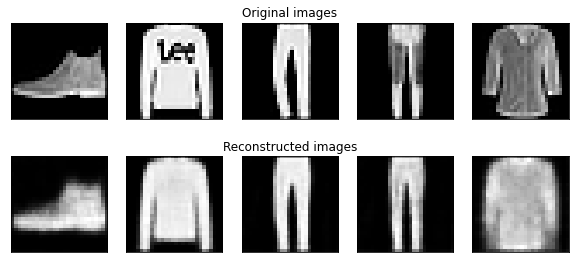

partial train loss (single batch): 6897.539062

partial train loss (single batch): 6850.606445

partial train loss (single batch): 6850.993652

partial train loss (single batch): 6733.497070

partial train loss (single batch): 6728.416016

partial train loss (single batch): 6434.242188

partial train loss (single batch): 6521.449219

partial train loss (single batch): 6253.818359

partial train loss (single batch): 6516.588867

partial train loss (single batch): 6369.242188

partial train loss (single batch): 6643.661133

partial train loss (single batch): 6821.149902

partial train loss (single batch): 6458.666016

partial train loss (single batch): 6588.464844

partial train loss (single batch): 6742.164551

partial train loss (single batch): 6672.900879

partial train loss (single batch): 6552.116211

partial train loss (single batch): 6013.328125

partial train loss (single batch): 6603.596191

partial train loss (single batch): 6556.483398

partial train loss (single batch): 6803.049805

partial train loss (single batch): 6493.433594

partial train loss (single batch): 6694.869141

partial train loss (single batch): 6447.404297

partial train loss (single batch): 6645.833008

partial train loss (single batch): 6174.903320

partial train loss (single batch): 6726.263672

partial train loss (single batch): 6443.664062

partial train loss (single batch): 7022.081055

partial train loss (single batch): 6420.370605

partial train loss (single batch): 6874.637695

partial train loss (single batch): 6442.194824

partial train loss (single batch): 6595.010742

partial train loss (single batch): 6919.440918

partial train loss (single batch): 6603.446289

partial train loss (single batch): 6630.066406

partial train loss (single batch): 6776.361328

partial train loss (single batch): 6499.093750

partial train loss (single batch): 6512.541992

partial train loss (single batch): 6573.071289

partial train loss (single batch): 6446.465820

partial train loss (single batch): 6485.824219

partial train loss (single batch): 6566.300781

partial train loss (single batch): 6748.729492

partial train loss (single batch): 6731.175781

partial train loss (single batch): 6299.838379

partial train loss (single batch): 6490.593750

partial train loss (single batch): 6587.020020

partial train loss (single batch): 6647.817383

partial train loss (single batch): 6512.758301

partial train loss (single batch): 6714.974609

partial train loss (single batch): 6496.775391

partial train loss (single batch): 6553.171875

partial train loss (single batch): 6506.619141

partial train loss (single batch): 6339.028809

partial train loss (single batch): 6856.097168

partial train loss (single batch): 6930.427734

partial train loss (single batch): 6673.587891

partial train loss (single batch): 6455.277344

partial train loss (single batch): 6515.530273

partial train loss (single batch): 6665.195312

partial train loss (single batch): 6594.328613

partial train loss (single batch): 6551.085938

partial train loss (single batch): 7007.776367

partial train loss (single batch): 6461.043457

partial train loss (single batch): 6377.443359

partial train loss (single batch): 6518.251953

partial train loss (single batch): 6645.791016

partial train loss (single batch): 6764.759277

partial train loss (single batch): 6368.983398

partial train loss (single batch): 6500.066406

partial train loss (single batch): 6355.075684

partial train loss (single batch): 6863.434570

partial train loss (single batch): 6442.050293

partial train loss (single batch): 6715.726562

partial train loss (single batch): 6886.088867

partial train loss (single batch): 6803.671875

partial train loss (single batch): 6514.378906

partial train loss (single batch): 6673.488770

partial train loss (single batch): 6513.049805

partial train loss (single batch): 6461.983887

partial train loss (single batch): 6947.417969

partial train loss (single batch): 6790.057617

partial train loss (single batch): 6611.488281

partial train loss (single batch): 6665.136230

partial train loss (single batch): 6474.618164

partial train loss (single batch): 6527.702148

partial train loss (single batch): 6764.333984

partial train loss (single batch): 6464.085938

partial train loss (single batch): 6773.734375

partial train loss (single batch): 6600.635742

partial train loss (single batch): 6349.517578

partial train loss (single batch): 6499.389160

partial train loss (single batch): 6545.036133

partial train loss (single batch): 6525.791992

partial train loss (single batch): 6643.945312

partial train loss (single batch): 6598.650391

partial train loss (single batch): 6781.169922

partial train loss (single batch): 6481.126953

partial train loss (single batch): 6804.094727

partial train loss (single batch): 6830.860840

partial train loss (single batch): 6910.280273

partial train loss (single batch): 6619.898438

partial train loss (single batch): 6656.048340

partial train loss (single batch): 6647.384277

partial train loss (single batch): 6475.483398

partial train loss (single batch): 6400.154297

partial train loss (single batch): 6489.035645

partial train loss (single batch): 6453.915039

partial train loss (single batch): 6402.005859

partial train loss (single batch): 6244.198242

partial train loss (single batch): 6783.901855

partial train loss (single batch): 6672.484375

partial train loss (single batch): 6360.160156

partial train loss (single batch): 6722.872559

partial train loss (single batch): 6470.976562

partial train loss (single batch): 6999.626465

partial train loss (single batch): 6640.527344

partial train loss (single batch): 6807.629883

partial train loss (single batch): 6536.981445

partial train loss (single batch): 6560.134766

partial train loss (single batch): 6650.525879

partial train loss (single batch): 6574.951172

partial train loss (single batch): 6363.842285

partial train loss (single batch): 6608.397461

partial train loss (single batch): 6662.993164

partial train loss (single batch): 6717.283203

partial train loss (single batch): 6605.228516

partial train loss (single batch): 6673.312500

partial train loss (single batch): 6795.651855

partial train loss (single batch): 6495.528320

partial train loss (single batch): 6487.013184

partial train loss (single batch): 6502.719727

partial train loss (single batch): 6484.054688

partial train loss (single batch): 6993.916016

partial train loss (single batch): 6438.157227

partial train loss (single batch): 6645.236816

partial train loss (single batch): 6585.574707

partial train loss (single batch): 6704.271484

partial train loss (single batch): 6518.505859

partial train loss (single batch): 6736.203125

partial train loss (single batch): 6867.864746

partial train loss (single batch): 6516.533203

partial train loss (single batch): 6523.628906

partial train loss (single batch): 6681.903320

partial train loss (single batch): 6651.734375

partial train loss (single batch): 6540.128906

partial train loss (single batch): 6699.677246

partial train loss (single batch): 6455.518555

partial train loss (single batch): 6672.936523

partial train loss (single batch): 6559.426758

partial train loss (single batch): 6683.584961

partial train loss (single batch): 6313.328613

partial train loss (single batch): 6618.620605

partial train loss (single batch): 6402.983398

partial train loss (single batch): 6636.662109

partial train loss (single batch): 6502.583984

partial train loss (single batch): 6696.093262

partial train loss (single batch): 6472.074219

partial train loss (single batch): 6527.009766

partial train loss (single batch): 6587.007812

partial train loss (single batch): 6730.913086

partial train loss (single batch): 6648.765625

partial train loss (single batch): 6797.151855

partial train loss (single batch): 6652.032227

partial train loss (single batch): 6747.917480

partial train loss (single batch): 6847.602051

partial train loss (single batch): 6491.286133

partial train loss (single batch): 6856.241211

partial train loss (single batch): 6575.647461

partial train loss (single batch): 6688.840820

partial train loss (single batch): 6687.410156

partial train loss (single batch): 6623.535645

partial train loss (single batch): 6554.962891

partial train loss (single batch): 6514.872559

partial train loss (single batch): 6565.726562

partial train loss (single batch): 6673.211914

partial train loss (single batch): 6326.824219

partial train loss (single batch): 6597.254883

partial train loss (single batch): 6570.724121

partial train loss (single batch): 6521.376953

partial train loss (single batch): 6778.706055

partial train loss (single batch): 6423.362305

partial train loss (single batch): 6474.854980

partial train loss (single batch): 6916.644531

partial train loss (single batch): 6785.729004

partial train loss (single batch): 6726.377930

partial train loss (single batch): 3351.110840

EPOCH 29/30     train loss 25.810       val loss 26.071

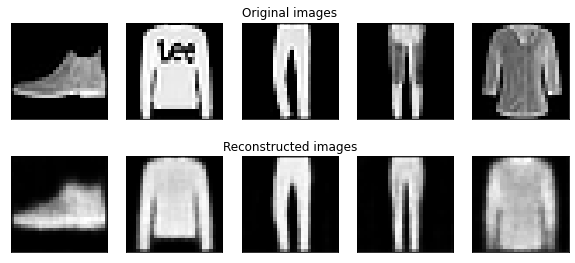

partial train loss (single batch): 6939.572266

partial train loss (single batch): 6877.812988

partial train loss (single batch): 6720.056641

partial train loss (single batch): 6757.371094

partial train loss (single batch): 6752.877930

partial train loss (single batch): 6530.988281

partial train loss (single batch): 6453.741699

partial train loss (single batch): 6315.710449

partial train loss (single batch): 6523.419922

partial train loss (single batch): 6434.676758

partial train loss (single batch): 6672.293945

partial train loss (single batch): 6841.207031

partial train loss (single batch): 6460.554688

partial train loss (single batch): 6586.323242

partial train loss (single batch): 6782.900391

partial train loss (single batch): 6689.526367

partial train loss (single batch): 6493.509277

partial train loss (single batch): 6027.678711

partial train loss (single batch): 6714.293945

partial train loss (single batch): 6660.042969

partial train loss (single batch): 6770.632324

partial train loss (single batch): 6538.442871

partial train loss (single batch): 6751.046875

partial train loss (single batch): 6476.492188

partial train loss (single batch): 6649.747070

partial train loss (single batch): 6180.516113

partial train loss (single batch): 6845.308105

partial train loss (single batch): 6467.445312

partial train loss (single batch): 6943.530273

partial train loss (single batch): 6480.294922

partial train loss (single batch): 6887.816895

partial train loss (single batch): 6431.997559

partial train loss (single batch): 6595.038086

partial train loss (single batch): 6938.615234

partial train loss (single batch): 6622.181641

partial train loss (single batch): 6631.669922

partial train loss (single batch): 6843.294434

partial train loss (single batch): 6521.290527

partial train loss (single batch): 6513.985352

partial train loss (single batch): 6529.116211

partial train loss (single batch): 6441.876953

partial train loss (single batch): 6615.770508

partial train loss (single batch): 6562.836914

partial train loss (single batch): 6714.957520

partial train loss (single batch): 6709.920410

partial train loss (single batch): 6347.026367

partial train loss (single batch): 6459.624023

partial train loss (single batch): 6548.452148

partial train loss (single batch): 6720.222656

partial train loss (single batch): 6490.514648

partial train loss (single batch): 6671.276367

partial train loss (single batch): 6499.757324

partial train loss (single batch): 6553.910156

partial train loss (single batch): 6498.934082

partial train loss (single batch): 6282.171387

partial train loss (single batch): 6917.006836

partial train loss (single batch): 6915.482422

partial train loss (single batch): 6716.246094

partial train loss (single batch): 6433.751953

partial train loss (single batch): 6464.452148

partial train loss (single batch): 6661.019531

partial train loss (single batch): 6595.786621

partial train loss (single batch): 6553.757812

partial train loss (single batch): 6907.142578

partial train loss (single batch): 6446.421387

partial train loss (single batch): 6427.304199

partial train loss (single batch): 6493.373047

partial train loss (single batch): 6673.250000

partial train loss (single batch): 6780.590820

partial train loss (single batch): 6387.086426

partial train loss (single batch): 6475.708008

partial train loss (single batch): 6321.821289

partial train loss (single batch): 6807.939453

partial train loss (single batch): 6388.635742

partial train loss (single batch): 6690.976562

partial train loss (single batch): 6886.881348

partial train loss (single batch): 6795.524902

partial train loss (single batch): 6486.648438

partial train loss (single batch): 6654.411133

partial train loss (single batch): 6492.027344

partial train loss (single batch): 6452.660156

partial train loss (single batch): 6963.554688

partial train loss (single batch): 6758.770508

partial train loss (single batch): 6607.713867

partial train loss (single batch): 6641.786133

partial train loss (single batch): 6394.060547

partial train loss (single batch): 6540.009277

partial train loss (single batch): 6811.735352

partial train loss (single batch): 6567.275879

partial train loss (single batch): 6796.737305

partial train loss (single batch): 6530.517090

partial train loss (single batch): 6309.147949

partial train loss (single batch): 6507.074707

partial train loss (single batch): 6535.115723

partial train loss (single batch): 6615.312500

partial train loss (single batch): 6566.427734

partial train loss (single batch): 6575.953125

partial train loss (single batch): 6838.946289

partial train loss (single batch): 6567.915039

partial train loss (single batch): 6777.987305

partial train loss (single batch): 6878.219238

partial train loss (single batch): 6884.579590

partial train loss (single batch): 6616.569824

partial train loss (single batch): 6640.569336

partial train loss (single batch): 6663.558594

partial train loss (single batch): 6500.967773

partial train loss (single batch): 6379.188477

partial train loss (single batch): 6556.832031

partial train loss (single batch): 6472.672852

partial train loss (single batch): 6493.075195

partial train loss (single batch): 6281.931641

partial train loss (single batch): 6764.482422

partial train loss (single batch): 6721.912598

partial train loss (single batch): 6367.401855

partial train loss (single batch): 6747.633301

partial train loss (single batch): 6472.296875

partial train loss (single batch): 6910.453613

partial train loss (single batch): 6648.017578

partial train loss (single batch): 6856.356445

partial train loss (single batch): 6504.629395

partial train loss (single batch): 6523.643066

partial train loss (single batch): 6630.337891

partial train loss (single batch): 6578.237305

partial train loss (single batch): 6387.851074

partial train loss (single batch): 6650.515625

partial train loss (single batch): 6610.698242

partial train loss (single batch): 6811.016602

partial train loss (single batch): 6653.671875

partial train loss (single batch): 6585.167969

partial train loss (single batch): 6743.638672

partial train loss (single batch): 6543.288086

partial train loss (single batch): 6563.620117

partial train loss (single batch): 6533.558594

partial train loss (single batch): 6546.550781

partial train loss (single batch): 6987.339355

partial train loss (single batch): 6536.755859

partial train loss (single batch): 6568.906250

partial train loss (single batch): 6640.051270

partial train loss (single batch): 6789.067871

partial train loss (single batch): 6600.237305

partial train loss (single batch): 6686.159180

partial train loss (single batch): 6855.266602

partial train loss (single batch): 6559.887695

partial train loss (single batch): 6615.244141

partial train loss (single batch): 6743.016602

partial train loss (single batch): 6582.568848

partial train loss (single batch): 6587.108398

partial train loss (single batch): 6665.515625

partial train loss (single batch): 6433.797852

partial train loss (single batch): 6684.585449

partial train loss (single batch): 6639.928711

partial train loss (single batch): 6676.021973

partial train loss (single batch): 6387.596191

partial train loss (single batch): 6625.028320

partial train loss (single batch): 6418.705566

partial train loss (single batch): 6601.267090

partial train loss (single batch): 6401.012207

partial train loss (single batch): 6795.868164

partial train loss (single batch): 6472.415039

partial train loss (single batch): 6535.916992

partial train loss (single batch): 6644.268066

partial train loss (single batch): 6674.454102

partial train loss (single batch): 6741.041016

partial train loss (single batch): 6770.021484

partial train loss (single batch): 6687.169922

partial train loss (single batch): 6709.820312

partial train loss (single batch): 6797.660645

partial train loss (single batch): 6484.350586

partial train loss (single batch): 6864.464355

partial train loss (single batch): 6547.255371

partial train loss (single batch): 6715.966309

partial train loss (single batch): 6703.911133

partial train loss (single batch): 6565.806641

partial train loss (single batch): 6478.246094

partial train loss (single batch): 6514.298340

partial train loss (single batch): 6576.920898

partial train loss (single batch): 6573.827148

partial train loss (single batch): 6252.399414

partial train loss (single batch): 6486.803223

partial train loss (single batch): 6517.013184

partial train loss (single batch): 6509.045898

partial train loss (single batch): 6783.567383

partial train loss (single batch): 6398.317383

partial train loss (single batch): 6485.511719

partial train loss (single batch): 6799.490723

partial train loss (single batch): 6756.314941

partial train loss (single batch): 6711.408203

partial train loss (single batch): 3299.852295

EPOCH 30/30     train loss 25.824       val loss 25.991

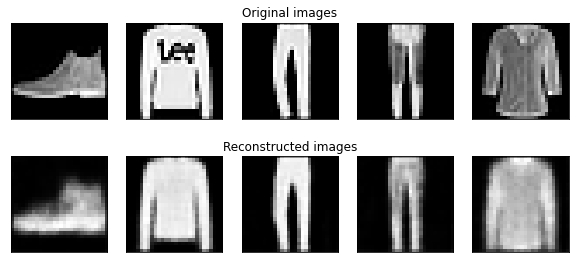

In [75]:
num_epochs = 30
for epoch in range(num_epochs):

   train_loss = train_epoch(vae,device,train_loader,optim)
   val_loss = test_epoch(vae,device,valid_loader)
   print('\n EPOCH {}/{} \t train loss {:.3f} \t val loss {:.3f}'.format(epoch + 1, num_epochs,train_loss,val_loss))

   plot_ae_outputs(vae.encoder,vae.decoder,n=5)

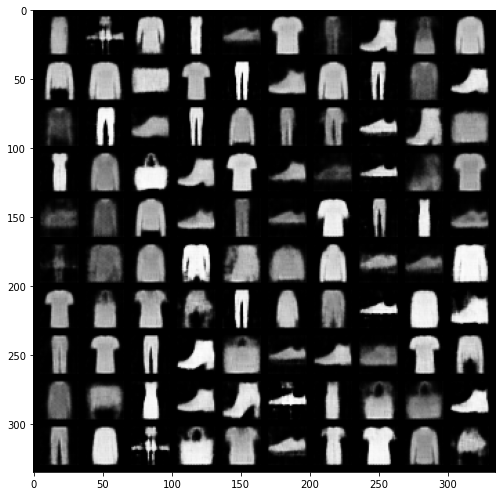

In [76]:
def show_image(img):
    npimg = img.numpy()
    plt.imshow(np.transpose(npimg, (1, 2, 0)))


vae.eval()

with torch.no_grad():

    # sample latent vectors from the normal distribution
    latent = torch.randn(128, d, device=device)

    # reconstruct images from the latent vectors
    img_recon = vae.decoder(latent)
    img_recon = img_recon.cpu()

    fig, ax = plt.subplots(figsize=(20, 8.5))
    show_image(torchvision.utils.make_grid(img_recon.data[:100],10,5))
    plt.show()

Visualize latent space

In [77]:
encoded_samples = []
for sample in tqdm(test_dataset):
    img = sample[0].unsqueeze(0).to(device)
    label = sample[1]
    # Encode image
    vae.eval()
    with torch.no_grad():
        encoded_img  = vae.encoder(img)
    # Append to list
    encoded_img = encoded_img.flatten().cpu().numpy()
    encoded_sample = {f"Enc. Variable {i}": enc for i, enc in enumerate(encoded_img)}
    encoded_sample['label'] = label
    encoded_samples.append(encoded_sample)

100%|██████████| 10000/10000 [00:18<00:00, 538.03it/s]


In [78]:
encoded_samples = pd.DataFrame(encoded_samples)
encoded_samples

,Enc. Variable 0,Enc. Variable 1,Enc. Variable 2,Enc. Variable 3,label
0,1.200834,0.150658,0.894115,0.854137,9
1,-1.105771,0.759910,-0.212611,-0.858782,2
2,-0.388111,-1.195204,-1.288223,-0.560933,1
3,-0.112326,-1.181160,-0.391261,0.136273,1
4,0.042326,0.290163,-0.466900,-0.229826,6
...,...,...,...,...,...
9995,0.400516,1.169681,-0.024173,0.885462,9
9996,0.020385,-1.023208,-0.043051,0.206292,1
9997,1.376207,-0.370118,0.968140,0.112483,8
9998,0.573991,-1.774500,-0.011197,0.108633,1


In [79]:
from sklearn.manifold import TSNE
import plotly.express as px

In [80]:
px.scatter(encoded_samples, x='Enc. Variable 0', y='Enc. Variable 1', color=encoded_samples.label.astype(str), opacity=0.7)

In [81]:
tsne = TSNE(n_components=2)
tsne_results = tsne.fit_transform(encoded_samples.drop(['label'],axis=1))

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.



In [82]:
fig = px.scatter(tsne_results, x=0, y=1, color=encoded_samples.label.astype(str),labels={'0': 'tsne-2d-one', '1': 'tsne-2d-two'})
fig.show()

Fine tuning

In [102]:
class Supervised_decoder(pl.LightningModule):

    def __init__(self, encoded_space_dim, pre_net):

        super().__init__()
        # Encoder
        self.encoder = pre_net.encoder
        # Decoder is substituted with fine tuner with two fully connected layers
        # The first one is just like the first one of the decoder
        # The second one divides into 10 cathegories the outputs (10 digits)
        # the logsoftmax activation functions generates probability classes
        self.fine_tuner =  nn.Sequential( nn.Linear(encoded_space_dim, 64),
                                          nn.ReLU(True),
                                          nn.Linear(64, 10),
                                          nn.LogSoftmax()
                                         )
        
        self.accuracy = torchmetrics.Accuracy()# to evaluate final performances
        
    def forward(self, x):
        x = self.encoder(x)
        x = self.fine_tuner(x)
        return x

    def training_step(self, batch, batch_idx):
        # training_step defined the train loop. It is independent of forward
        x, y = batch
        z = self.forward(x)
        train_loss = self.loss_func(z, y)
        self.log('train_loss', train_loss)
        return train_loss
    
    def validation_step(self, batch, batch_idx, loss_name='valid_loss'):
        x, y = batch
        z = self.forward(x)
        valid_loss = self.loss_func(z, y)
        self.log(loss_name, valid_loss, prog_bar=True)
        return valid_loss
    
    def test_step(self, batch, batch_idx):
        x, y = batch
        z = self.forward(x)
        self.log('accuracy', self.accuracy(z, y), prog_bar=True)
        return self.accuracy(z, y)

    def configure_optimizers(self):
        lr  = 0.001
        wd  = 1e-05
        mom = 0.9
        optimizer = torch.optim.Adam(self.parameters(), lr=lr, weight_decay=wd)
        return optimizer
    
    def configure_loss(self, loss_func):
        self.loss_func = loss_func

In [ ]:
!pip install git+https://github.com/PytorchLightning/pytorch-lightning.git@master --upgrade

In [101]:
import torchmetrics

In [103]:
pre_net = AutoEncoder.load_from_checkpoint(checkpoint_path="best_net_checkpoints.ckpt", params=best_params).to(device)
fine_tuner = Supervised_decoder(best_params['encoded_space_dim'], pre_net)

# Freeze params
for param in fine_tuner.encoder.parameters():
    param.requires_grad = False

loss_func_NLL = torch.nn.NLLLoss()

fine_tuner.configure_loss(loss_func_NLL)
fine_tuner.to(device)


Supervised_decoder(
  (encoder): Sequential(
    (0): Conv2d(1, 9, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): ReLU()
    (2): Conv2d(9, 18, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (3): ReLU()
    (4): Conv2d(18, 36, kernel_size=(3, 3), stride=(2, 2))
    (5): ReLU()
    (6): Flatten(start_dim=1, end_dim=-1)
    (7): Linear(in_features=324, out_features=64, bias=True)
    (8): ReLU()
    (9): Linear(in_features=64, out_features=67, bias=True)
  )
  (fine_tuner): Sequential(
    (0): Linear(in_features=67, out_features=64, bias=True)
    (1): ReLU(inplace=True)
    (2): Linear(in_features=64, out_features=10, bias=True)
    (3): LogSoftmax(dim=None)
  )
  (accuracy): Accuracy()
  (loss_func): NLLLoss()
)

In [106]:
# Training fine tuner
trainer = pl.Trainer(gpus=0, max_epochs=30, progress_bar_refresh_rate=20, 
                     callbacks=[EarlyStopping(monitor='valid_loss')])

trainer.fit(fine_tuner, train_loader, valid_loader)

/usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/connectors/callback_connector.py:91: LightningDeprecationWarning:

Setting `Trainer(progress_bar_refresh_rate=20)` is deprecated in v1.5 and will be removed in v1.7. Please pass `pytorch_lightning.callbacks.progress.TQDMProgressBar` with `refresh_rate` directly to the Trainer's `callbacks` argument instead. Or, to disable the progress bar pass `enable_progress_bar = False` to the Trainer.

GPU available: True, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
/usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/trainer.py:1585: UserWarning:

GPU available but not used. Set the gpus flag in your trainer `Trainer(gpus=1)` or script `--gpus=1`.


  | Name       | Type       | Params
------------------------------------------
0 | encoder    | Sequential | 32.6 K
1 | fine_tuner | Sequential | 5.0 K 
2 | accuracy   | Accuracy   | 0     
3 | loss_func  | NLLLoss    | 0     
----

Validation sanity check: 0it [00:00, ?it/s]

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:141: UserWarning:

Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.



Training: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

In [105]:
# Test final accuracy
trainer.test(fine_tuner, test_loader)

/usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/data_loading.py:662: UserWarning:

Your `test_dataloader` has `shuffle=True`, it is strongly recommended that you turn this off for val/test/predict dataloaders.



Testing: 0it [00:00, ?it/s]

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:141: UserWarning:

Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.



--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'accuracy': 0.7871999740600586}
--------------------------------------------------------------------------------


[{'accuracy': 0.7871999740600586}]